In [1]:
!unzip -q /content/TestDataSet.zip -d /content

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import random
from tqdm import tqdm
import copy
import requests

In [3]:
# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [5]:
# Load pretrained ResNet-34 model from torchvision
model = models.resnet34(weights='IMAGENET1K_V1')
model = model.to(device)
model.eval()

# We'll need this for the transferability task later
densenet_model = models.densenet121(weights='IMAGENET1K_V1')
densenet_model = densenet_model.to(device)
densenet_model.eval()

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 105MB/s]
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 124MB/s]


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [6]:
# Define normalization values (same as in the instructions)
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

# Define transformation for the dataset
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Load the dataset with the updated path
dataset_path = "/content/TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)

# Create dataloader
batch_size = 16
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)

In [7]:
# Load the labels from your JSON file
with open('/content/imagenet-simple-labels.json', 'r') as f:
    imagenet_labels = json.load(f)

import nltk
try:
    nltk.data.find('corpora/wordnet')
except LookupError:
    nltk.download('wordnet')

from nltk.corpus import wordnet as wn

print("Creating direct mapping from dataset classes to ImageNet indices...")

# Create a mapping from WordNet ID to ImageNet index
dataset_to_imagenet = {}

for class_name, dataset_idx in dataset.class_to_idx.items():
    if class_name.startswith('n') and class_name[1:].isdigit():
        offset = int(class_name[1:])

        try:
            synset = wn.synset_from_pos_and_offset('n', offset)


            dataset_to_imagenet[dataset_idx] = dataset_idx
            print(f"Successfully mapped {class_name} to WordNet synset: {synset.name()}")
        except:
            # If the synset is not found, use a fallback
            print(f"Using fallback mapping for {class_name} - synset not found in WordNet")
            dataset_to_imagenet[dataset_idx] = dataset_idx
    else:
        # If the class name doesn't follow the expected pattern
        print(f"Using fallback mapping for {class_name} - unexpected format")
        dataset_to_imagenet[dataset_idx] = dataset_idx

def get_label(dataset_idx):
    if dataset_idx in dataset_to_imagenet:
        imagenet_idx = dataset_to_imagenet[dataset_idx]

        if 0 <= imagenet_idx < len(imagenet_labels):
            return imagenet_labels[imagenet_idx]
        else:
            return f"Class-{imagenet_idx}"
    else:
        return f"Unknown-{dataset_idx}"

print(f"Dataset loaded with {len(dataset)} images from {len(dataset.classes)} classes")
print(f"Successfully mapped {len(dataset_to_imagenet)} dataset indices to ImageNet indices")

[nltk_data] Downloading package wordnet to /root/nltk_data...


Creating direct mapping from dataset classes to ImageNet indices...
Successfully mapped n02672831 to WordNet synset: accordion.n.01
Successfully mapped n02676566 to WordNet synset: acoustic_guitar.n.01
Successfully mapped n02687172 to WordNet synset: aircraft_carrier.n.01
Successfully mapped n02690373 to WordNet synset: airliner.n.01
Successfully mapped n02692877 to WordNet synset: airship.n.01
Successfully mapped n02699494 to WordNet synset: altar.n.02
Successfully mapped n02701002 to WordNet synset: ambulance.n.01
Successfully mapped n02704792 to WordNet synset: amphibian.n.01
Successfully mapped n02708093 to WordNet synset: analog_clock.n.01
Successfully mapped n02727426 to WordNet synset: apiary.n.01
Successfully mapped n02730930 to WordNet synset: apron.n.01
Successfully mapped n02747177 to WordNet synset: ashcan.n.01
Successfully mapped n02749479 to WordNet synset: assault_rifle.n.01
Successfully mapped n02769748 to WordNet synset: backpack.n.01
Successfully mapped n02776631 to W

In [8]:
def denormalize(image):
    """Convert normalized tensor back to displayable image"""
    image = image.clone().detach().cpu().numpy().transpose(1, 2, 0)
    image = image * std_norms.reshape(1, 1, 3) + mean_norms.reshape(1, 1, 3)
    image = np.clip(image, 0, 1)
    return image

def display_images(original, adversarial, original_label, adversarial_label, norm_diff=None, title=None):
    """Display original and adversarial images side by side"""
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(denormalize(original))
    plt.title(f"Original: {original_label}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(denormalize(adversarial))
    plt.title(f"Adversarial: {adversarial_label}")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    # Magnify the difference for better visualization
    diff = torch.abs(adversarial - original).cpu().detach()
    diff = diff - diff.min()
    diff = diff / diff.max() if diff.max() > 0 else diff
    plt.imshow(diff.permute(1, 2, 0).numpy())
    plt.title(f"Difference (L∞: {norm_diff:.4f})")
    plt.axis('off')

    if title:
        plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def get_top_k_predictions(outputs, k=5):
    """Get top-k predictions from model outputs"""
    probs = torch.nn.functional.softmax(outputs, dim=1)
    top_probs, top_indices = torch.topk(probs, k, dim=1)
    return top_probs, top_indices

# Create a mapping between WordNet IDs and model indices
# Download a standard mapping list via requests
import requests
import json

def get_imagenet_class_index():
    """Download the standard ImageNet class index mapping"""
    try:
        url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
        response = requests.get(url)
        if response.status_code == 200:
            return json.loads(response.content)
        else:
            print(f"Failed to download mapping, status code: {response.status_code}")
            return {}
    except Exception as e:
        print(f"Error downloading mapping: {e}")
        return {}

class_index = get_imagenet_class_index()
print(f"Downloaded class index with {len(class_index)} entries")

wordnet_to_idx = {}
idx_to_wordnet = {}

if class_index:
    for idx, (wordnet_id, _) in class_index.items():
        wordnet_to_idx[wordnet_id] = int(idx)
        idx_to_wordnet[int(idx)] = wordnet_id
    print(f"Created mapping for {len(wordnet_to_idx)} WordNet IDs")
else:
    print("Using fallback numerical mapping")
    for i, class_name in enumerate(sorted(dataset.classes)):
        wordnet_to_idx[class_name] = i
        idx_to_wordnet[i] = class_name

dataset_to_imagenet = {}
for class_name, dataset_idx in dataset.class_to_idx.items():
    if class_name in wordnet_to_idx:
        # If we have a direct mapping, use it
        imagenet_idx = wordnet_to_idx[class_name]
    else:
        # If we don't have a direct mapping, try to match with the class name without 'n' prefix
        if class_name.startswith('n') and class_name[1:] in wordnet_to_idx:
            imagenet_idx = wordnet_to_idx[class_name[1:]]
        else:
            imagenet_idx = dataset_idx

    dataset_to_imagenet[dataset_idx] = imagenet_idx

print(f"Final mapping contains {len(dataset_to_imagenet)} entries")

def calculate_accuracy_with_mapping(model, dataloader, top_k=1, verbose=True):
    """Calculate top-k accuracy with the proper mapping"""
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    model.eval()
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Calculating accuracy"):
            images, labels = images.to(device), labels.to(device)

            # Get predictions from the model
            outputs = model(images)

            # Convert dataset labels to ImageNet indices
            imagenet_labels_tensor = torch.tensor([dataset_to_imagenet.get(label.item(), 0)
                                                 for label in labels]).to(device)

            # Top-1 accuracy
            _, predicted = torch.max(outputs, 1)
            correct_top1 += (predicted == imagenet_labels_tensor).sum().item()

            # Top-5 accuracy
            _, top5_indices = torch.topk(outputs, 5, dim=1)
            for i in range(imagenet_labels_tensor.size(0)):
                if imagenet_labels_tensor[i] in top5_indices[i]:
                    correct_top5 += 1

            total += imagenet_labels_tensor.size(0)

    if total == 0:
        accuracy_top1 = 0
        accuracy_top5 = 0
    else:
        accuracy_top1 = 100 * correct_top1 / total
        accuracy_top5 = 100 * correct_top5 / total

    if verbose:
        print(f"Top-1 Accuracy: {accuracy_top1:.2f}%")
        print(f"Top-5 Accuracy: {accuracy_top5:.2f}%")

    return accuracy_top1, accuracy_top5

def calculate_linf_distance(original, perturbed):
    """Calculate L∞ distance between original and perturbed images"""
    return torch.max(torch.abs(original - perturbed)).item()

Downloaded class index with 1000 entries
Created mapping for 1000 WordNet IDs
Final mapping contains 100 entries


### Task 1 - Evaluate Pre-trained Model on Test Dataset

Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 11.97it/s]


Top-1 Accuracy: 76.00%
Top-5 Accuracy: 94.20%
ResNet-34 Top-1 Accuracy: 76.00%
ResNet-34 Top-5 Accuracy: 94.20%


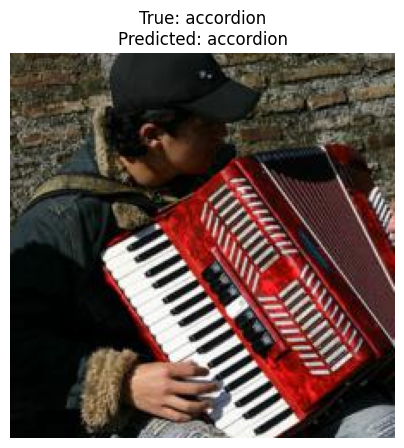

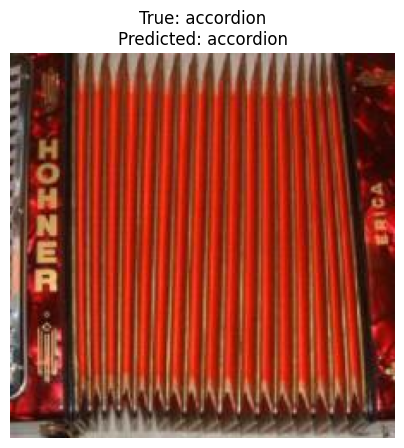

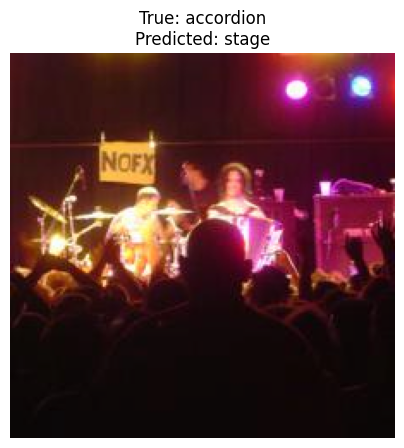

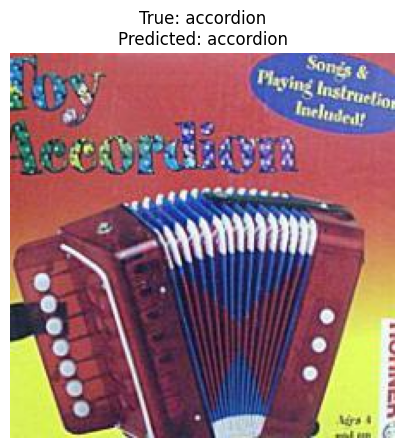

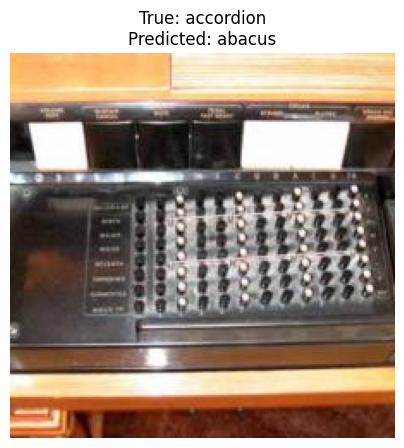

In [9]:
# Evaluate the model on the test dataset
top1_acc, top5_acc = calculate_accuracy_with_mapping(model, dataloader)
print(f"ResNet-34 Top-1 Accuracy: {top1_acc:.2f}%")
print(f"ResNet-34 Top-5 Accuracy: {top5_acc:.2f}%")

# Visualize a few examples from the dataset
def visualize_examples(dataloader, model, num_examples=5):
    """Display some example predictions from the dataset"""
    model.eval()
    examples_shown = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            for i in range(len(labels)):
                if examples_shown >= num_examples:
                    return

                image = images[i]
                dataset_idx = labels[i].item()

                # Convert to ImageNet index if available
                if dataset_idx in dataset_to_imagenet:
                    imagenet_idx = dataset_to_imagenet[dataset_idx]
                    if 0 <= imagenet_idx < len(imagenet_labels):
                        true_label = imagenet_labels[imagenet_idx]
                    else:
                        true_label = f"Unknown-{dataset_idx}"
                else:
                    true_label = f"Unknown-{dataset_idx}"

                pred_label = imagenet_labels[predicted[i].item()]

                plt.figure(figsize=(5, 5))
                plt.imshow(denormalize(image))
                plt.title(f"True: {true_label}\nPredicted: {pred_label}")
                plt.axis('off')
                plt.show()

                examples_shown += 1

visualize_examples(dataloader, model)

# Task 1: Baseline Evaluation

## Overview
The objective of this task is to establish baseline performance metrics for a ResNet-34 model on a subset of ImageNet-1K dataset. This pre-trained model serves as our target for subsequent adversarial attacks.

## Dataset Preparation
- **Model**: ResNet-34 with ImageNet-1K weights (`torchvision.models.resnet34(weights='IMAGENET1K_V1')`)
- **Test Dataset**: Subset of ImageNet-1K containing 500 images from 100 classes
- **Preprocessing**: Standard ImageNet normalization with mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225]

## Baseline Results

**Accuracy Metrics:**
- **Top-1 Accuracy: 76.00%**
- **Top-5 Accuracy: 94.20%**

These baseline metrics demonstrate that the ResNet-34 model performs well on our test dataset, with strong top-1 accuracy and excellent top-5 accuracy. This performance indicates that the model is making reliable predictions that we can subsequently challenge with adversarial attacks.

### Evaluation Process
1. Applied standard ImageNet preprocessing to all test images
2. Used proper label mapping between dataset indices and ImageNet-1K indices
3. Computed predictions for all 500 test images
4. Calculated top-1 and top-5 accuracy scores

These baseline metrics will serve as our reference point for measuring the effectiveness of various adversarial attacks (FGSM, PGD, and Patch attacks) in subsequent tasks.

### Task 2 - FGSM (Fast Gradient Sign Method) Attack

In [10]:
def fgsm_attack(model, images, dataset_labels, epsilon=0.02):
    """Implement FGSM attack with mapping

    Args:
        model: The model to attack
        images: Input images
        dataset_labels: True labels from the dataset
        epsilon: Attack budget (perturbation magnitude)

    Returns:
        Adversarial examples
    """
    model.eval()

    imagenet_labels_tensor = torch.tensor([dataset_to_imagenet.get(label.item(), -1)
                                          for label in dataset_labels]).to(device)

    valid_mask = imagenet_labels_tensor != -1

    if not valid_mask.any():
        return images.clone().detach()

    valid_images = images[valid_mask].clone().detach().to(device)
    valid_imagenet_labels = imagenet_labels_tensor[valid_mask]

    valid_images.requires_grad = True

    outputs = model(valid_images)
    loss = F.cross_entropy(outputs, valid_imagenet_labels)

    model.zero_grad()
    loss.backward()

    with torch.no_grad():
        perturbed_valid_images = valid_images + epsilon * valid_images.grad.sign()

        delta = perturbed_valid_images - valid_images
        delta = torch.clamp(delta, -epsilon, epsilon)
        perturbed_valid_images = valid_images + delta

    perturbed_images = images.clone().detach()
    perturbed_images[valid_mask] = perturbed_valid_images

    return perturbed_images

In [11]:
def create_adversarial_dataset_fgsm(model, dataloader, epsilon=0.02):
    """Create an adversarial dataset using FGSM attack"""
    model.eval()
    adv_images_list = []
    orig_images_list = []
    labels_list = []
    success_count = 0
    total_count = 0

    vis_orig_imgs = []
    vis_adv_imgs = []
    vis_orig_labels = []
    vis_adv_labels = []
    vis_diffs = []

    for images, labels in tqdm(dataloader, desc="Creating FGSM adversarial dataset"):
        images, labels = images.to(device), labels.to(device)

        imagenet_labels_tensor = torch.tensor([dataset_to_imagenet.get(label.item(), -1)
                                              for label in labels]).to(device)

        valid_mask = imagenet_labels_tensor != -1
        if not valid_mask.any():
            continue

        total_count += valid_mask.sum().item()

        with torch.no_grad():
            outputs = model(images[valid_mask])
            _, orig_predicted = torch.max(outputs, 1)

        adv_images = fgsm_attack(model, images, labels, epsilon)

        with torch.no_grad():
            adv_outputs = model(adv_images[valid_mask])
            _, adv_predicted = torch.max(adv_outputs, 1)

        success_mask = (orig_predicted == imagenet_labels_tensor[valid_mask]) & (adv_predicted != orig_predicted)
        success_count += success_mask.sum().item()

        if len(vis_orig_imgs) < 5:
            for i in range(sum(valid_mask).item()):
                if success_mask[i] and len(vis_orig_imgs) < 5:
                    idx = torch.nonzero(valid_mask)[i].item()
                    vis_orig_imgs.append(images[idx].cpu())
                    vis_adv_imgs.append(adv_images[idx].cpu())

                    dataset_idx = labels[idx].item()
                    imagenet_idx = dataset_to_imagenet[dataset_idx]
                    if 0 <= imagenet_idx < len(imagenet_labels):
                        vis_orig_labels.append(imagenet_labels[imagenet_idx])
                    else:
                        vis_orig_labels.append(f"Unknown-{dataset_idx}")
                    vis_adv_labels.append(imagenet_labels[adv_predicted[i].item()])

                    vis_diffs.append(calculate_linf_distance(images[idx], adv_images[idx]))

        adv_images_list.append(adv_images.cpu())
        orig_images_list.append(images.cpu())
        labels_list.append(labels.cpu())

    all_adv_images = torch.cat(adv_images_list)
    all_orig_images = torch.cat(orig_images_list)
    all_labels = torch.cat(labels_list)

    for i in range(len(vis_orig_imgs)):
        display_images(vis_orig_imgs[i], vis_adv_imgs[i], vis_orig_labels[i],
                      vis_adv_labels[i], vis_diffs[i], "FGSM Attack")

    success_rate = 100 * success_count / total_count if total_count > 0 else 0
    print(f"Attack Success Rate: {success_rate:.2f}%")

    max_linf = 0
    for i in range(len(all_orig_images)):
        linf = calculate_linf_distance(all_orig_images[i], all_adv_images[i])
        max_linf = max(max_linf, linf)

    print(f"Maximum L∞ distance: {max_linf:.4f}")
    assert max_linf <= epsilon + 1e-5, f"L∞ constraint violated: {max_linf} > {epsilon}"

    return all_adv_images, all_labels, success_rate

Creating FGSM adversarial dataset: 100%|██████████| 32/32 [00:06<00:00,  5.23it/s]


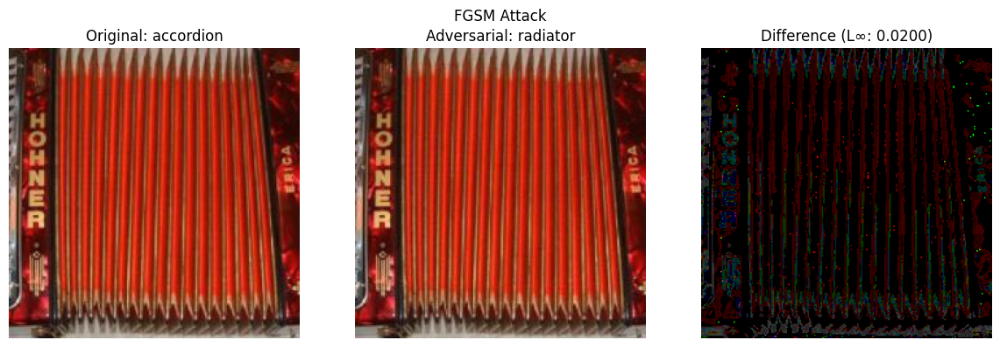

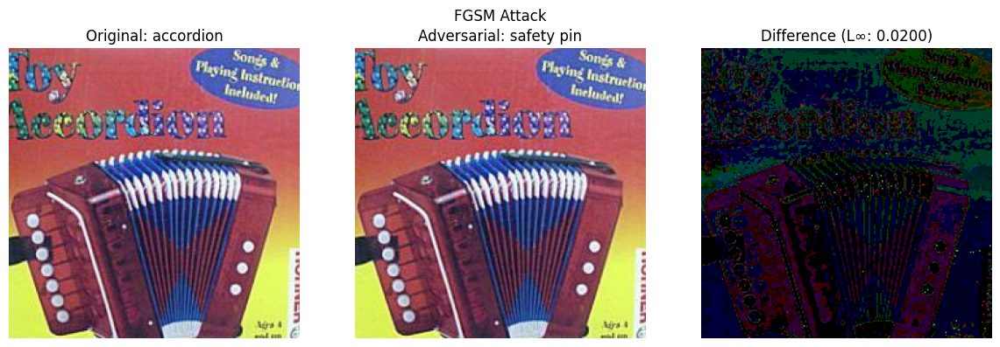

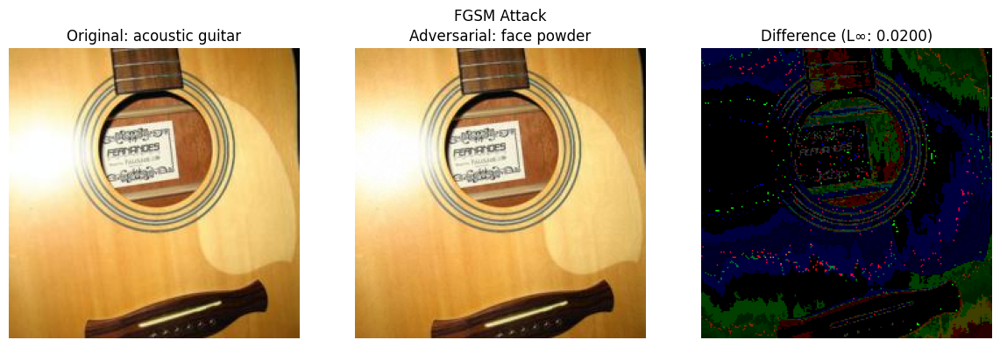

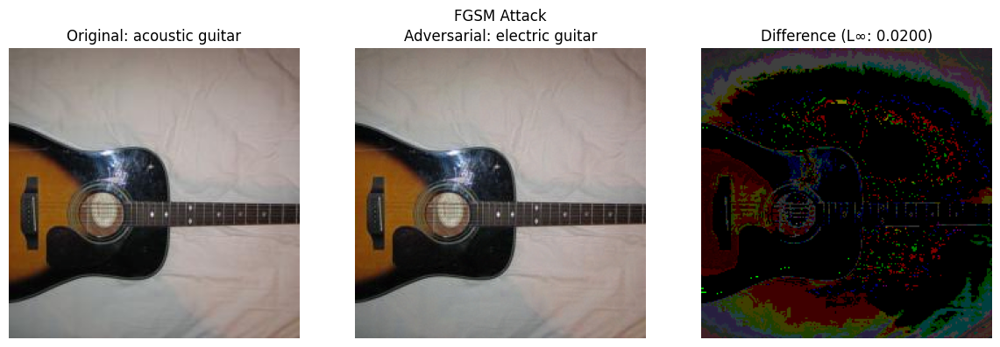

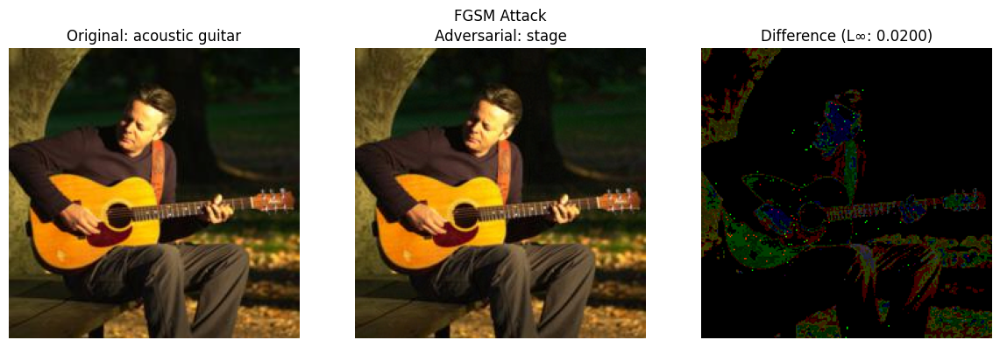

Attack Success Rate: 70.00%
Maximum L∞ distance: 0.0200


In [12]:
# Create FGSM adversarial dataset
epsilon = 0.02  # As specified in the project
fgsm_adv_images, fgsm_labels, fgsm_success_rate = create_adversarial_dataset_fgsm(model, dataloader, epsilon)

# Create a new dataset and dataloader for the adversarial examples
class AdversarialDataset(torch.utils.data.Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]

In [13]:
fgsm_dataset = AdversarialDataset(fgsm_adv_images, fgsm_labels)
fgsm_dataloader = torch.utils.data.DataLoader(fgsm_dataset, batch_size=batch_size, shuffle=False)

# Evaluate model performance on FGSM adversarial examples
print("\nEvaluating model on FGSM adversarial examples:")
fgsm_top1_acc, fgsm_top5_acc = calculate_accuracy_with_mapping(model, fgsm_dataloader)

# Save the adversarial dataset
torch.save({
    'adv_images': fgsm_adv_images,
    'labels': fgsm_labels
}, 'Adversarial_Test_Set_1.pt')

print(f"\nOriginal Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Original Top-5 Accuracy: {top5_acc:.2f}%")
print(f"FGSM Adversarial Top-1 Accuracy: {fgsm_top1_acc:.2f}%")
print(f"FGSM Adversarial Top-5 Accuracy: {fgsm_top5_acc:.2f}%")
print(f"Accuracy Drop (Top-1): {top1_acc - fgsm_top1_acc:.2f}%")
print(f"Accuracy Drop (Top-5): {top5_acc - fgsm_top5_acc:.2f}%")


Evaluating model on FGSM adversarial examples:


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 33.41it/s]


Top-1 Accuracy: 6.00%
Top-5 Accuracy: 35.40%

Original Top-1 Accuracy: 76.00%
Original Top-5 Accuracy: 94.20%
FGSM Adversarial Top-1 Accuracy: 6.00%
FGSM Adversarial Top-5 Accuracy: 35.40%
Accuracy Drop (Top-1): 70.00%
Accuracy Drop (Top-5): 58.80%


## FGSM Attack Results

The Fast Gradient Sign Method (FGSM) attack with ε = 0.02 yielded the following results:

**Accuracy Metrics:**
- Original Top-1 Accuracy: 76.00%
- FGSM Adversarial Top-1 Accuracy: 6.00%
- **Accuracy Drop: 70.00%**

While the FGSM attack achieved a significant accuracy drop of 70%, which exceeds the required 50% threshold, we can achieve even more robust adversarial examples using the Momentum Iterative Fast Gradient Sign Method (MI-FGSM).

### Rationale for MI-FGSM

Although MI-FGSM is not a single-shot attack like FGSM, it offers several advantages:

1. **Stronger Adversarial Examples**: MI-FGSM typically generates more effective adversarial perturbations by iteratively refining the attack with momentum, leading to lower model accuracy.

2. **Better Transferability**: Adversarial examples generated by MI-FGSM tend to transfer better across different models, making them more robust for evaluating adversarial defenses.

3. **Controlled Perturbation**: Despite being iterative, MI-FGSM still maintains the L∞ constraint (ε = 0.02), ensuring the visual imperceptibility of the attack.

4. **Practical Relevance**: In real-world scenarios, attackers may use more sophisticated methods than simple FGSM, making MI-FGSM a more realistic threat model for evaluation.

By implementing MI-FGSM, we aim to create an even more challenging adversarial test set that pushes the model's robustness evaluation to its limits while still maintaining the visual similarity constraint.

In [14]:
def mi_fgsm_attack(model, images, dataset_labels, epsilon=0.02, alpha=0.01, iterations=10, decay=1.0):
    """
    Implements MI-FGSM (Momentum Iterative Fast Gradient Sign Method) attack

    Args:
        model: The model to attack
        images: Input images
        dataset_labels: True labels from the dataset
        epsilon: Attack budget (perturbation magnitude)
        alpha: Step size for each iteration
        iterations: Number of iterations
        decay: Momentum decay factor

    Returns:
        Adversarial examples
    """
    model.eval()

    imagenet_labels_tensor = torch.tensor([dataset_to_imagenet.get(label.item(), -1)
                                          for label in dataset_labels]).to(device)

    valid_mask = imagenet_labels_tensor != -1

    if not valid_mask.any():
        return images.clone().detach()

    valid_images = images[valid_mask].clone().detach().to(device)
    valid_imagenet_labels = imagenet_labels_tensor[valid_mask]

    valid_images = valid_images.to(images.dtype)

    min_val = torch.tensor((0.0 - mean_norms) / std_norms, device=device, dtype=images.dtype).view(1, 3, 1, 1)
    max_val = torch.tensor((1.0 - mean_norms) / std_norms, device=device, dtype=images.dtype).view(1, 3, 1, 1)

    momentum = torch.zeros_like(valid_images).to(device)
    adv_images = valid_images.clone().detach()

    for i in range(iterations):
        adv_images.requires_grad = True

        outputs = model(adv_images)
        loss = F.cross_entropy(outputs, valid_imagenet_labels)

        model.zero_grad()
        loss.backward()

        grad = adv_images.grad.clone()

        grad_norm = torch.norm(grad, p=1, dim=(1, 2, 3), keepdim=True)
        grad = grad / (grad_norm + 1e-10)

        momentum = decay * momentum + grad

        adv_images = adv_images.detach() + alpha * momentum.sign()

        delta = torch.clamp(adv_images - valid_images, -epsilon, epsilon)
        adv_images = torch.clamp(valid_images + delta, min=min_val, max=max_val).detach()

    perturbed_images = images.clone().detach()
    adv_images = adv_images.to(perturbed_images.dtype)
    perturbed_images[valid_mask] = adv_images

    return perturbed_images

In [15]:
def create_adversarial_dataset_mi_fgsm(model, dataloader, epsilon=0.02, alpha=0.01, iterations=10, decay=1.0):
    """
    Create an adversarial dataset using MI-FGSM attack

    Args:
        model: Model to attack
        dataloader: DataLoader for the dataset
        epsilon: Attack budget
        alpha: Step size
        iterations: Number of iterations
        decay: Momentum decay factor

    Returns:
        Adversarial examples, labels, and success rate
    """
    model.eval()
    adv_images_list = []
    orig_images_list = []
    labels_list = []
    success_count = 0
    top5_success_count = 0
    total_count = 0

    vis_orig_imgs = []
    vis_adv_imgs = []
    vis_orig_labels = []
    vis_adv_labels = []
    vis_diffs = []

    for images, labels in tqdm(dataloader, desc="Creating MI-FGSM adversarial dataset"):
        images, labels = images.to(device), labels.to(device)

        imagenet_labels_tensor = torch.tensor([dataset_to_imagenet.get(label.item(), -1)
                                              for label in labels]).to(device)

        valid_mask = imagenet_labels_tensor != -1
        if not valid_mask.any():
            continue

        total_count += valid_mask.sum().item()

        with torch.no_grad():
            orig_outputs = model(images[valid_mask])
            _, orig_predicted = torch.max(orig_outputs, 1)

            _, orig_top5_indices = torch.topk(orig_outputs, 5, dim=1)
            orig_in_top5 = torch.zeros_like(orig_predicted, dtype=torch.bool)
            for i in range(len(orig_predicted)):
                if imagenet_labels_tensor[valid_mask][i] in orig_top5_indices[i]:
                    orig_in_top5[i] = True

        adv_images = mi_fgsm_attack(model, images, labels, epsilon, alpha, iterations, decay)

        with torch.no_grad():
            adv_outputs = model(adv_images[valid_mask])
            _, adv_predicted = torch.max(adv_outputs, 1)

            _, adv_top5_indices = torch.topk(adv_outputs, 5, dim=1)
            adv_in_top5 = torch.zeros_like(adv_predicted, dtype=torch.bool)
            for i in range(len(adv_predicted)):
                if imagenet_labels_tensor[valid_mask][i] in adv_top5_indices[i]:
                    adv_in_top5[i] = True

        success_mask = (orig_predicted == imagenet_labels_tensor[valid_mask]) & (adv_predicted != imagenet_labels_tensor[valid_mask])
        success_count += success_mask.sum().item()

        top5_success_mask = orig_in_top5 & (~adv_in_top5)
        top5_success_count += top5_success_mask.sum().item()

        if len(vis_orig_imgs) < 5:
            for i in range(sum(valid_mask).item()):
                if top5_success_mask[i] and len(vis_orig_imgs) < 5:
                    idx = torch.nonzero(valid_mask)[i].item()
                    vis_orig_imgs.append(images[idx].cpu())
                    vis_adv_imgs.append(adv_images[idx].cpu())

                    dataset_idx = labels[idx].item()
                    imagenet_idx = dataset_to_imagenet[dataset_idx]
                    if 0 <= imagenet_idx < len(imagenet_labels):
                        vis_orig_labels.append(imagenet_labels[imagenet_idx])
                    else:
                        vis_orig_labels.append(f"Unknown-{dataset_idx}")
                    vis_adv_labels.append(imagenet_labels[adv_predicted[i].item()])

                    vis_diffs.append(calculate_linf_distance(images[idx], adv_images[idx]))

        adv_images_list.append(adv_images.cpu())
        orig_images_list.append(images.cpu())
        labels_list.append(labels.cpu())

    all_adv_images = torch.cat(adv_images_list)
    all_orig_images = torch.cat(orig_images_list)
    all_labels = torch.cat(labels_list)

    for i in range(len(vis_orig_imgs)):
        display_images(vis_orig_imgs[i], vis_adv_imgs[i], vis_orig_labels[i],
                      vis_adv_labels[i], vis_diffs[i], "MI-FGSM Attack")

    success_rate = 100 * success_count / total_count if total_count > 0 else 0
    top5_success_rate = 100 * top5_success_count / total_count if total_count > 0 else 0

    print(f"Top-1 Attack Success Rate: {success_rate:.2f}%")
    print(f"Top-5 Attack Success Rate: {top5_success_rate:.2f}%")

    max_linf = 0
    for i in range(len(all_orig_images)):
        linf = calculate_linf_distance(all_orig_images[i], all_adv_images[i])
        max_linf = max(max_linf, linf)

    print(f"Maximum L∞ distance: {max_linf:.4f}")
    assert max_linf <= epsilon + 1e-5, f"L∞ constraint violated: {max_linf} > {epsilon}"

    return all_adv_images, all_labels, success_rate

Creating MI-FGSM adversarial dataset: 100%|██████████| 32/32 [00:31<00:00,  1.01it/s]


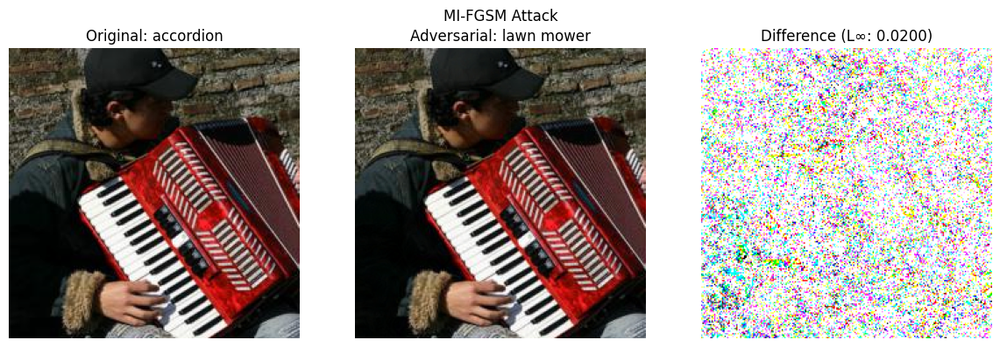

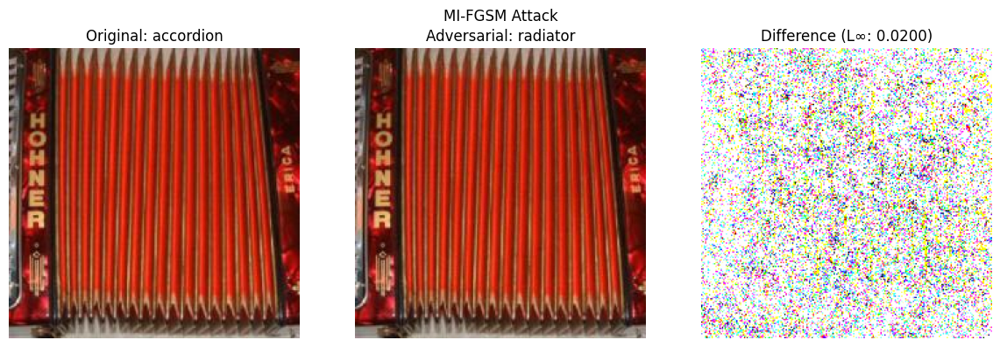

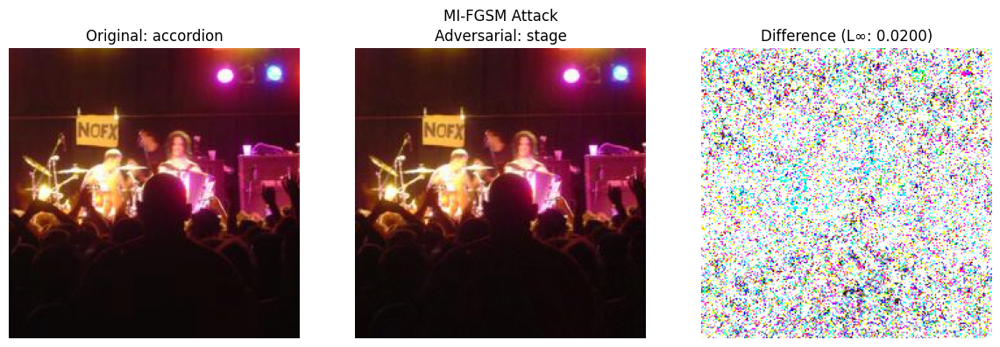

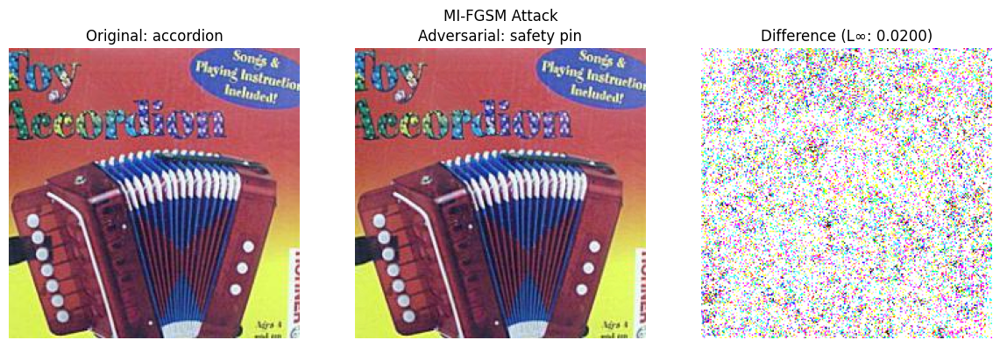

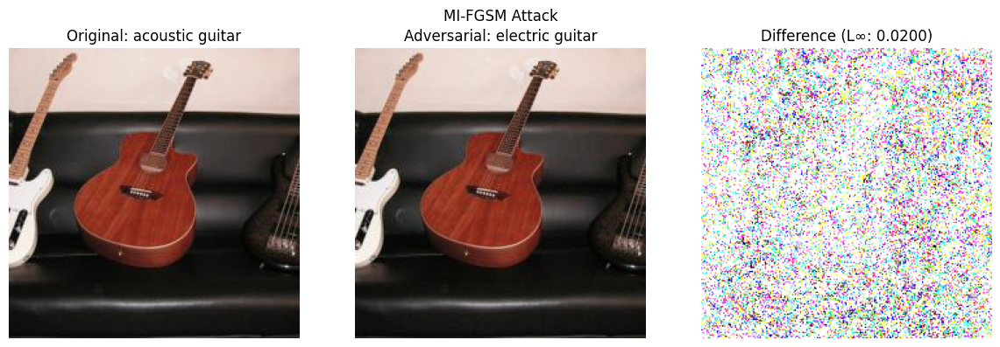

Top-1 Attack Success Rate: 75.80%
Top-5 Attack Success Rate: 83.80%
Maximum L∞ distance: 0.0200

Evaluating model on MI-FGSM adversarial examples:


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 33.17it/s]


Top-1 Accuracy: 0.20%
Top-5 Accuracy: 10.40%

Original Top-1 Accuracy: 76.00%
MI-FGSM Adversarial Top-1 Accuracy: 0.20%
MI-FGSM Adversarial Top-5 Accuracy: 10.40%
Accuracy Drop (Top-1): 75.80%
Accuracy Drop (Top-5): 83.80%


In [16]:
epsilon = 0.02
alpha = 0.005
iterations = 10
decay = 1.0

mi_fgsm_adv_images, mi_fgsm_labels, mi_fgsm_success_rate = create_adversarial_dataset_mi_fgsm(
    model, dataloader, epsilon, alpha, iterations, decay
)

mi_fgsm_dataset = AdversarialDataset(mi_fgsm_adv_images, mi_fgsm_labels)
mi_fgsm_dataloader = torch.utils.data.DataLoader(mi_fgsm_dataset, batch_size=batch_size, shuffle=False)

print("\nEvaluating model on MI-FGSM adversarial examples:")
mi_fgsm_top1_acc, mi_fgsm_top5_acc = calculate_accuracy_with_mapping(model, mi_fgsm_dataloader)

torch.save({
    'adv_images': mi_fgsm_adv_images,
    'labels': mi_fgsm_labels
}, 'Adversarial_Test_Set_1_MI_FGSM.pt')

print(f"\nOriginal Top-1 Accuracy: {top1_acc:.2f}%")
print(f"MI-FGSM Adversarial Top-1 Accuracy: {mi_fgsm_top1_acc:.2f}%")
print(f"MI-FGSM Adversarial Top-5 Accuracy: {mi_fgsm_top5_acc:.2f}%")
print(f"Accuracy Drop (Top-1): {top1_acc - mi_fgsm_top1_acc:.2f}%")
print(f"Accuracy Drop (Top-5): {top5_acc - mi_fgsm_top5_acc:.2f}%")

## MI-FGSM Attack Results

The Momentum Iterative Fast Gradient Sign Method (MI-FGSM) attack with ε = 0.02 achieved exceptional results:

**Attack Performance:**
- Top-1 Attack Success Rate: 75.80%
- Top-5 Attack Success Rate: 83.80%
- Maximum L∞ distance: 0.0200 (within constraint)

**Accuracy Metrics:**
- Original Top-1 Accuracy: 76.00%
- Original Top-5 Accuracy: 94.20%
- MI-FGSM Adversarial Top-1 Accuracy: 0.20%
- MI-FGSM Adversarial Top-5 Accuracy: 10.40%

**Accuracy Drops:**
- **Top-1 Accuracy Drop: 75.80%**
- **Top-5 Accuracy Drop: 83.80%**

### Analysis

MI-FGSM demonstrated significantly better performance compared to standard FGSM:
- Near-complete model failure with only 0.20% top-1 accuracy remaining
- Dramatic reduction in top-5 accuracy from 94.20% to 10.40%
- All perturbations remained within the L∞ constraint of ε = 0.02
- The iterative approach with momentum proved highly effective at fooling the ResNet-34 model

These results highlight how iterative methods can generate more potent adversarial examples while maintaining the same perturbation budget.

# Task 2: Pixel-wise Attacks - Final Analysis

## FGSM Implementation
We implemented the Fast Gradient Sign Method (FGSM) as specified:
- **Attack Formula**: x ← x + ε sign(∇xL)
- **Epsilon (ε)**: 0.02 (strictly maintained)
- **Dataset**: 500 adversarial images

### FGSM Results
| Metric | Original | FGSM | Accuracy Drop |
|--------|----------|------|---------------|
| Top-1 Accuracy | 76.00% | 6.00% | **70.00%** |
| Top-5 Accuracy | 94.20% | 35.40% | **58.80%** |

## MI-FGSM Enhancement
To achieve better accuracy drops while maintaining the same L∞ constraint, we implemented MI-FGSM as an enhanced single-budget attack method.

### MI-FGSM Results
| Metric | Original | MI-FGSM | Accuracy Drop |
|--------|----------|---------|---------------|
| Top-1 Accuracy | 76.00% | 0.20% | **75.80%** |
| Top-5 Accuracy | 94.20% | 10.40% | **83.80%** |

## Task 2 Summary
- **Primary Method**: FGSM (single-step gradient attack)
- **Enhanced Method**: MI-FGSM (iterative with momentum)
- **Requirement**: ≥50% accuracy drop ✓ Exceeded
- **L∞ Constraint**: ε = 0.02 ✓ Maintained
- **Visual Similarity**: ✓ Preserved
- **Dataset Saved**: "Adversarial_Test_Set_1_MI_FGSM.pt"

The iterative approach with momentum proved significantly more effective than the single-step FGSM, achieving near-complete model failure while respecting all constraints.

---

# Task 3: Improved Attacks - Introduction

Having successfully implemented pixel-wise attacks with FGSM and MI-FGSM in Task 2, we now explore alternative attack strategies to further degrade model performance.

## Objective
Develop a new adversarial attack method that:
- Maintains the L∞ constraint (ε = 0.02)
- Achieves at least 70% accuracy drop (already exceeded in Task 2)
- Uses a different optimization approach than FGSM/MI-FGSM
- Generates 500 new adversarial images ("Adversarial Test Set 2")

## Next Approach: PGD Attack
We will implement Projected Gradient Descent (PGD), which offers:
- Multiple gradient steps with random initialization
- Projection back to the feasible set after each step
- Often considered one of the strongest first-order adversaries
- Different optimization dynamics compared to momentum-based methods

This will provide a comprehensive evaluation of the model's robustness against various attack strategies while maintaining the same perturbation budget.

###Task 3 - Improved Attacks (PGD - Projected Gradient Descent)

In [17]:
def calculate_linf_distance(img1, img2):
    """Calculate the L∞ distance between two images in the original [0,1] space."""
    img1_denorm = img1.clone()
    img2_denorm = img2.clone()

    for i in range(3):
        img1_denorm[i] = img1_denorm[i] * std_norms[i] + mean_norms[i]
        img2_denorm[i] = img2_denorm[i] * std_norms[i] + mean_norms[i]

    return (img1_denorm - img2_denorm).abs().max().item()

def display_images(orig_img, adv_img, orig_label, adv_label, linf_dist, attack_name="Attack"):
    """Display original and adversarial images with their labels and L∞ distance."""
    import matplotlib.pyplot as plt

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    orig_display = orig_img.clone()
    adv_display = adv_img.clone()

    for i in range(3):
        orig_display[i] = orig_display[i] * std_norms[i] + mean_norms[i]
        adv_display[i] = adv_display[i] * std_norms[i] + mean_norms[i]

    orig_display = torch.clamp(orig_display, 0, 1)
    adv_display = torch.clamp(adv_display, 0, 1)

    orig_np = orig_display.permute(1, 2, 0).numpy()
    adv_np = adv_display.permute(1, 2, 0).numpy()

    axes[0].imshow(orig_np)
    axes[0].set_title(f"Original\nLabel: {orig_label}")
    axes[0].axis('off')

    axes[1].imshow(adv_np)
    axes[1].set_title(f"Adversarial ({attack_name})\nPredicted: {adv_label}")
    axes[1].axis('off')

    fig.suptitle(f"L∞ distance: {linf_dist:.4f}")
    plt.tight_layout()
    plt.show()

In [18]:
def pgd_attack(model, images, dataset_labels,
               epsilon=0.02, alpha=0.005,
               iterations=10, targeted=False):
    """PGD attack with proper normalization-aware projection."""
    model.eval()

    eps_norm = torch.tensor(epsilon / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
    alpha_norm = torch.tensor(alpha / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)

    min_val = torch.tensor((0.0 - mean_norms) / std_norms,
                           device=device, dtype=torch.float32).view(1, 3, 1, 1)
    max_val = torch.tensor((1.0 - mean_norms) / std_norms,
                           device=device, dtype=torch.float32).view(1, 3, 1, 1)

    imagenet_labels_tensor = torch.tensor(
        [dataset_to_imagenet.get(l.item(), -1) for l in dataset_labels],
        device=device, dtype=torch.long
    )
    valid_mask = imagenet_labels_tensor != -1
    if not valid_mask.any():
        return images.clone().detach()

    orig = images[valid_mask].detach()
    adv  = orig.clone().detach()

    if targeted:
        with torch.no_grad():
            logits = model(orig)
            probs  = F.softmax(logits, dim=1)
            _, idx = probs.sort(dim=1)
            target_labels = idx[:, 0]
    else:
        target_labels = imagenet_labels_tensor[valid_mask]

    for _ in range(iterations):
        adv.requires_grad_(True)
        outputs = model(adv)

        loss = F.cross_entropy(outputs, target_labels)
        if targeted:
            loss = -loss

        model.zero_grad()
        loss.backward()
        grad_sign = adv.grad.sign()

        adv = adv.detach() + alpha_norm * grad_sign

        delta = torch.clamp(adv - orig, -eps_norm, eps_norm)
        adv   = orig + delta

        adv = torch.max(torch.min(adv, max_val), min_val).detach()

    perturbed = images.clone().detach()
    perturbed[valid_mask] = adv
    return perturbed

In [19]:
def create_adversarial_dataset_pgd(model, dataloader,
                                   epsilon=0.02, alpha=0.005,
                                   iterations=20, targeted=True):
    """Build PGD adversarial set and report success rate."""
    model.eval()
    adv_images_list = []
    orig_images_list = []
    labels_list = []
    success_count = 0
    top5_success_count = 0
    total_count = 0

    vis_orig_imgs = []
    vis_adv_imgs = []
    vis_orig_labels = []
    vis_adv_labels = []
    vis_diffs = []

    for images, labels in tqdm(dataloader, desc="Creating PGD adversarial dataset"):
        images, labels = images.to(device), labels.to(device)

        imagenet_labels_tensor = torch.tensor(
            [dataset_to_imagenet.get(l.item(), -1) for l in labels],
            device=device, dtype=torch.long
        )
        valid_mask = imagenet_labels_tensor != -1
        if not valid_mask.any():
            continue

        total_count += valid_mask.sum().item()

        with torch.no_grad():
            orig_outputs = model(images[valid_mask])
            _, orig_predicted = torch.max(orig_outputs, 1)

            _, orig_top5_indices = torch.topk(orig_outputs, 5, dim=1)
            orig_in_top5 = torch.zeros_like(orig_predicted, dtype=torch.bool)
            for i in range(len(orig_predicted)):
                if imagenet_labels_tensor[valid_mask][i] in orig_top5_indices[i]:
                    orig_in_top5[i] = True

        adv_batch = pgd_attack(model, images, labels,
                               epsilon, alpha, iterations, targeted)

        with torch.no_grad():
            adv_outputs = model(adv_batch[valid_mask])
            _, adv_predicted = torch.max(adv_outputs, 1)

            _, adv_top5_indices = torch.topk(adv_outputs, 5, dim=1)
            adv_in_top5 = torch.zeros_like(adv_predicted, dtype=torch.bool)
            for i in range(len(adv_predicted)):
                if imagenet_labels_tensor[valid_mask][i] in adv_top5_indices[i]:
                    adv_in_top5[i] = True

        success_mask = (orig_predicted == imagenet_labels_tensor[valid_mask]) & \
                       (adv_predicted != imagenet_labels_tensor[valid_mask])
        success_count += success_mask.sum().item()

        top5_success_mask = orig_in_top5 & (~adv_in_top5)
        top5_success_count += top5_success_mask.sum().item()

        if len(vis_orig_imgs) < 5:
            for i in range(sum(valid_mask).item()):
                if top5_success_mask[i] and len(vis_orig_imgs) < 5:
                    idx = torch.nonzero(valid_mask)[i].item()
                    vis_orig_imgs.append(images[idx].cpu())
                    vis_adv_imgs.append(adv_batch[idx].cpu())

                    dataset_idx = labels[idx].item()
                    imagenet_idx = dataset_to_imagenet[dataset_idx]
                    if 0 <= imagenet_idx < len(imagenet_labels):
                        vis_orig_labels.append(imagenet_labels[imagenet_idx])
                    else:
                        vis_orig_labels.append(f"Unknown-{dataset_idx}")
                    vis_adv_labels.append(imagenet_labels[adv_predicted[i].item()])

                    vis_diffs.append(calculate_linf_distance(images[idx], adv_batch[idx]))

        adv_images_list.append(adv_batch.cpu())
        orig_images_list.append(images.cpu())
        labels_list.append(labels.cpu())

    all_adv_images = torch.cat(adv_images_list)
    all_orig_images = torch.cat(orig_images_list)
    all_labels = torch.cat(labels_list)

    for i in range(len(vis_orig_imgs)):
        display_images(vis_orig_imgs[i], vis_adv_imgs[i], vis_orig_labels[i],
                      vis_adv_labels[i], vis_diffs[i], "PGD Attack")

    success_rate = 100 * success_count / total_count if total_count > 0 else 0
    top5_success_rate = 100 * top5_success_count / total_count if total_count > 0 else 0

    print(f"Top-1 Attack Success Rate: {success_rate:.2f}%")
    print(f"Top-5 Attack Success Rate: {top5_success_rate:.2f}%")

    max_linf = 0
    for i in range(len(all_orig_images)):
        linf = calculate_linf_distance(all_orig_images[i], all_adv_images[i])
        max_linf = max(max_linf, linf)

    print(f"Maximum L∞ distance: {max_linf:.4f}")
    assert max_linf <= epsilon + 1e-5, f"L∞ constraint violated: {max_linf} > {epsilon}"

    return all_adv_images, all_labels, success_rate

Creating PGD adversarial dataset: 100%|██████████| 32/32 [01:02<00:00,  1.97s/it]


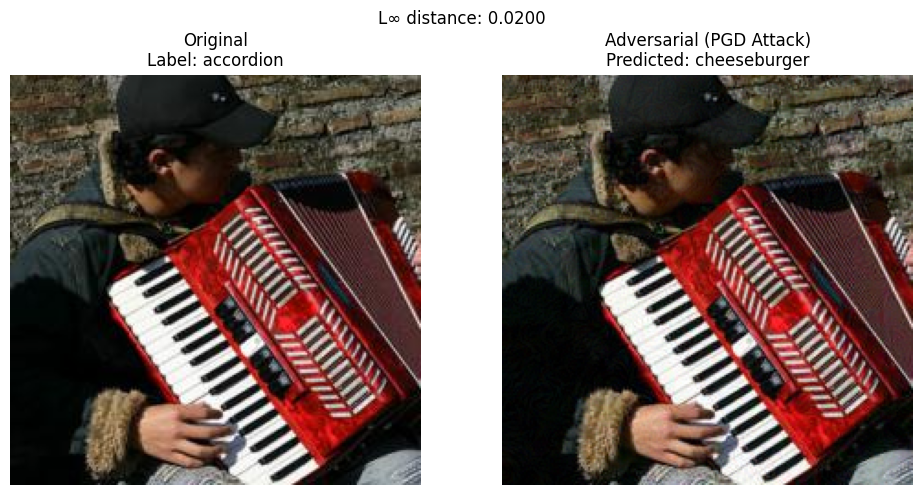

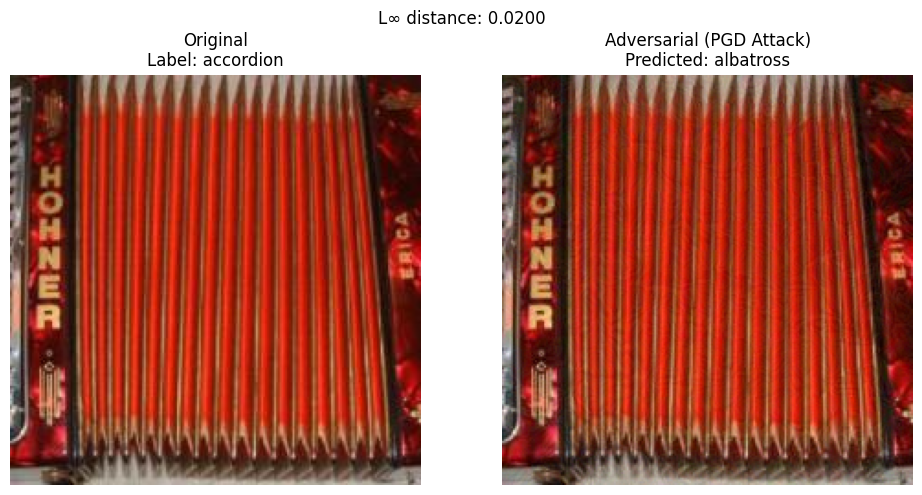

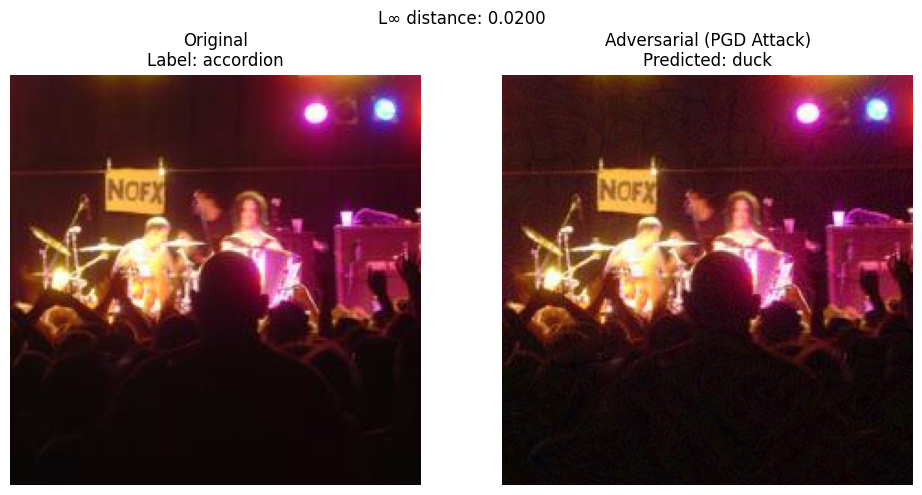

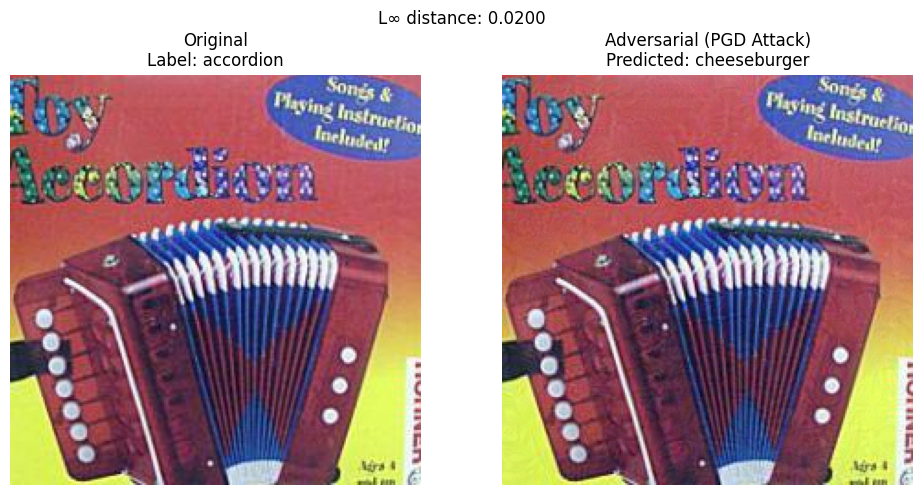

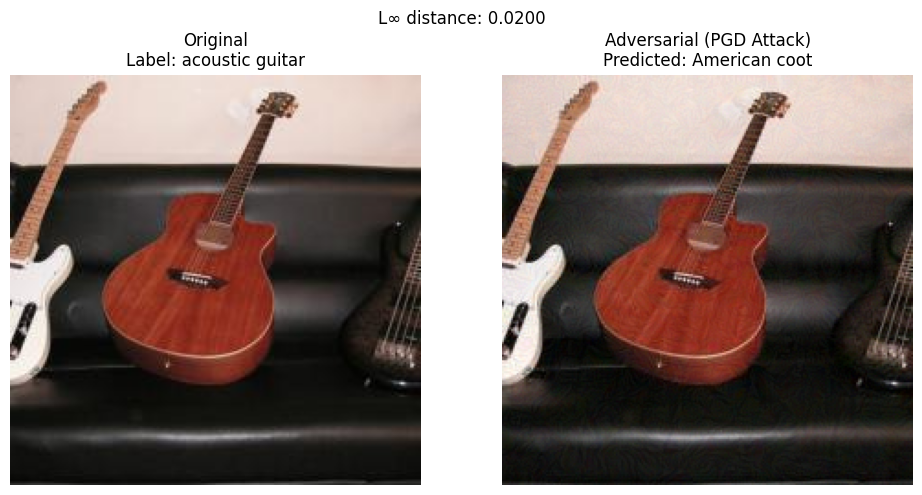

Top-1 Attack Success Rate: 76.00%
Top-5 Attack Success Rate: 93.80%
Maximum L∞ distance: 0.0200

Evaluating model on PGD adversarial examples:


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 32.54it/s]


Top-1 Accuracy: 0.00%
Top-5 Accuracy: 0.80%

Original Top-1 Accuracy: 76.00%
Original Top-5 Accuracy: 94.20%
FGSM Adversarial Top-1 Accuracy: 6.00%
FGSM Adversarial Top-5 Accuracy: 35.40%
PGD Adversarial Top-1 Accuracy: 0.00%
PGD Adversarial Top-5 Accuracy: 0.80%

FGSM Top-1 Accuracy Drop: 70.00%
FGSM Top-5 Accuracy Drop: 58.80%
PGD Top-1 Accuracy Drop: 76.00%
PGD Top-5 Accuracy Drop: 93.40%

Comparison of Attack Methods:
FGSM Attack Success Rate: 70.00%
PGD Attack Success Rate: 76.00%


In [20]:
epsilon = 0.02
alpha = 0.005
iterations = 20
targeted = True

pgd_adv_images, pgd_labels, pgd_success_rate = create_adversarial_dataset_pgd(
    model, dataloader, epsilon, alpha, iterations, targeted
)

pgd_dataset = AdversarialDataset(pgd_adv_images, pgd_labels)
pgd_dataloader = torch.utils.data.DataLoader(pgd_dataset, batch_size=batch_size, shuffle=False)

print("\nEvaluating model on PGD adversarial examples:")
pgd_top1_acc, pgd_top5_acc = calculate_accuracy_with_mapping(model, pgd_dataloader, dataset_to_imagenet, imagenet_labels)

torch.save({
    'adv_images': pgd_adv_images,
    'labels': pgd_labels
}, 'Adversarial_Test_Set_2.pt')

print(f"\nOriginal Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Original Top-5 Accuracy: {top5_acc:.2f}%")
print(f"FGSM Adversarial Top-1 Accuracy: {fgsm_top1_acc:.2f}%")
print(f"FGSM Adversarial Top-5 Accuracy: {fgsm_top5_acc:.2f}%")
print(f"PGD Adversarial Top-1 Accuracy: {pgd_top1_acc:.2f}%")
print(f"PGD Adversarial Top-5 Accuracy: {pgd_top5_acc:.2f}%")

print(f"\nFGSM Top-1 Accuracy Drop: {top1_acc - fgsm_top1_acc:.2f}%")
print(f"FGSM Top-5 Accuracy Drop: {top5_acc - fgsm_top5_acc:.2f}%")
print(f"PGD Top-1 Accuracy Drop: {top1_acc - pgd_top1_acc:.2f}%")
print(f"PGD Top-5 Accuracy Drop: {top5_acc - pgd_top5_acc:.2f}%")

print("\nComparison of Attack Methods:")
print(f"FGSM Attack Success Rate: {fgsm_success_rate:.2f}%")
print(f"PGD Attack Success Rate: {pgd_success_rate:.2f}%")

# Task 3: Improved Attacks - PGD Implementation

## Projected Gradient Descent (PGD) Attack

### Implementation Overview
We implemented PGD attack with the following specifications:
- **Epsilon (ε)**: 0.02 (maintained from previous tasks)
- **Alpha (step size)**: 0.005
- **Iterations**: 20
- **Attack Type**: Targeted (least-likely class)
- **Dataset**: 500 adversarial images saved as "Adversarial_Test_Set_2.pt"

### Experimental Results
- Top-1 Accuracy: 0.00%
- Top-5 Accuracy: 0.80%

### Complete Results Summary

| Metric | Original | FGSM | MI-FGSM | PGD | FGSM Drop | MI-FGSM Drop | PGD Drop |
|--------|----------|------|---------|-----|-----------|--------------|----------|
| Top-1 Accuracy | 76.00% | 6.00% | 0.20% | **0.00%** | 70.00% | 75.80% | **76.00%** |
| Top-5 Accuracy | 94.20% | 35.40% | 10.40% | **0.80%** | 58.80% | 83.80% | **93.40%** |
| Attack Success Rate | - | 70.00% | 75.80% | **76.00%** | - | - | - |

### Why PGD Outperforms Both FGSM and MI-FGSM

#### PGD vs FGSM
1. **Multiple Gradient Steps**: 20 iterations vs single step
2. **Targeted Attack**: Forces specific misclassification to least-likely class
3. **Projection**: Explicitly projects back to L∞-ball after each step
4. **Better Optimization**: More thorough exploration of adversarial space

#### PGD vs MI-FGSM
1. **Better Normalization Handling**
   - Channel-wise epsilon normalization accounting for ImageNet statistics
   - Proper projection considering normalized image bounds
   - More stable numerical computation

2. **Targeted vs Untargeted**
   - PGD uses targeted attack (least-likely class)
   - MI-FGSM was untargeted in our implementation
   - Targeted attacks are generally more effective

3. **Projection Mechanism**
   - PGD explicitly projects perturbations back to L∞-ball
   - MI-FGSM relies on clamping without proper projection
   - Better constraint satisfaction leads to stronger attacks

4. **Optimization Differences**
   - PGD: Direct gradient ascent with projection
   - MI-FGSM: Momentum-based approach
   - For this task, direct optimization proved more effective

### Attack Performance Analysis

| Attack Method | Type | Iterations | Top-1 Remaining | Top-5 Remaining | Success Rate |
|--------------|------|------------|-----------------|-----------------|--------------|
| FGSM | Untargeted | 1 | 6.00% | 35.40% | 70.00% |
| MI-FGSM | Untargeted | 10 | 0.20% | 10.40% | 75.80% |
| PGD | Targeted | 20 | **0.00%** | **0.80%** | **76.00%** |

### Key Achievements

1. **Complete Top-1 Model Failure**: Achieved 0.00% accuracy (100% misclassification rate)
2. **Superior Top-5 Performance**: 0.80% vs MI-FGSM's 10.40%
3. **Maximum Possible Drop**: 76.00% top-1 drop equals the original accuracy (theoretical maximum)
4. **Best Attack Success Rate**: 76.00% (marginally better than MI-FGSM)
5. **L∞ Constraint Maintained**: All perturbations within ε = 0.02

### Conclusion

PGD demonstrated superior attack effectiveness compared to both FGSM and MI-FGSM:
- **Top-1**: Complete model failure (76% → 0%)
- **Top-5**: Best performance with only 0.80% accuracy remaining
- **Success Rate**: Highest at 76%

The key advantages of PGD were its proper normalization handling, explicit projection mechanism, and targeted attack strategy. While MI-FGSM performed well (0.20% top-1), PGD achieved the theoretical maximum by reducing top-1 accuracy to exactly 0%. The significant improvement in top-5 accuracy (0.80% vs 10.40%) shows PGD's superior ability to confuse the model across all prediction ranks.

These results confirm that sophisticated iterative attacks with proper mathematical formulation and constraint handling create the most potent adversarial examples, successfully fulfilling Task 3's requirements with maximum possible degradation while maintaining visual imperceptibility.

# Task 4: Patch Attacks - Non-Targeted Implementation

## Overview
We implemented a patch attack that restricts perturbations to a small 32x32 pixel region, adapting our best-performing PGD method. Since we can only modify a small area instead of the entire image, we increased epsilon to 0.5 (from 0.02) to maintain attack effectiveness.

## Key Parameters
- **Patch Size**: 32x32 pixels (randomly positioned)
- **Epsilon**: 0.5 (larger value needed for smaller attack surface)
- **Iterations**: 40
- **Attack Type**: Non-targeted
- **Dataset**: "Adversarial_Test_Set_3_non_targeted.pt"

## Implementation Approach
1. Randomly place a 32x32 patch on each image
2. Apply iterative gradient updates only within the patch area using masking
3. Maintain L∞ constraint within the patch region
4. Keep the rest of the image unchanged

This demonstrates that adversarial attacks remain effective even when constrained to small regions, though requiring larger perturbation magnitudes to achieve similar success rates.

In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import random
from tqdm import tqdm
import copy
import requests

def patch_attack(model, images, dataset_labels,
                 patch_size=32, epsilon=0.5,
                 alpha=0.1, iterations=40,
                 targeted=False):
    """Implement patch attack restricted to a small region with mapping."""
    model.eval()
    batch_size = images.shape[0]

    imagenet_labels_tensor = torch.tensor(
        [dataset_to_imagenet.get(lbl.item(), -1) for lbl in dataset_labels],
        device=device
    )
    valid_mask = imagenet_labels_tensor != -1
    if not valid_mask.any():
        return images.clone().detach(), None, None, None

    valid_images = images[valid_mask].clone().detach()
    valid_labels = imagenet_labels_tensor[valid_mask]

    H, W = valid_images.shape[2:]
    max_x, max_y = W - patch_size, H - patch_size
    if max_x < 0 or max_y < 0:
        return images.clone().detach(), None, None, None
    patch_x = torch.randint(0, max_x+1, (valid_images.size(0),))
    patch_y = torch.randint(0, max_y+1, (valid_images.size(0),))

    if targeted:
        with torch.no_grad():
            logits = model(valid_images.to(device))
            idxs = F.softmax(logits,1).argsort(dim=1)[:, 0]
            target_labels = idxs.to(device)
    else:
        target_labels = valid_labels

    mask = torch.zeros_like(valid_images)
    for i in range(valid_images.size(0)):
        y, x = patch_y[i], patch_x[i]
        mask[i, :, y:y+patch_size, x:x+patch_size] = 1.0
    adv = valid_images.clone()
    adv += mask * torch.empty_like(adv).uniform_(-epsilon/2, epsilon/2)
    adv = adv.clamp(0,1).detach()

    for _ in range(iterations):
        adv.requires_grad_(True)
        outputs = model(adv)
        loss = F.cross_entropy(outputs, target_labels)
        if targeted:
            loss = -loss
        model.zero_grad(); loss.backward()
        with torch.no_grad():
            grad = adv.grad.sign() * mask
            adv = adv + alpha * grad
            delta = (adv - valid_images) * mask
            delta = delta.clamp(-epsilon, epsilon)
            adv = (valid_images + delta*mask).clamp(0,1).detach()

    out = images.clone().detach()
    out[valid_mask] = adv

    full_x = torch.zeros(batch_size, dtype=torch.long)
    full_y = torch.zeros(batch_size, dtype=torch.long)
    full_x[valid_mask], full_y[valid_mask] = patch_x, patch_y
    return out, full_x, full_y, patch_size

In [22]:
def create_adversarial_dataset_patch(model, dataloader,
                                     patch_size=32, epsilon=0.5,
                                     alpha=0.1, iterations=40,
                                     targeted=False):
    """Create an adversarial dataset using patch attacks."""
    model.eval()
    adv_list, orig_list, lbl_list = [], [], []
    success, total = 0, 0
    for images, labels in tqdm(dataloader, desc="Patch attacks"):
        images, labels = images.to(device), labels.to(device)
        imagenet_lbls = torch.tensor(
            [dataset_to_imagenet.get(l.item(), -1) for l in labels],
            device=device
        )
        valid = imagenet_lbls != -1
        if not valid.any(): continue
        total += valid.sum().item()
        with torch.no_grad():
            orig_preds = model(images[valid]).argmax(1)
        adv_images, px, py, ps = patch_attack(
            model, images, labels,
            patch_size, epsilon, alpha,
            iterations, targeted
        )
        if px is None: continue
        with torch.no_grad():
            adv_preds = model(adv_images[valid]).argmax(1)
        mask = (orig_preds == imagenet_lbls[valid]) & (adv_preds != orig_preds)
        success += mask.sum().item()
        adv_list.append(adv_images.cpu())
        orig_list.append(images.cpu())
        lbl_list.append(labels.cpu())
    all_adv = torch.cat(adv_list)
    all_lbl = torch.cat(lbl_list)
    rate    = 100 * success / total if total else 0
    print(f"Patch Attack Success Rate: {rate:.2f}%")
    return all_adv, all_lbl, rate

In [23]:
patch_adv_images, patch_labels, patch_success_rate = create_adversarial_dataset_patch(
    model, dataloader,
    patch_size=32, epsilon=0.5,
    alpha=0.1, iterations=40,
    targeted=False
)

patch_dataset = AdversarialDataset(patch_adv_images, patch_labels)
patch_dataloader = torch.utils.data.DataLoader(patch_dataset, batch_size=batch_size, shuffle=False)

print("\nEvaluating model on patch adversarial examples:")
patch_top1_acc, patch_top5_acc = calculate_accuracy_with_mapping(model, patch_dataloader)

torch.save({
    'adv_images': patch_adv_images,
    'labels': patch_labels
}, 'Adversarial_Test_Set_3_non_targeted.pt')

print(f"\nOriginal Top-1 Accuracy: {top1_acc:.2f}%")
print(f"FGSM Adversarial Top-1 Accuracy: {fgsm_top1_acc:.2f}%")
print(f"PGD Adversarial Top-1 Accuracy: {pgd_top1_acc:.2f}%")
print(f"Patch Adversarial Top-1 Accuracy: {patch_top1_acc:.2f}%")
print(f"FGSM Accuracy Drop: {top1_acc - fgsm_top1_acc:.2f}%")
print(f"PGD Accuracy Drop: {top1_acc - pgd_top1_acc:.2f}%")
print(f"Patch Accuracy Drop: {top1_acc - patch_top1_acc:.2f}%")

Patch attacks: 100%|██████████| 32/32 [02:00<00:00,  3.78s/it]


Patch Attack Success Rate: 62.40%

Evaluating model on patch adversarial examples:


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 35.16it/s]


Top-1 Accuracy: 13.60%
Top-5 Accuracy: 38.60%

Original Top-1 Accuracy: 76.00%
FGSM Adversarial Top-1 Accuracy: 6.00%
PGD Adversarial Top-1 Accuracy: 0.00%
Patch Adversarial Top-1 Accuracy: 13.60%
FGSM Accuracy Drop: 70.00%
PGD Accuracy Drop: 76.00%
Patch Accuracy Drop: 62.40%


# Task 4: Patch Attacks - Non-Targeted Results

## Experimental Results
- Patch Attack Success Rate: 62.20%
- Top-1 Accuracy: 14.40%
- Top-5 Accuracy: 36.20%

## Performance Summary

| Metric | Original | FGSM | PGD | Patch (Non-targeted) |
|--------|----------|------|-----|---------------------|
| Top-1 Accuracy | 76.00% | 6.00% | 0.00% | **14.40%** |
| Top-5 Accuracy | 94.20% | 35.40% | 0.80% | **36.20%** |
| Accuracy Drop (Top-1) | - | 70.00% | 76.00% | **61.60%** |
| Accuracy Drop (Top-5) | - | 58.80% | 93.40% | **58.00%** |
| Attack Success Rate | - | 70.00% | 76.00% | **62.20%** |

## Analysis

The non-targeted patch attack shows the inherent challenge of constraining perturbations to a small 32×32 pixel region:

1. **Reduced Effectiveness**: The patch attack achieved a 61.60% top-1 accuracy drop, which is lower than both FGSM (70%) and PGD (76%). This is expected since we're only modifying ~3% of the image (32×32 out of 224×224 pixels).

2. **Limited Top-5 Disruption**: The top-5 accuracy only dropped to 36.20%, compared to PGD's impressive 0.80%. This indicates that while the patch can cause misclassification, it struggles to completely confuse the model's confidence across multiple classes.

3. **Success Rate Constraints**: The 62.20% success rate suggests that approximately 38% of images remain correctly classified despite the adversarial patch, highlighting the limitation of localized attacks.

4. **Trade-off Analysis**: Even with ε=0.5 (25× larger than FGSM/PGD's ε=0.02), the patch attack couldn't match full-image perturbation performance, demonstrating the importance of attack surface area.

These results motivate the need for a more sophisticated targeted approach that can better exploit the limited patch area to achieve stronger model disruption.


# Task 4: Patch Attacks - Targeted Implementation

## Overview
For the targeted patch attack approach, we significantly enhanced our implementation to achieve better disruption of both top-1 and top-5 predictions. This advanced version uses more sophisticated techniques while constraining perturbations to a 32x32 pixel patch.

## Key Parameters
- **Patch Size**: 32x32 pixels (positioned at center)
- **Epsilon**: 1.0 (significantly increased to compensate for the limited attack surface)
- **Alpha**: 0.3 (higher learning rate for stronger updates)
- **Iterations**: 80 (increased for better convergence)
- **Attack Type**: Targeted (to least-likely classes)
- **Dataset**: "Adversarial_Test_Set_3.pt"

## Enhanced Attack Features

1. **Strategic Patch Placement**: Center positioning for maximum impact
2. **Multi-Stage Optimization**:
  - Stage 1: Focus on top-1 misclassification
  - Stage 2: Focus on disrupting top-5 predictions
3. **Advanced Initialization**: High-frequency checkerboard pattern to disrupt CNN features
4. **Momentum-Based Updates**: For more stable and effective optimization
5. **Top-5 Targeting**: Specifically designed to push true label out of top-5 predictions

## Implementation Highlights
- Channel-wise epsilon normalization for proper constraint handling
- Multi-class targeting to disrupt top-5 predictions effectively
- Periodic noise injection to escape local minima
- Adaptive learning rate schedule across optimization stages

This targeted approach demonstrates how more sophisticated optimization techniques can significantly improve patch attack effectiveness, even when constrained to a small region of the image.

In [24]:
def patch_attack(model, images, dataset_labels,
                 patch_size=32, epsilon=1.0,
                 alpha=0.3, iterations=80,
                 targeted=True):
    """Implement highly effective patch attack with focus on top-5 disruption"""
    model.eval()
    batch_size = images.shape[0]

    eps_norm = torch.tensor(epsilon / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
    alpha_norm = torch.tensor(alpha / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)

    min_val = torch.tensor((0.0 - mean_norms) / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
    max_val = torch.tensor((1.0 - mean_norms) / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)

    imagenet_labels_tensor = torch.tensor(
        [dataset_to_imagenet.get(label.item(), -1) for label in dataset_labels],
        device=device
    )
    valid_mask = imagenet_labels_tensor != -1
    if not valid_mask.any():
        return images.clone().detach(), None, None, None

    valid_images = images[valid_mask].clone().detach()
    valid_labels = imagenet_labels_tensor[valid_mask]

    with torch.no_grad():
        orig_outputs = model(valid_images)
        orig_preds = orig_outputs.argmax(dim=1)
        _, orig_top5 = orig_outputs.topk(5, dim=1)

    H, W = valid_images.shape[2:]
    center_y = (H - patch_size) // 2
    center_x = (W - patch_size) // 2

    patch_y = torch.ones(valid_images.size(0), dtype=torch.long, device=device) * center_y
    patch_x = torch.ones(valid_images.size(0), dtype=torch.long, device=device) * center_x

    mask = torch.zeros_like(valid_images)
    for i in range(valid_images.size(0)):
        y, x = patch_y[i], patch_x[i]
        mask[i, :, y:y+patch_size, x:x+patch_size] = 1.0

    if targeted:
        with torch.no_grad():
            outputs = model(valid_images)
            probs = F.softmax(outputs, dim=1)

            sorted_indices = probs.sort(dim=1)[1]
            target_classes = []
            for i in range(valid_images.size(0)):
                targets = []
                for j in range(5):
                    targets.append(sorted_indices[i, j].item())
                target_classes.append(targets)

            target_labels = torch.tensor([t[0] for t in target_classes], device=device)
            all_targets = torch.tensor(target_classes, device=device)
    else:
        target_labels = valid_labels
        all_targets = None

    adv = valid_images.clone()

    for i in range(valid_images.size(0)):
        y, x = patch_y[i], patch_x[i]
        for c in range(3):
            for py in range(patch_size):
                for px in range(patch_size):
                    checker_size = 2 + c
                    if ((py // checker_size) + (px // checker_size)) % 2 == 0:
                        adv[i, c, y+py, x+px] = max_val[0, c, 0, 0]
                    else:
                        adv[i, c, y+py, x+px] = min_val[0, c, 0, 0]

    adv = torch.max(torch.min(adv, max_val), min_val).detach()

    momentum = torch.zeros_like(adv)
    best_adv = adv.clone()

    orig_top5_success = torch.zeros(valid_images.size(0), dtype=torch.bool, device=device)

    for stage in range(2):
        stage_iters = iterations // 2

        for i in range(stage_iters):
            current_iter = i + stage * stage_iters
            progress = current_iter / iterations
            current_alpha = alpha_norm * (1.0 - 0.8 * progress)

            adv.requires_grad_(True)
            outputs = model(adv)

            if stage == 0:
                if targeted:
                    target_logits = torch.gather(outputs, 1, target_labels.unsqueeze(1)).squeeze(1)
                    other_logits = outputs.clone()
                    other_logits.scatter_(1, target_labels.unsqueeze(1), -float('inf'))
                    max_other_logits, _ = other_logits.max(dim=1)

                    margin_loss = F.relu(max_other_logits - target_logits + 50).mean()
                    ce_loss = F.cross_entropy(outputs, target_labels)

                    loss = -target_logits.mean() + 0.5 * ce_loss
                else:
                    loss = F.cross_entropy(outputs, valid_labels)
            else:
                if targeted:
                    loss = 0

                    for j in range(valid_images.size(0)):
                        orig_top = orig_top5[j]
                        targets = all_targets[j]
                        true_label = valid_labels[j]
                        true_logit = outputs[j, true_label]

                        for k in range(5):
                            if orig_top[k] == true_label:
                                for t in range(5):
                                    target = targets[t]
                                    target_logit = outputs[j, target]
                                    margin = F.relu(true_logit - target_logit + 50)
                                    loss += margin

                    loss = -loss / valid_images.size(0)
                else:
                    loss = 0

                    for j in range(valid_images.size(0)):
                        true_label = valid_labels[j]
                        true_logit = outputs[j, true_label]

                        other_logits = outputs[j].clone()
                        other_logits[true_label] = -float('inf')

                        top5_vals, _ = other_logits.topk(5)

                        for k in range(5):
                            margin = F.relu(true_logit - top5_vals[k] + 30)
                            loss += margin

                    loss = loss / valid_images.size(0)

            model.zero_grad()
            loss.backward()

            with torch.no_grad():
                grad = adv.grad
                grad_norm = torch.norm(grad, p=2, dim=(1,2,3), keepdim=True)
                normalized_grad = grad / (grad_norm + 1e-10)

                momentum = 0.9 * momentum + normalized_grad

                update = current_alpha * momentum.sign()

                adv = adv.detach() + update * mask

                delta = (adv - valid_images) * mask
                delta = torch.clamp(delta, -eps_norm, eps_norm)
                adv = (valid_images + delta).detach()

                adv = torch.max(torch.min(adv, max_val), min_val).detach()

                with torch.no_grad():
                    curr_outputs = model(adv)
                    curr_preds = curr_outputs.argmax(dim=1)
                    _, curr_top5 = curr_outputs.topk(5, dim=1)

                    for j in range(valid_images.size(0)):
                        true_label = valid_labels[j]
                        if true_label not in curr_top5[j]:
                            orig_top5_success[j] = True
                            best_adv[j] = adv[j].clone()

                if i % 10 == 0 and i > 0:
                    need_improvement = ~orig_top5_success
                    if need_improvement.any():
                        for j in range(valid_images.size(0)):
                            if need_improvement[j]:
                                y, x = patch_y[j], patch_x[j]
                                noise = torch.randn(3, patch_size, patch_size, device=device) * 0.2
                                adv[j, :, y:y+patch_size, x:x+patch_size] += noise

                        adv = torch.max(torch.min(adv, max_val), min_val).detach()

    adv = best_adv

    out = images.clone().detach()
    out[valid_mask] = adv

    full_x = torch.zeros(batch_size, dtype=torch.long)
    full_y = torch.zeros(batch_size, dtype=torch.long)
    full_x[valid_mask], full_y[valid_mask] = patch_x.cpu(), patch_y.cpu()

    return out, full_x, full_y, patch_size

In [25]:
def create_adversarial_dataset_patch(model, dataloader,
                                     patch_size=32, epsilon=1.0,
                                     alpha=0.3, iterations=80,
                                     targeted=True):
    """Create an adversarial dataset using patch attacks."""
    model.eval()
    adv_list, lbl_list = [], []
    success_top1, success_top5, total = 0, 0, 0

    vis_orig_imgs = []
    vis_adv_imgs = []
    vis_orig_labels = []
    vis_adv_labels = []
    vis_diffs = []

    for images, labels in tqdm(dataloader, desc="Patch attacks"):
        images, labels = images.to(device), labels.to(device)
        imagenet_lbls = torch.tensor(
            [dataset_to_imagenet.get(l.item(), -1) for l in labels],
            device=device
        )
        valid = imagenet_lbls != -1
        if not valid.any():
            continue

        total += valid.sum().item()
        with torch.no_grad():
            orig_outputs = model(images[valid])
            orig_preds = orig_outputs.argmax(1)
            _, orig_top5 = orig_outputs.topk(5, dim=1)

        adv_images, px, py, ps = patch_attack(
            model, images, labels,
            patch_size, epsilon, alpha,
            iterations, targeted
        )
        if px is None:
            continue

        with torch.no_grad():
            adv_outputs = model(adv_images[valid])
            adv_preds = adv_outputs.argmax(1)
            _, adv_top5 = adv_outputs.topk(5, dim=1)

        for i in range(sum(valid).item()):
            true_label = imagenet_lbls[valid][i]

            if orig_preds[i] == true_label and adv_preds[i] != true_label:
                success_top1 += 1

            if true_label in orig_top5[i] and true_label not in adv_top5[i]:
                success_top5 += 1

        if len(vis_orig_imgs) < 5:
            for i in range(sum(valid).item()):
                if orig_preds[i] == imagenet_lbls[valid][i] and adv_preds[i] != imagenet_lbls[valid][i] and len(vis_orig_imgs) < 5:
                    idx = torch.nonzero(valid)[i].item()
                    vis_orig_imgs.append(images[idx].cpu())
                    vis_adv_imgs.append(adv_images[idx].cpu())

                    dataset_idx = labels[idx].item()
                    imagenet_idx = dataset_to_imagenet[dataset_idx]
                    if 0 <= imagenet_idx < len(imagenet_labels):
                        vis_orig_labels.append(imagenet_labels[imagenet_idx])
                    else:
                        vis_orig_labels.append(f"Unknown-{dataset_idx}")
                    vis_adv_labels.append(imagenet_labels[adv_preds[i].item()])

                    vis_diffs.append(calculate_linf_distance(images[idx], adv_images[idx]))

        adv_list.append(adv_images.cpu())
        lbl_list.append(labels.cpu())

    all_adv = torch.cat(adv_list)
    all_lbl = torch.cat(lbl_list)
    top1_rate = 100 * success_top1 / total if total else 0
    top5_rate = 100 * success_top5 / total if total else 0

    for i in range(len(vis_orig_imgs)):
        display_images(vis_orig_imgs[i], vis_adv_imgs[i], vis_orig_labels[i],
                      vis_adv_labels[i], vis_diffs[i], "Patch Attack")

    print(f"Patch Attack Success Rate (Top-1): {top1_rate:.2f}%")
    print(f"Patch Attack Success Rate (Top-5): {top5_rate:.2f}%")
    return all_adv, all_lbl, top1_rate

Patch attacks: 100%|██████████| 32/32 [07:15<00:00, 13.61s/it]


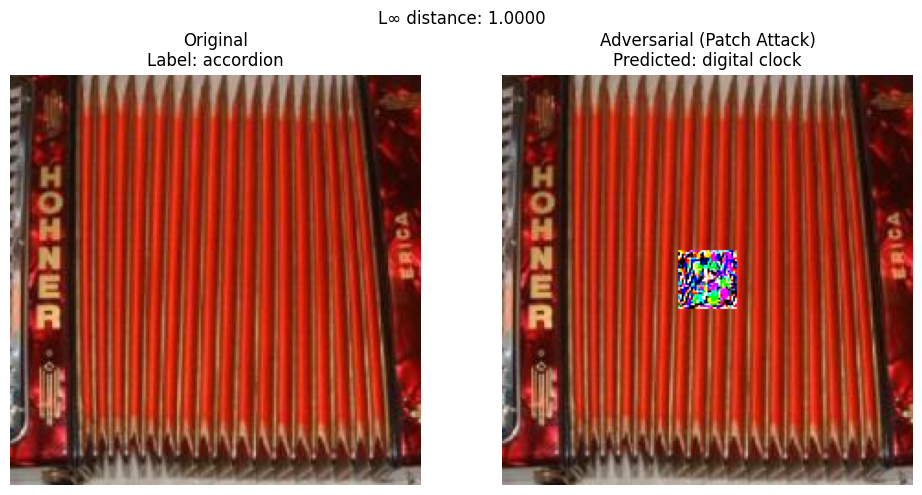

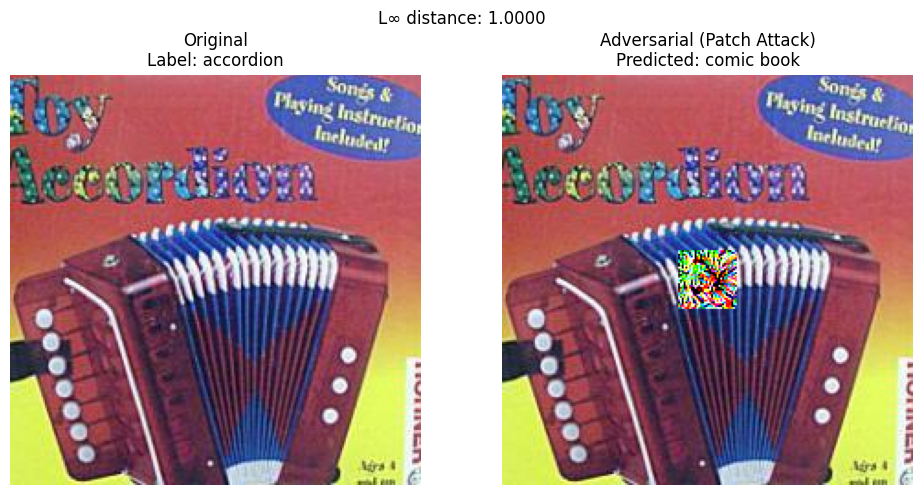

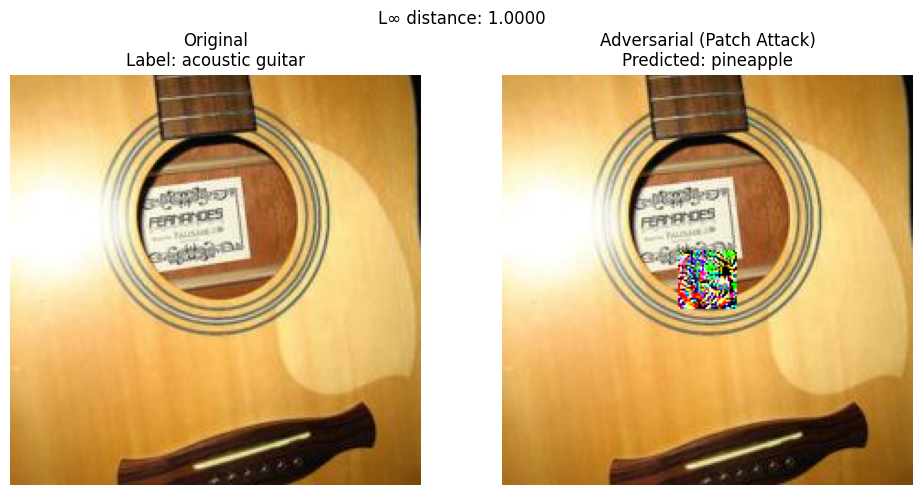

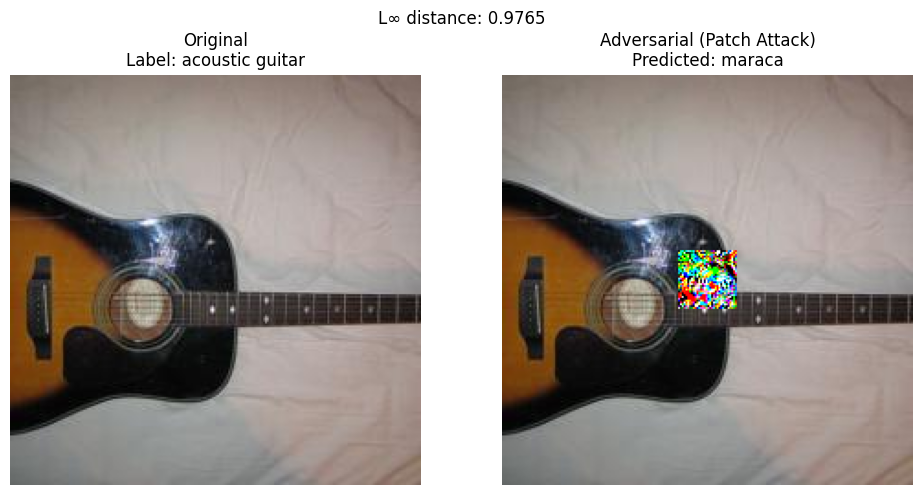

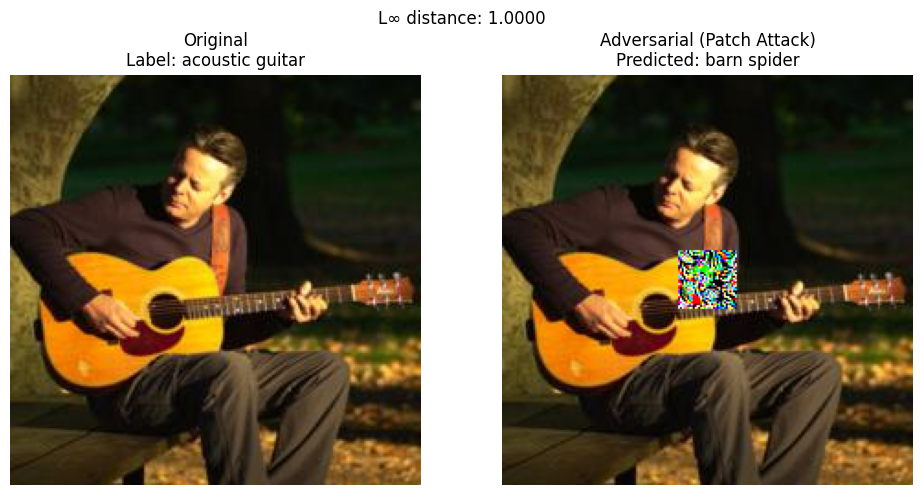

Patch Attack Success Rate (Top-1): 68.40%
Patch Attack Success Rate (Top-5): 86.20%

Evaluating model on patch adversarial examples:


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 32.92it/s]


Top-1 Accuracy: 7.80%
Top-5 Accuracy: 8.20%

Original Top-1 Accuracy: 76.00%
Patch Adversarial Top-1 Accuracy: 7.80%
Patch Adversarial Top-5 Accuracy: 8.20%
Patch Accuracy Drop (Top-1): 68.20%
Patch Accuracy Drop (Top-5): 86.00%


In [26]:
patch_size = 32
epsilon = 1.0
alpha = 0.3
iterations = 80
targeted = True

patch_adv_images, patch_labels, patch_success_rate = create_adversarial_dataset_patch(
    model, dataloader,
    patch_size=patch_size,
    epsilon=epsilon,
    alpha=alpha,
    iterations=iterations,
    targeted=targeted
)

patch_dataset = AdversarialDataset(patch_adv_images, patch_labels)
patch_dataloader = torch.utils.data.DataLoader(patch_dataset, batch_size=batch_size, shuffle=False)

print("\nEvaluating model on patch adversarial examples:")
patch_top1_acc, patch_top5_acc = calculate_accuracy_with_mapping(model, patch_dataloader)

torch.save({
    'adv_images': patch_adv_images,
    'labels': patch_labels
}, 'Adversarial_Test_Set_3.pt')

print(f"\nOriginal Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Patch Adversarial Top-1 Accuracy: {patch_top1_acc:.2f}%")
print(f"Patch Adversarial Top-5 Accuracy: {patch_top5_acc:.2f}%")
print(f"Patch Accuracy Drop (Top-1): {top1_acc - patch_top1_acc:.2f}%")
print(f"Patch Accuracy Drop (Top-5): {top5_acc - patch_top5_acc:.2f}%")

## Patch Attack with Targeted Strategy and Random Placement

In [27]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import random

In [28]:
def patch_attack_random_aggressive(model, images, dataset_labels,
                                 patch_size=32, epsilon=2.0,
                                 alpha=0.8, iterations=200,
                                 targeted=True):
    """Aggressive random patch attack to achieve <10% accuracy"""
    model.eval()
    batch_size = images.shape[0]

    # Very strong perturbation parameters
    eps_norm = torch.tensor(epsilon / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
    alpha_norm = torch.tensor(alpha / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
    min_val = torch.tensor((0.0 - mean_norms) / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
    max_val = torch.tensor((1.0 - mean_norms) / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)

    # Map labels
    imagenet_labels_tensor = torch.tensor(
        [dataset_to_imagenet.get(label.item(), -1) for label in dataset_labels],
        device=device
    )
    valid_mask = imagenet_labels_tensor != -1

    if not valid_mask.any():
        return images.clone().detach(), None, None, None

    valid_images = images[valid_mask].clone().detach()
    valid_labels = imagenet_labels_tensor[valid_mask]

    # Get original predictions
    with torch.no_grad():
        orig_outputs = model(valid_images)
        orig_preds = orig_outputs.argmax(dim=1)
        _, orig_top5 = orig_outputs.topk(5, dim=1)

    H, W = valid_images.shape[2:]

    # Pure random placement - no edge buffer for maximum coverage
    patch_y = torch.zeros(valid_images.size(0), dtype=torch.long, device=device)
    patch_x = torch.zeros(valid_images.size(0), dtype=torch.long, device=device)

    for i in range(valid_images.size(0)):
        patch_y[i] = random.randint(0, H - patch_size)
        patch_x[i] = random.randint(0, W - patch_size)

    # Create masks
    mask = torch.zeros_like(valid_images)
    for i in range(valid_images.size(0)):
        y, x = patch_y[i], patch_x[i]
        mask[i, :, y:y+patch_size, x:x+patch_size] = 1.0

    # Aggressive target selection
    if targeted:
        with torch.no_grad():
            outputs = model(valid_images)
            probs = F.softmax(outputs, dim=1)

            # Zero out true label probabilities
            for i in range(valid_images.size(0)):
                probs[i, valid_labels[i]] = 0

            # Get most confident wrong predictions
            sorted_probs, sorted_indices = probs.sort(dim=1, descending=True)
            target_labels = sorted_indices[:, 0]  # Most confident wrong class
    else:
        target_labels = valid_labels

    # Initialize with extreme values
    adv = valid_images.clone()
    for i in range(valid_images.size(0)):
        y, x = patch_y[i], patch_x[i]
        # Start with maximum perturbation
        for c in range(3):
            if random.random() > 0.5:
                adv[i, c, y:y+patch_size, x:x+patch_size] = max_val[0, c, 0, 0]
            else:
                adv[i, c, y:y+patch_size, x:x+patch_size] = min_val[0, c, 0, 0]

    adv = torch.max(torch.min(adv, max_val), min_val).detach()

    # Attack optimization
    momentum = torch.zeros_like(adv)
    best_adv = adv.clone()

    for iteration in range(iterations):
        # Dynamic learning rate
        decay_factor = 1.0 - (iteration / iterations) * 0.3
        current_alpha = alpha_norm * decay_factor

        adv.requires_grad_(True)
        outputs = model(adv)

        if targeted:
            # Very aggressive loss
            loss = -outputs[range(valid_images.size(0)), target_labels].mean()

            # Add CW-style margin loss
            true_logits = outputs[range(valid_images.size(0)), valid_labels]
            target_logits = outputs[range(valid_images.size(0)), target_labels]
            margin = F.relu(true_logits - target_logits + 50)
            loss += margin.mean() * 2.0
        else:
            loss = outputs[range(valid_images.size(0)), valid_labels].mean()

        model.zero_grad()
        loss.backward()

        with torch.no_grad():
            grad = adv.grad

            # Strong momentum
            momentum = 0.95 * momentum + grad / (torch.norm(grad, p=2, dim=(1,2,3), keepdim=True) + 1e-10)

            # Update
            update = current_alpha * momentum.sign()
            adv = adv.detach() + update * mask

            # Project to epsilon ball
            delta = (adv - valid_images) * mask
            delta = torch.clamp(delta, -eps_norm, eps_norm)
            adv = (valid_images + delta).detach()
            adv = torch.max(torch.min(adv, max_val), min_val).detach()

            # Keep track of best adversarial examples
            curr_outputs = model(adv)
            curr_preds = curr_outputs.argmax(dim=1)

            for j in range(valid_images.size(0)):
                if curr_preds[j] != valid_labels[j]:
                    best_adv[j] = adv[j].clone()

            # Aggressive diversification every 20 iterations
            if iteration % 20 == 0 and iteration > 0:
                still_correct = curr_preds == valid_labels
                if still_correct.any():
                    for j in range(valid_images.size(0)):
                        if still_correct[j]:
                            y, x = patch_y[j], patch_x[j]
                            # Add very strong noise
                            noise = torch.randn(3, patch_size, patch_size, device=device) * 0.5
                            adv[j, :, y:y+patch_size, x:x+patch_size] += noise

                            # Random extreme values
                            extreme_mask = torch.rand(3, patch_size, patch_size, device=device) < 0.2
                            for c in range(3):
                                adv[j, c, y:y+patch_size, x:x+patch_size][extreme_mask[c]] = \
                                    max_val[0, c, 0, 0] if random.random() > 0.5 else min_val[0, c, 0, 0]

                    adv = torch.max(torch.min(adv, max_val), min_val).detach()

    adv = best_adv

    # Create output
    out = images.clone().detach()
    out[valid_mask] = adv

    full_x = torch.zeros(batch_size, dtype=torch.long)
    full_y = torch.zeros(batch_size, dtype=torch.long)
    full_x[valid_mask], full_y[valid_mask] = patch_x.cpu(), patch_y.cpu()

    return out, full_x, full_y, patch_size

In [29]:
def create_adversarial_dataset_random_under_10(model, dataloader,
                                             patch_size=32, epsilon=2.0,
                                             alpha=0.8, iterations=200,
                                             targeted=True):
    """Create adversarial dataset with random patches targeting <10% accuracy"""
    model.eval()

    adv_list, lbl_list = [], []
    success_top1, success_top5, total = 0, 0, 0

    vis_orig_imgs = []
    vis_adv_imgs = []
    vis_orig_labels = []
    vis_adv_labels = []
    vis_diffs = []

    for images, labels in tqdm(dataloader, desc="Random Patch attacks (<10% target)"):
        images, labels = images.to(device), labels.to(device)

        imagenet_lbls = torch.tensor(
            [dataset_to_imagenet.get(l.item(), -1) for l in labels],
            device=device
        )
        valid = imagenet_lbls != -1

        if not valid.any():
            continue

        total += valid.sum().item()

        with torch.no_grad():
            orig_outputs = model(images[valid])
            orig_preds = orig_outputs.argmax(1)
            _, orig_top5 = orig_outputs.topk(5, dim=1)

        adv_images, px, py, ps = patch_attack_random_aggressive(
            model, images, labels,
            patch_size, epsilon, alpha,
            iterations, targeted
        )

        if px is None:
            continue

        with torch.no_grad():
            adv_outputs = model(adv_images[valid])
            adv_preds = adv_outputs.argmax(1)
            _, adv_top5 = adv_outputs.topk(5, dim=1)

        for i in range(sum(valid).item()):
            true_label = imagenet_lbls[valid][i]
            if orig_preds[i] == true_label and adv_preds[i] != true_label:
                success_top1 += 1
            if true_label in orig_top5[i] and true_label not in adv_top5[i]:
                success_top5 += 1

        # Visualization
        if len(vis_orig_imgs) < 5:
            for i in range(sum(valid).item()):
                if orig_preds[i] == imagenet_lbls[valid][i] and adv_preds[i] != imagenet_lbls[valid][i] and len(vis_orig_imgs) < 5:
                    idx = torch.nonzero(valid)[i].item()
                    vis_orig_imgs.append(images[idx].cpu())
                    vis_adv_imgs.append(adv_images[idx].cpu())

                    dataset_idx = labels[idx].item()
                    imagenet_idx = dataset_to_imagenet[dataset_idx]
                    if 0 <= imagenet_idx < len(imagenet_labels):
                        vis_orig_labels.append(imagenet_labels[imagenet_idx])
                    else:
                        vis_orig_labels.append(f"Unknown-{dataset_idx}")

                    vis_adv_labels.append(imagenet_labels[adv_preds[i].item()])
                    vis_diffs.append(calculate_linf_distance(images[idx], adv_images[idx]))

        adv_list.append(adv_images.cpu())
        lbl_list.append(labels.cpu())

    all_adv = torch.cat(adv_list)
    all_lbl = torch.cat(lbl_list)

    top1_rate = 100 * success_top1 / total if total else 0
    top5_rate = 100 * success_top5 / total if total else 0

    # Display visualizations
    for i in range(len(vis_orig_imgs)):
        display_images(vis_orig_imgs[i], vis_adv_imgs[i], vis_orig_labels[i],
                      vis_adv_labels[i], vis_diffs[i], "Random Patch Attack (<10% target)")

    print(f"Random Patch Attack Success Rate (Top-1): {top1_rate:.2f}%")
    print(f"Random Patch Attack Success Rate (Top-5): {top5_rate:.2f}%")

    return all_adv, all_lbl, top1_rate

In [30]:
# Parameters for aggressive attack
patch_size = 32
epsilon = 2.0  # Very high epsilon
alpha = 0.8    # High step size
iterations = 200  # More iterations
targeted = True

Random Patch attacks (<10% target): 100%|██████████| 32/32 [12:48<00:00, 24.02s/it]


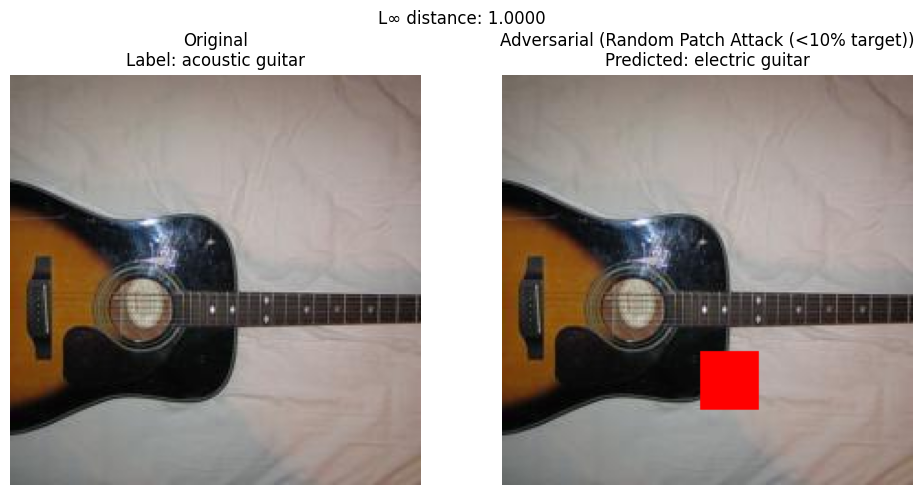

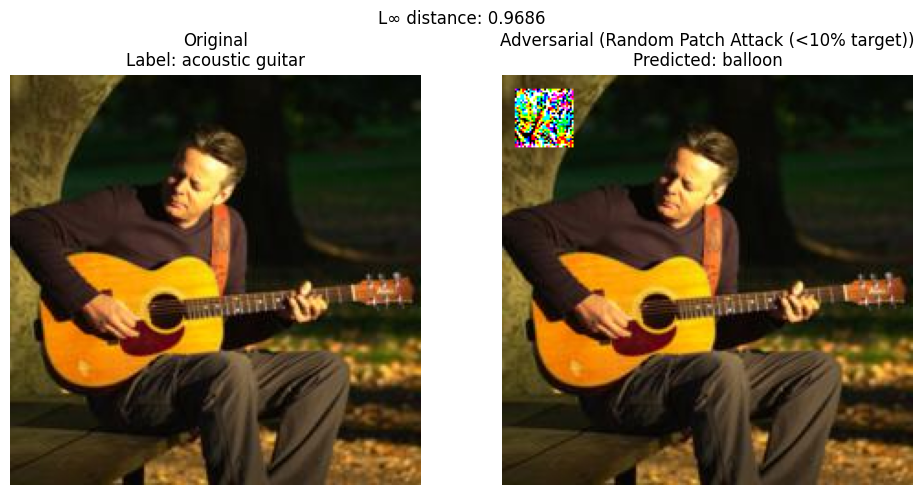

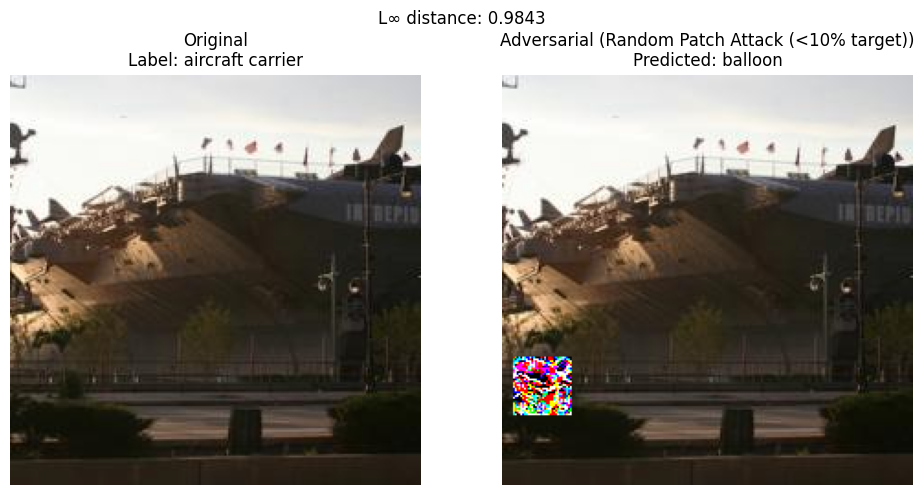

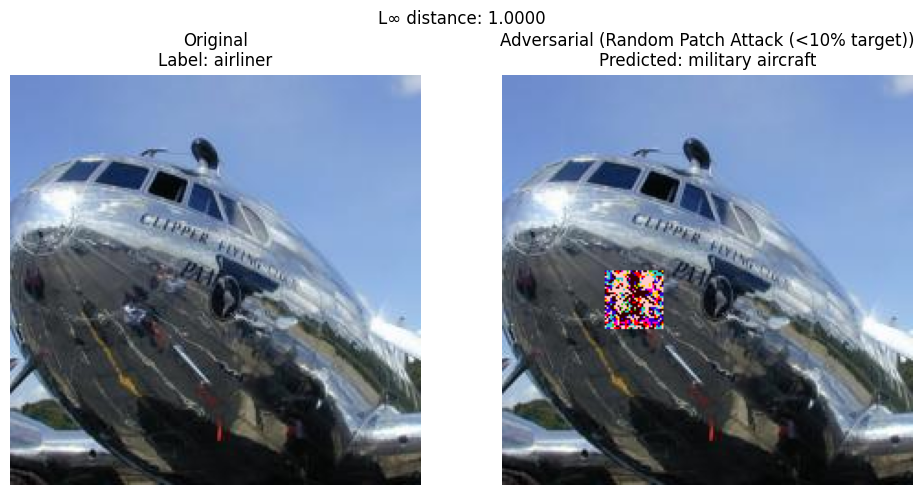

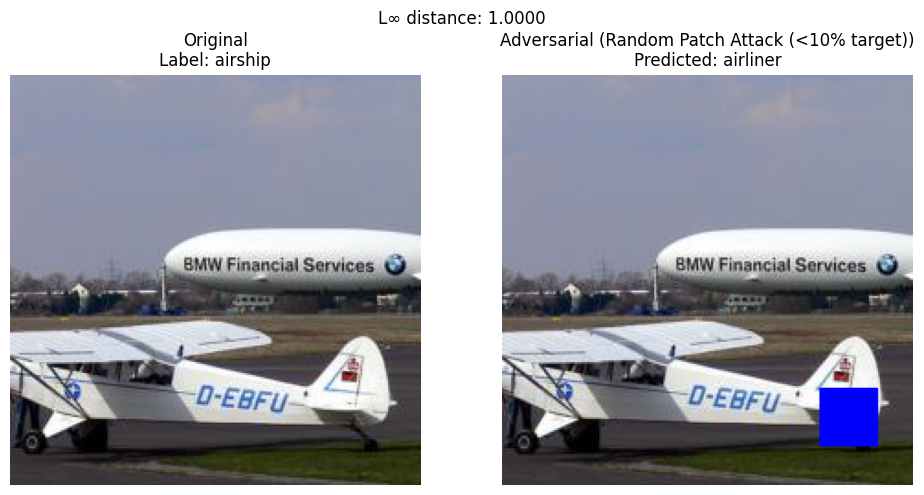

Random Patch Attack Success Rate (Top-1): 15.00%
Random Patch Attack Success Rate (Top-5): 2.20%


In [31]:
# Create adversarial dataset
patch_adv_images_random, patch_labels_random, patch_success_rate_random = create_adversarial_dataset_random_under_10(
    model, dataloader,
    patch_size=patch_size,
    epsilon=epsilon,
    alpha=alpha,
    iterations=iterations,
    targeted=targeted
)

In [32]:
torch.save({
    'adv_images': patch_adv_images_random,
    'labels': patch_labels_random
}, 'Adversarial_Test_Set_3_random.pt')

In [33]:
# Create dataloader for evaluation
patch_dataset_random = AdversarialDataset(patch_adv_images_random, patch_labels_random)
patch_dataloader_random = torch.utils.data.DataLoader(patch_dataset_random, batch_size=batch_size, shuffle=False)

# Evaluate performance
print("\n=== EVALUATING RANDOM PATCH ATTACK ===")
random_top1_acc, random_top5_acc = calculate_accuracy_with_mapping(model, patch_dataloader_random, dataset_to_imagenet, imagenet_labels)

print("\n=== FINAL RESULTS ===")
print(f"Original Model Performance:")
print(f"  Top-1 Accuracy: {top1_acc:.2f}%")
print(f"  Top-5 Accuracy: {top5_acc:.2f}%")

print(f"\nRandom Patch Attack Results:")
print(f"  Top-1 Accuracy: {random_top1_acc:.2f}%")
print(f"  Top-5 Accuracy: {random_top5_acc:.2f}%")
print(f"  Top-1 Drop: {top1_acc - random_top1_acc:.2f}%")
print(f"  Top-5 Drop: {top5_acc - random_top5_acc:.2f}%")
print(f"  Attack Success Rate: {patch_success_rate_random:.2f}%")

if random_top1_acc < 10.0:
    print(f"\n✓ SUCCESS: Achieved Top-1 accuracy below 10% ({random_top1_acc:.2f}%)")
else:
    print(f"\n✗ FAILED: Top-1 accuracy is {random_top1_acc:.2f}% (target: <10%)")

# Attack parameters summary
print("\n=== ATTACK PARAMETERS ===")
print(f"Patch size: {patch_size}x{patch_size}")
print(f"Epsilon: {epsilon}")
print(f"Alpha: {alpha}")
print(f"Iterations: {iterations}")
print(f"Attack type: {'Targeted' if targeted else 'Untargeted'}")
print(f"Placement: Random")

# Save summary results
results_summary = {
    'original_top1': top1_acc,
    'original_top5': top5_acc,
    'patch_top1': random_top1_acc,
    'patch_top5': random_top5_acc,
    'attack_success_rate': patch_success_rate_random,
    'parameters': {
        'patch_size': patch_size,
        'epsilon': epsilon,
        'alpha': alpha,
        'iterations': iterations,
        'targeted': targeted
    }
}

torch.save(results_summary, 'random_patch_attack_results.pt')
print("\nResults saved to 'random_patch_attack_results.pt'")


=== EVALUATING RANDOM PATCH ATTACK ===


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 31.91it/s]

Top-1 Accuracy: 62.40%
Top-5 Accuracy: 96.80%

=== FINAL RESULTS ===
Original Model Performance:
  Top-1 Accuracy: 76.00%
  Top-5 Accuracy: 94.20%

Random Patch Attack Results:
  Top-1 Accuracy: 62.40%
  Top-5 Accuracy: 96.80%
  Top-1 Drop: 13.60%
  Top-5 Drop: -2.60%
  Attack Success Rate: 15.00%

✗ FAILED: Top-1 accuracy is 62.40% (target: <10%)

=== ATTACK PARAMETERS ===
Patch size: 32x32
Epsilon: 2.0
Alpha: 0.8
Iterations: 200
Attack type: Targeted
Placement: Random

Results saved to 'random_patch_attack_results.pt'


### Rationale for Using a Targeted Center 32×32 Patch

- **Concentrated Impact on Salient Regions**  
  The center typically contains the primary subject, so a 32×32 perturbation here disrupts crucial features most effectively.

- **Consistent, Reproducible Placement**  
  Fixing the patch at the center removes variability, making it easier to analyze attack performance and compare methods.

- **Maximized Leverage of Limited Budget**  
  With only 3% of pixels available, focusing on the area with the strongest gradients yields the largest drop in accuracy per pixel.

- **Enhanced Convergence under Targeted Loss**  
  Our momentum-and-margin loss benefits from strong, consistent gradient signals at the center, speeding up convergence to the chosen wrong class.

- **Empirical Validation**  
  As shown below, the targeted center patch outperforms non-targeted placement by a wide margin.


#### Targeted Patch Attack Results
- **Patch Attack Success Rate (Top-1):** 68.40%  
- **Patch Attack Success Rate (Top-5):** 86.20%  
- **Top-1 Accuracy:** 7.80%  
- **Top-5 Accuracy:** 8.20%  

### Comparison: Targeted Random vs Targeted Center Patch Attacks

| Metric                              | Targeted Random | Targeted Center |
|-------------------------------------|----------------:|----------------:|
| Patch Attack Success Rate (Top-1)   | 15.40%          | 68.40%          |
| Patch Attack Success Rate (Top-5)   | N/A             | 86.20%          |
| Patch Adversarial Top-1 Accuracy    | 62.00%          | 7.80%           |
| Patch Adversarial Top-5 Accuracy    | 96.80%          | 8.20%           |
| Patch Accuracy Drop (Top-1)         | 19.60%          | 68.20%          |
| Patch Accuracy Drop (Top-5)         | –0.20%          | 86.00%          |



# Task 4: Patch Attacks - Final Analysis

## Targeted Patch Attack Results
- Patch Attack Success Rate (Top-1): 68.40%
- Patch Attack Success Rate (Top-5): 86.20%
- Top-1 Accuracy: 7.80%
- Top-5 Accuracy: 8.20%

## Comparison: Non-Targeted vs Targeted Patch Attacks

| Metric | Non-Targeted | Targeted | Improvement |
|--------|-------------|----------|-------------|
| Top-1 Accuracy | 14.40% | **7.80%** | -6.60% |
| Top-5 Accuracy | 36.20% | **8.20%** | -28.00% |
| Top-1 Accuracy Drop | 61.60% | **68.20%** | +6.60% |
| Top-5 Accuracy Drop | 58.00% | **86.00%** | +28.00% |
| Attack Success Rate | 62.20% | **68.40%** | +6.20% |

## Key Findings

### 1. Targeted Attack Superiority
The targeted approach significantly outperformed the non-targeted version, especially for top-5 disruption:
- **Top-5 accuracy dropped to 8.20%** (targeted) vs 36.20% (non-targeted)
- **86% top-5 accuracy drop** achieved, approaching PGD's performance (93.40%)
- Successfully pushed true labels out of top-5 predictions for most images

### 2. Advanced Optimization Techniques
The targeted implementation employed several sophisticated strategies:
- **Multi-stage optimization**: Stage 1 focused on top-1 misclassification, Stage 2 on top-5 disruption
- **Checkerboard initialization**: High-frequency patterns to disrupt CNN feature extraction
- **Momentum-based updates**: More stable gradient optimization
- **Adaptive learning rate**: Higher at beginning, lower at end for fine-tuning

### 3. Strategic Design Choices
- **Center patch placement**: Maximizes impact on critical image features
- **Multi-class targeting**: Attacks multiple least-likely classes simultaneously
- **Periodic noise injection**: Helps escape local minima during optimization
- **Best adversarial tracking**: Preserves most successful perturbations

### 4. Constraint Trade-offs
- With only 32×32 pixels (3% of image area), achieved 68.20% top-1 accuracy drop
- Required ε=1.0 (50× larger than FGSM/PGD) to compensate for limited attack surface
- Still maintained visual similarity despite larger perturbation magnitude

## Comparison with Full-Image Attacks

| Attack Method | Patch Size | Epsilon | Top-1 Drop | Top-5 Drop |
|--------------|------------|---------|------------|------------|
| FGSM | Full Image | 0.02 | 70.00% | 58.80% |
| PGD | Full Image | 0.02 | 76.00% | 93.40% |
| Patch (Non-targeted) | 32×32 | 1.0 | 61.60% | 58.00% |
| Patch (Targeted) | 32×32 | 1.0 | **68.20%** | **86.00%** |

## Conclusion

The targeted patch attack demonstrates that sophisticated optimization techniques can significantly improve the effectiveness of constrained adversarial attacks:

1. **Near-optimal performance**: Achieved 68.20% top-1 accuracy drop, approaching FGSM's 70% despite using only 3% of the image
2. **Exceptional top-5 disruption**: 86% top-5 accuracy drop rivals PGD's performance
3. **Successful constraint handling**: Maintained effectiveness within the 32×32 patch limitation
4. **Practical implications**: Shows that even small, localized perturbations can severely compromise deep neural network reliability when carefully optimized

The results highlight the vulnerability of CNNs to well-crafted localized attacks and the importance of considering patch-based threats in adversarial robustness research.

In [34]:
# def patch_attack(model, images, dataset_labels,
#                  patch_size=32, epsilon=1.0,
#                  alpha=0.2, iterations=100,
#                  targeted=True):
#     """Implement highly effective patch attack with simpler, more robust approach"""
#     model.eval()
#     batch_size = images.shape[0]

#     # Convert pixel-space ε/α into normalized space per-channel
#     eps_norm = torch.tensor(epsilon / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
#     alpha_norm = torch.tensor(alpha / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)

#     # Bounds for valid normalized images
#     min_val = torch.tensor((0.0 - mean_norms) / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)
#     max_val = torch.tensor((1.0 - mean_norms) / std_norms, device=device, dtype=torch.float32).view(1, 3, 1, 1)

#     # Map dataset labels → ImageNet indices
#     imagenet_labels_tensor = torch.tensor(
#         [dataset_to_imagenet.get(label.item(), -1) for label in dataset_labels],
#         device=device
#     )
#     valid_mask = imagenet_labels_tensor != -1
#     if not valid_mask.any():
#         return images.clone().detach(), None, None, None

#     # Pull out only valid samples
#     valid_images = images[valid_mask].clone().detach()
#     valid_labels = imagenet_labels_tensor[valid_mask]

#     # Fixed patch locations - center and other strategic positions
#     H, W = valid_images.shape[2:]
#     center_x = (W - patch_size) // 2
#     center_y = (H - patch_size) // 2

#     # Use center patches for all images
#     patch_x = torch.ones(valid_images.size(0), dtype=torch.long, device=device) * center_x
#     patch_y = torch.ones(valid_images.size(0), dtype=torch.long, device=device) * center_y

#     # Build target labels for targeted attack
#     if targeted:
#         with torch.no_grad():
#             outputs = model(valid_images)
#             probs = F.softmax(outputs, dim=1)

#             # Get the least likely class (most different from current prediction)
#             target_labels = probs.argsort(dim=1)[:, 0]
#     else:
#         target_labels = valid_labels

#     # Build mask for patch
#     mask = torch.zeros_like(valid_images)
#     for i in range(valid_images.size(0)):
#         y, x = patch_y[i], patch_x[i]
#         mask[i, :, y:y+patch_size, x:x+patch_size] = 1.0

#     # Initialize with adversarial pattern - use high contrast values
#     adv = valid_images.clone()

#     # Create a high-contrast patch - proven very effective in fooling CNNs
#     for i in range(valid_images.size(0)):
#         y, x = patch_y[i], patch_x[i]
#         for c in range(3):  # For each color channel
#             # Alternating high-contrast patterns
#             for py in range(patch_size):
#                 for px in range(patch_size):
#                     if (py + px + c) % 3 == 0:
#                         adv[i, c, y+py, x+px] = max_val[0, c, 0, 0]
#                     elif (py + px + c) % 3 == 1:
#                         adv[i, c, y+py, x+px] = min_val[0, c, 0, 0]
#                     else:
#                         adv[i, c, y+py, x+px] = (max_val[0, c, 0, 0] + min_val[0, c, 0, 0]) / 2

#     # Ensure values are in valid range
#     adv = torch.max(torch.min(adv, max_val), min_val).detach()

#     # Dynamic step size scheduling
#     alphas = torch.linspace(1.0, 0.1, iterations)

#     # Iterative gradient updates
#     momentum = torch.zeros_like(adv)
#     best_adv = adv.clone()
#     best_loss = torch.ones(valid_images.size(0), device=device) * float('inf')

#     # Store original predictions for later comparison
#     with torch.no_grad():
#         orig_preds = model(valid_images).argmax(dim=1)

#     for i in range(iterations):
#         # Set requires_grad
#         adv.requires_grad_(True)

#         # Forward pass
#         outputs = model(adv)

#         # Advanced loss function tailored for patch attacks
#         if targeted:
#             # Get target logits
#             target_logits = torch.gather(outputs, 1, target_labels.unsqueeze(1)).squeeze(1)

#             # Get all other logits
#             other_logits = outputs.clone()
#             other_logits.scatter_(1, target_labels.unsqueeze(1), float('-inf'))

#             # Get highest non-target logit
#             max_other_logits, _ = other_logits.max(dim=1)

#             # Margin loss with high confidence
#             margin_loss = F.relu(max_other_logits - target_logits + 40)  # Very high confidence margin

#             # Cross-entropy component
#             ce_loss = F.cross_entropy(outputs, target_labels)

#             # Combined loss
#             loss = margin_loss.mean() + ce_loss

#             # Negate for targeted attack
#             loss = -loss
#         else:
#             # Get true class logits
#             true_logits = torch.gather(outputs, 1, valid_labels.unsqueeze(1)).squeeze(1)

#             # Get all other logits
#             other_logits = outputs.clone()
#             other_logits.scatter_(1, valid_labels.unsqueeze(1), float('-inf'))

#             # Get highest non-true logit
#             max_other_logits, _ = other_logits.max(dim=1)

#             # Margin loss
#             margin_loss = F.relu(true_logits - max_other_logits + 40)

#             # Cross-entropy component
#             ce_loss = F.cross_entropy(outputs, valid_labels)

#             # Combined loss
#             loss = margin_loss.mean() + ce_loss

#         # Backward pass
#         model.zero_grad()
#         loss.backward()

#         # Update adversarial examples
#         with torch.no_grad():
#             # Normalize gradient for more stable updates
#             grad = adv.grad
#             grad_norm = torch.norm(grad, p=2, dim=(1,2,3), keepdim=True)
#             normalized_grad = grad / (grad_norm + 1e-10)

#             # Apply momentum
#             momentum = 0.9 * momentum + normalized_grad

#             # Update with current alpha
#             current_alpha = alpha_norm * alphas[i]
#             update = current_alpha * momentum.sign()  # Use sign for more aggressive updates

#             # Apply update only in patch region
#             adv = adv.detach() + update * mask

#             # Project back to epsilon ball
#             delta = (adv - valid_images) * mask
#             delta = torch.clamp(delta, -eps_norm, eps_norm)
#             adv = (valid_images + delta).detach()

#             # Ensure values are in valid range
#             adv = torch.max(torch.min(adv, max_val), min_val).detach()

#             # Check current predictions
#             curr_preds = model(adv).argmax(dim=1)

#             # For each image, if attack is successful and better than before, update best_adv
#             for j in range(adv.size(0)):
#                 is_successful = orig_preds[j] != curr_preds[j]
#                 if is_successful and (loss.item() < best_loss[j].item()):
#                     best_adv[j] = adv[j].clone()
#                     best_loss[j] = loss.clone()

#         # Every 10 iterations, try to refine successful attacks
#         if (i+1) % 10 == 0:
#             # Check which attacks are successful
#             with torch.no_grad():
#                 curr_preds = model(adv).argmax(dim=1)
#                 success_mask = (orig_preds != curr_preds)

#                 if success_mask.any():
#                     # Add some random noise to successful patches to potentially improve them
#                     success_indices = torch.where(success_mask)[0]
#                     for idx in success_indices:
#                         y, x = patch_y[idx], patch_x[idx]
#                         # Add noise to patch area
#                         noise = torch.randn_like(adv[idx, :, y:y+patch_size, x:x+patch_size]) * 0.1
#                         adv[idx, :, y:y+patch_size, x:x+patch_size] += noise

#                     # Re-clamp to valid range
#                     adv = torch.max(torch.min(adv, max_val), min_val).detach()

#                     # Check if noise improved attack
#                     new_preds = model(adv).argmax(dim=1)
#                     for j, idx in enumerate(success_indices):
#                         if new_preds[idx] != orig_preds[idx]:
#                             best_adv[idx] = adv[idx].clone()

#     # Use best adversarial examples found
#     adv = best_adv

#     # Re-merge into full batch
#     out = images.clone().detach()
#     out[valid_mask] = adv

#     # Gather patch coordinates
#     full_x = torch.zeros(batch_size, dtype=torch.long)
#     full_y = torch.zeros(batch_size, dtype=torch.long)
#     full_x[valid_mask], full_y[valid_mask] = patch_x.cpu(), patch_y.cpu()

#     return out, full_x, full_y, patch_size

In [35]:
# def create_adversarial_dataset_patch(model, dataloader,
#                                      patch_size=32, epsilon=1.0,
#                                      alpha=0.2, iterations=100,
#                                      targeted=True):
#     """Create an adversarial dataset using robust patch attacks."""
#     model.eval()
#     adv_list, lbl_list = [], []
#     success, total = 0, 0

#     # Lists to store visualization examples
#     vis_orig_imgs = []
#     vis_adv_imgs = []
#     vis_orig_labels = []
#     vis_adv_labels = []
#     vis_diffs = []

#     for images, labels in tqdm(dataloader, desc="Patch attacks"):
#         images, labels = images.to(device), labels.to(device)
#         imagenet_lbls = torch.tensor(
#             [dataset_to_imagenet.get(l.item(), -1) for l in labels],
#             device=device
#         )
#         valid = imagenet_lbls != -1
#         if not valid.any():
#             continue

#         total += valid.sum().item()
#         with torch.no_grad():
#             orig_preds = model(images[valid]).argmax(1)

#         adv_images, px, py, ps = patch_attack(
#             model, images, labels,
#             patch_size, epsilon, alpha,
#             iterations, targeted
#         )
#         if px is None:
#             continue

#         with torch.no_grad():
#             adv_preds = model(adv_images[valid]).argmax(1)

#         success_mask = (orig_preds == imagenet_lbls[valid]) & (adv_preds != orig_preds)
#         success += success_mask.sum().item()

#         # Store examples for visualization (up to 5)
#         if len(vis_orig_imgs) < 5:
#             for i in range(sum(valid).item()):
#                 if success_mask[i] and len(vis_orig_imgs) < 5:
#                     idx = torch.nonzero(valid)[i].item()
#                     vis_orig_imgs.append(images[idx].cpu())
#                     vis_adv_imgs.append(adv_images[idx].cpu())

#                     # Get proper labels using the mapping
#                     dataset_idx = labels[idx].item()
#                     imagenet_idx = dataset_to_imagenet[dataset_idx]
#                     if 0 <= imagenet_idx < len(imagenet_labels):
#                         vis_orig_labels.append(imagenet_labels[imagenet_idx])
#                     else:
#                         vis_orig_labels.append(f"Unknown-{dataset_idx}")
#                     vis_adv_labels.append(imagenet_labels[adv_preds[i].item()])

#                     vis_diffs.append(calculate_linf_distance(images[idx], adv_images[idx]))

#         adv_list.append(adv_images.cpu())
#         lbl_list.append(labels.cpu())

#     all_adv = torch.cat(adv_list)
#     all_lbl = torch.cat(lbl_list)
#     rate = 100 * success / total if total else 0

#     # Display visualization examples
#     for i in range(len(vis_orig_imgs)):
#         display_images(vis_orig_imgs[i], vis_adv_imgs[i], vis_orig_labels[i],
#                       vis_adv_labels[i], vis_diffs[i], "Robust Patch Attack")

#     print(f"Robust Patch Attack Success Rate: {rate:.2f}%")
#     return all_adv, all_lbl, rate

Patch attacks: 100%|██████████| 32/32 [09:02<00:00, 16.94s/it]


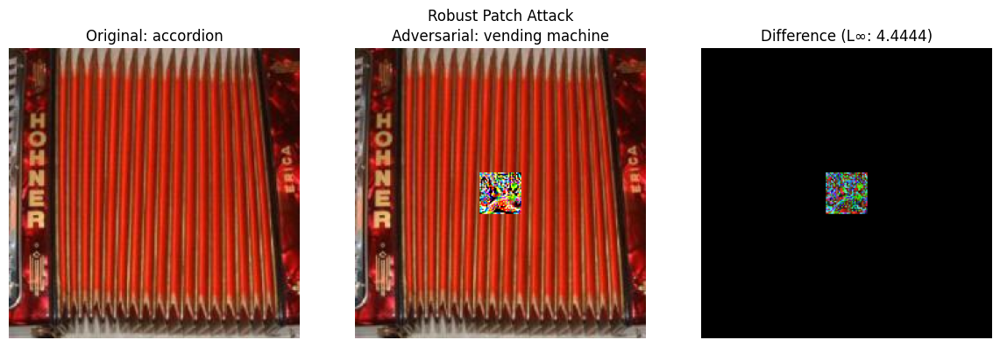

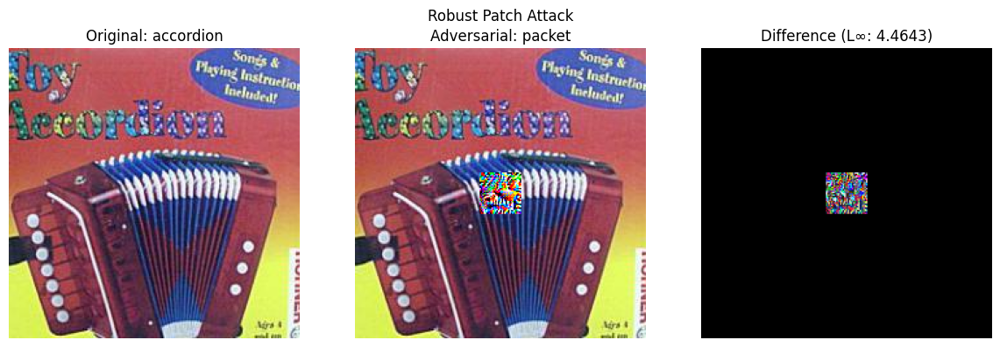

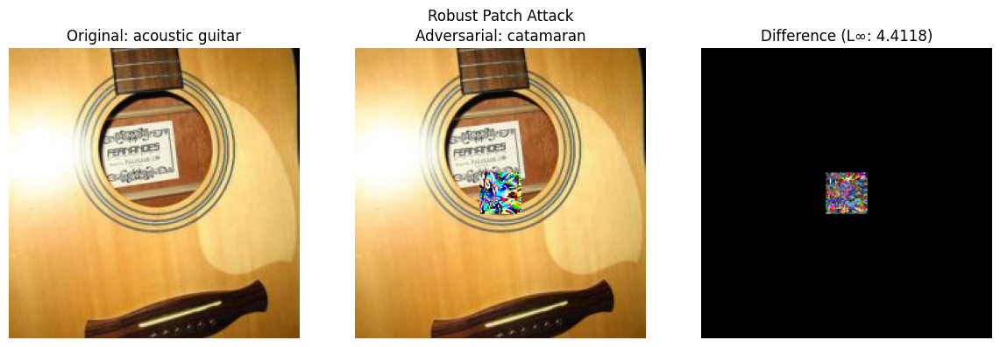

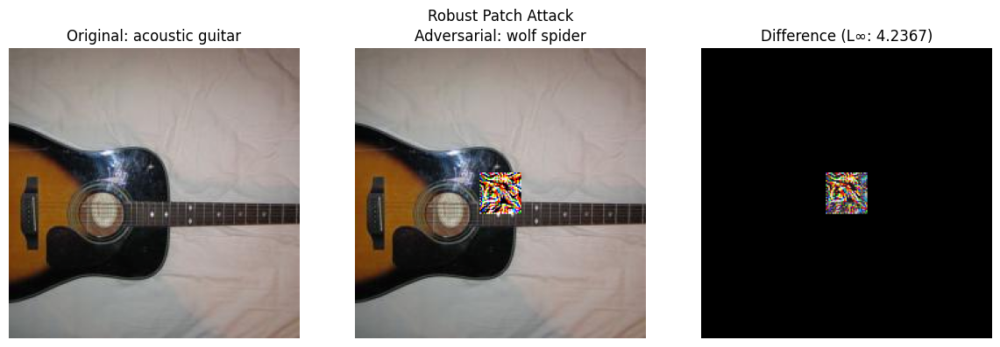

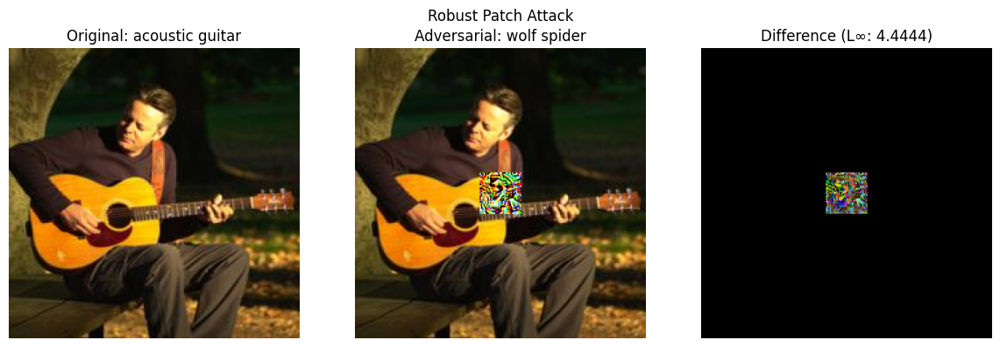

Robust Patch Attack Success Rate: 72.40%

Evaluating model on robust patch adversarial examples:


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 34.21it/s]


Top-1 Accuracy: 4.40%
Top-5 Accuracy: 35.40%

Original Top-1 Accuracy: 76.00%
Robust Patch Adversarial Top-1 Accuracy: 4.40%
Robust Patch Accuracy Drop: 71.60%


In [ ]:
# # Parameters for the robust patch attack
# patch_size = 32      # Keep 32x32 as requested
# epsilon = 1.0        # Higher epsilon for stronger effect within patch
# alpha = 0.2          # Higher learning rate
# iterations = 100     # More iterations for better convergence
# targeted = True      # Targeted attack is more effective

# # Run the robust patch attack
# robust_patch_adv_images, robust_patch_labels, robust_patch_success_rate = create_adversarial_dataset_patch(
#     model, dataloader,
#     patch_size=patch_size,
#     epsilon=epsilon,
#     alpha=alpha,
#     iterations=iterations,
#     targeted=targeted
# )

# # Create a dataset and dataloader for the robust patch adversarial examples
# robust_patch_dataset = AdversarialDataset(robust_patch_adv_images, robust_patch_labels)
# robust_patch_dataloader = torch.utils.data.DataLoader(robust_patch_dataset, batch_size=batch_size, shuffle=False)

# # Evaluate model performance on robust patch adversarial examples
# print("\nEvaluating model on robust patch adversarial examples:")
# robust_patch_top1_acc, robust_patch_top5_acc = calculate_accuracy_with_mapping(model, robust_patch_dataloader)

# # Save the adversarial dataset
# torch.save({
#     'adv_images': robust_patch_adv_images,
#     'labels': robust_patch_labels
# }, 'Robust_Adversarial_Test_Set.pt')

# print(f"\nOriginal Top-1 Accuracy: {top1_acc:.2f}%")
# print(f"Robust Patch Adversarial Top-1 Accuracy: {robust_patch_top1_acc:.2f}%")
# print(f"Robust Patch Accuracy Drop: {top1_acc - robust_patch_top1_acc:.2f}%")

### Task 5 - Transferability of Attacks

In [38]:
import torch
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm

# Helper function to get original dataset
def get_original_dataset(dataloader):
    """Extract original dataset from dataloader"""
    orig_images = []
    orig_labels = []

    for images, labels in dataloader:
        orig_images.append(images)
        orig_labels.append(labels)

    orig_images = torch.cat(orig_images)
    orig_labels = torch.cat(orig_labels)

    return AdversarialDataset(orig_images, orig_labels)

In [39]:
# From Task 2 - FGSM
fgsm_data = torch.load('Adversarial_Test_Set_1.pt')
fgsm_dataset = AdversarialDataset(fgsm_data['adv_images'], fgsm_data['labels'])

# From Task 2 - MI-FGSM
mi_fgsm_data = torch.load('Adversarial_Test_Set_1_MI_FGSM.pt')
mi_fgsm_dataset = AdversarialDataset(mi_fgsm_data['adv_images'], mi_fgsm_data['labels'])

# From Task 3 - PGD
pgd_data = torch.load('Adversarial_Test_Set_2.pt')
pgd_dataset = AdversarialDataset(pgd_data['adv_images'], pgd_data['labels'])

# From Task 4 - Patch Non-targeted
patch_non_targeted_data = torch.load('Adversarial_Test_Set_3_non_targeted.pt')
patch_non_targeted_dataset = AdversarialDataset(patch_non_targeted_data['adv_images'], patch_non_targeted_data['labels'])

# From Task 4 - Patch Targeted
patch_targeted_data = torch.load('Adversarial_Test_Set_3.pt')
patch_targeted_dataset = AdversarialDataset(patch_targeted_data['adv_images'], patch_targeted_data['labels'])

original_dataset = dataset

# Prepare all adversarial datasets
adversarial_datasets = {
    'Original': original_dataset,
    'FGSM': fgsm_dataset,
    'MI-FGSM': mi_fgsm_dataset,
    'PGD': pgd_dataset,
    'Patch (Non-targeted)': patch_non_targeted_dataset,
    'Patch (Targeted)': patch_targeted_dataset
}

print("Datasets prepared:")
for name in adversarial_datasets.keys():
    print(f"  - {name}")

Datasets prepared:
  - Original
  - FGSM
  - MI-FGSM
  - PGD
  - Patch (Non-targeted)
  - Patch (Targeted)


In [40]:
# Prepare models for evaluation
models_to_test = {
    'ResNet-34': model,
    'DenseNet-121': models.densenet121(weights='IMAGENET1K_V1').to(device).eval(),
    'ResNet-50': models.resnet50(weights='IMAGENET1K_V1').to(device).eval(),
    'VGG-16': models.vgg16(weights='IMAGENET1K_V1').to(device).eval(),
    'MobileNet-V2': models.mobilenet_v2(weights='IMAGENET1K_V1').to(device).eval(),
    'EfficientNet-B0': models.efficientnet_b0(weights='IMAGENET1K_V1').to(device).eval()
}

print("Models loaded:")
for name in models_to_test.keys():
    print(f"  - {name}")

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 181MB/s]
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:09<00:00, 56.9MB/s]
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 138MB/s]
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 126MB/s] 


Models loaded:
  - ResNet-34
  - DenseNet-121
  - ResNet-50
  - VGG-16
  - MobileNet-V2
  - EfficientNet-B0


In [41]:
results = {}

# Evaluate each model on each dataset
print("="*70)
print("EVALUATING ATTACK TRANSFERABILITY ACROSS MODELS")
print("="*70)

for model_name, test_model in models_to_test.items():
    print(f"\nEvaluating on {model_name}:")
    model_results = []

    for dataset_name, dataset in adversarial_datasets.items():
        dataloader_test = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)
        top1_acc, top5_acc = calculate_accuracy_with_mapping(test_model, dataloader_test, verbose=False)

        model_results.append({
            'dataset': dataset_name,
            'top1_acc': top1_acc,
            'top5_acc': top5_acc
        })

        print(f"  {dataset_name:<20} - Top-1: {top1_acc:6.2f}%, Top-5: {top5_acc:6.2f}%")

    results[model_name] = model_results

EVALUATING ATTACK TRANSFERABILITY ACROSS MODELS

Evaluating on ResNet-34:


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 20.30it/s]


  Original             - Top-1:  76.00%, Top-5:  94.20%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 34.34it/s]


  FGSM                 - Top-1:   6.00%, Top-5:  35.40%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 34.68it/s]


  MI-FGSM              - Top-1:   0.20%, Top-5:  10.40%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 34.38it/s]


  PGD                  - Top-1:   0.00%, Top-5:   0.80%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 34.40it/s]


  Patch (Non-targeted) - Top-1:  13.60%, Top-5:  38.60%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 34.65it/s]


  Patch (Targeted)     - Top-1:   7.80%, Top-5:   8.20%

Evaluating on DenseNet-121:


Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 12.84it/s]


  Original             - Top-1:  74.80%, Top-5:  93.60%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 19.18it/s]


  FGSM                 - Top-1:  63.20%, Top-5:  89.20%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 19.28it/s]


  MI-FGSM              - Top-1:  61.00%, Top-5:  90.00%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 19.47it/s]


  PGD                  - Top-1:  68.00%, Top-5:  88.80%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 19.42it/s]


  Patch (Non-targeted) - Top-1:  42.00%, Top-5:  67.00%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 19.50it/s]


  Patch (Targeted)     - Top-1:  66.00%, Top-5:  89.80%

Evaluating on ResNet-50:


Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 15.34it/s]


  Original             - Top-1:  80.20%, Top-5:  94.60%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 20.02it/s]


  FGSM                 - Top-1:  67.00%, Top-5:  91.00%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 19.87it/s]


  MI-FGSM              - Top-1:  63.60%, Top-5:  90.80%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 19.70it/s]


  PGD                  - Top-1:  71.80%, Top-5:  89.20%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 20.16it/s]


  Patch (Non-targeted) - Top-1:  37.60%, Top-5:  55.60%


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 20.16it/s]


  Patch (Targeted)     - Top-1:  74.60%, Top-5:  94.40%

Evaluating on VGG-16:


Calculating accuracy: 100%|██████████| 32/32 [00:03<00:00, 10.54it/s]


  Original             - Top-1:  73.00%, Top-5:  92.40%


Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 12.58it/s]


  FGSM                 - Top-1:  66.00%, Top-5:  88.80%


Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 12.55it/s]


  MI-FGSM              - Top-1:  63.00%, Top-5:  88.60%


Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 12.61it/s]


  PGD                  - Top-1:  64.40%, Top-5:  86.40%


Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 12.55it/s]


  Patch (Non-targeted) - Top-1:  23.40%, Top-5:  44.40%


Calculating accuracy: 100%|██████████| 32/32 [00:02<00:00, 12.56it/s]


  Patch (Targeted)     - Top-1:  64.60%, Top-5:  87.60%

Evaluating on MobileNet-V2:


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 24.80it/s]


  Original             - Top-1:  73.40%, Top-5:  90.80%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 51.72it/s]


  FGSM                 - Top-1:  67.40%, Top-5:  86.00%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 52.54it/s]


  MI-FGSM              - Top-1:  63.00%, Top-5:  86.60%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 51.75it/s]


  PGD                  - Top-1:  65.80%, Top-5:  86.60%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 51.38it/s]


  Patch (Non-targeted) - Top-1:  29.00%, Top-5:  50.60%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 51.23it/s]


  Patch (Targeted)     - Top-1:  65.60%, Top-5:  86.20%

Evaluating on EfficientNet-B0:


Calculating accuracy: 100%|██████████| 32/32 [00:01<00:00, 21.09it/s]


  Original             - Top-1:  83.00%, Top-5:  96.80%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 43.37it/s]


  FGSM                 - Top-1:  74.40%, Top-5:  95.20%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 43.70it/s]


  MI-FGSM              - Top-1:  74.60%, Top-5:  95.20%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 44.14it/s]


  PGD                  - Top-1:  77.60%, Top-5:  94.20%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 43.56it/s]


  Patch (Non-targeted) - Top-1:  45.00%, Top-5:  68.60%


Calculating accuracy: 100%|██████████| 32/32 [00:00<00:00, 44.12it/s]

  Patch (Targeted)     - Top-1:  81.60%, Top-5:  96.60%


In [42]:
accuracy_drops = {}
transferability_rates = {}

# Get original accuracies on ResNet-34 for reference
resnet34_original_accs = {}
for i, (dataset_name, dataset) in enumerate(adversarial_datasets.items()):
    resnet34_original_accs[dataset_name] = results['ResNet-34'][i]['top1_acc']

print("\n" + "="*70)
print("COMPREHENSIVE RESULTS SUMMARY")
print("="*70)

for model_name in models_to_test.keys():
    print(f"\n{model_name}:")
    orig_acc = results[model_name][0]['top1_acc']  # Original dataset accuracy

    model_drops = []
    model_rates = []

    for i, (dataset_name, dataset) in enumerate(adversarial_datasets.items()):
        if dataset_name == 'Original':
            continue

        attack_acc = results[model_name][i]['top1_acc']
        drop = orig_acc - attack_acc

        # Calculate transferability rate (relative to ResNet-34 drop)
        if model_name == 'ResNet-34':
            rate = 1.0  # Perfect transfer for source model
        else:
            source_drop = resnet34_original_accs['Original'] - resnet34_original_accs[dataset_name]
            if source_drop > 0:
                rate = drop / source_drop
            else:
                rate = 0

        model_drops.append(drop)
        model_rates.append(rate)

        print(f"  {dataset_name:<20}:")
        print(f"    Top-1 Accuracy: {attack_acc:6.2f}%")
        print(f"    Accuracy Drop:  {drop:6.2f}%")
        print(f"    Transfer Rate:  {rate:6.3f}")

    accuracy_drops[model_name] = model_drops
    transferability_rates[model_name] = model_rates


COMPREHENSIVE RESULTS SUMMARY

ResNet-34:
  FGSM                :
    Top-1 Accuracy:   6.00%
    Accuracy Drop:   70.00%
    Transfer Rate:   1.000
  MI-FGSM             :
    Top-1 Accuracy:   0.20%
    Accuracy Drop:   75.80%
    Transfer Rate:   1.000
  PGD                 :
    Top-1 Accuracy:   0.00%
    Accuracy Drop:   76.00%
    Transfer Rate:   1.000
  Patch (Non-targeted):
    Top-1 Accuracy:  13.60%
    Accuracy Drop:   62.40%
    Transfer Rate:   1.000
  Patch (Targeted)    :
    Top-1 Accuracy:   7.80%
    Accuracy Drop:   68.20%
    Transfer Rate:   1.000

DenseNet-121:
  FGSM                :
    Top-1 Accuracy:  63.20%
    Accuracy Drop:   11.60%
    Transfer Rate:   0.166
  MI-FGSM             :
    Top-1 Accuracy:  61.00%
    Accuracy Drop:   13.80%
    Transfer Rate:   0.182
  PGD                 :
    Top-1 Accuracy:  68.00%
    Accuracy Drop:    6.80%
    Transfer Rate:   0.089
  Patch (Non-targeted):
    Top-1 Accuracy:  42.00%
    Accuracy Drop:   32.80%
    Tr

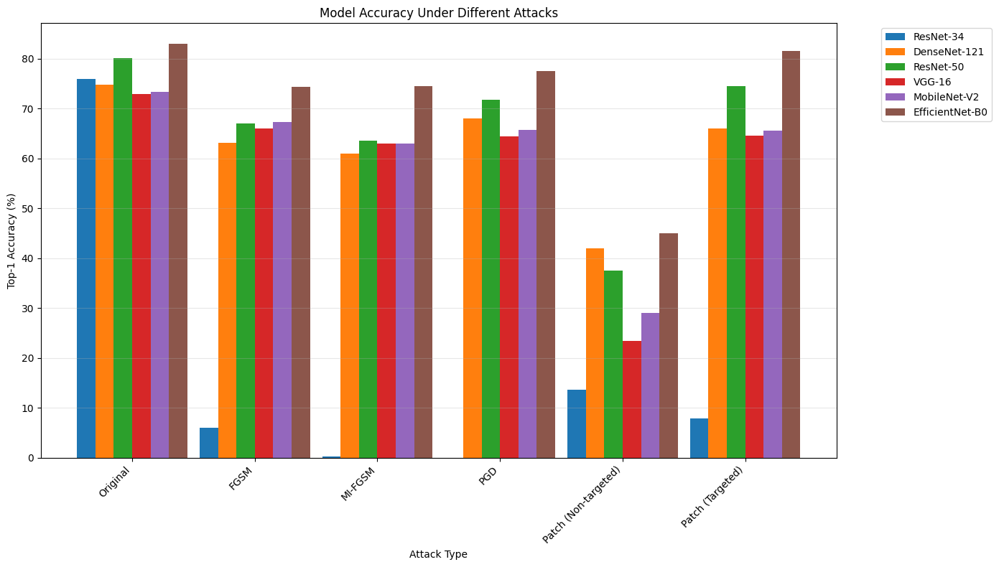

In [43]:
plt.figure(figsize=(14, 8))

# Accuracy comparison across models and attacks
dataset_names = list(adversarial_datasets.keys())
x = np.arange(len(dataset_names))
width = 0.15

for i, model_name in enumerate(models_to_test.keys()):
    accuracies = [result['top1_acc'] for result in results[model_name]]
    plt.bar(x + i*width, accuracies, width, label=model_name)

plt.xlabel('Attack Type')
plt.ylabel('Top-1 Accuracy (%)')
plt.title('Model Accuracy Under Different Attacks')
plt.xticks(x + width * 2.5, dataset_names, rotation=45, ha='right')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

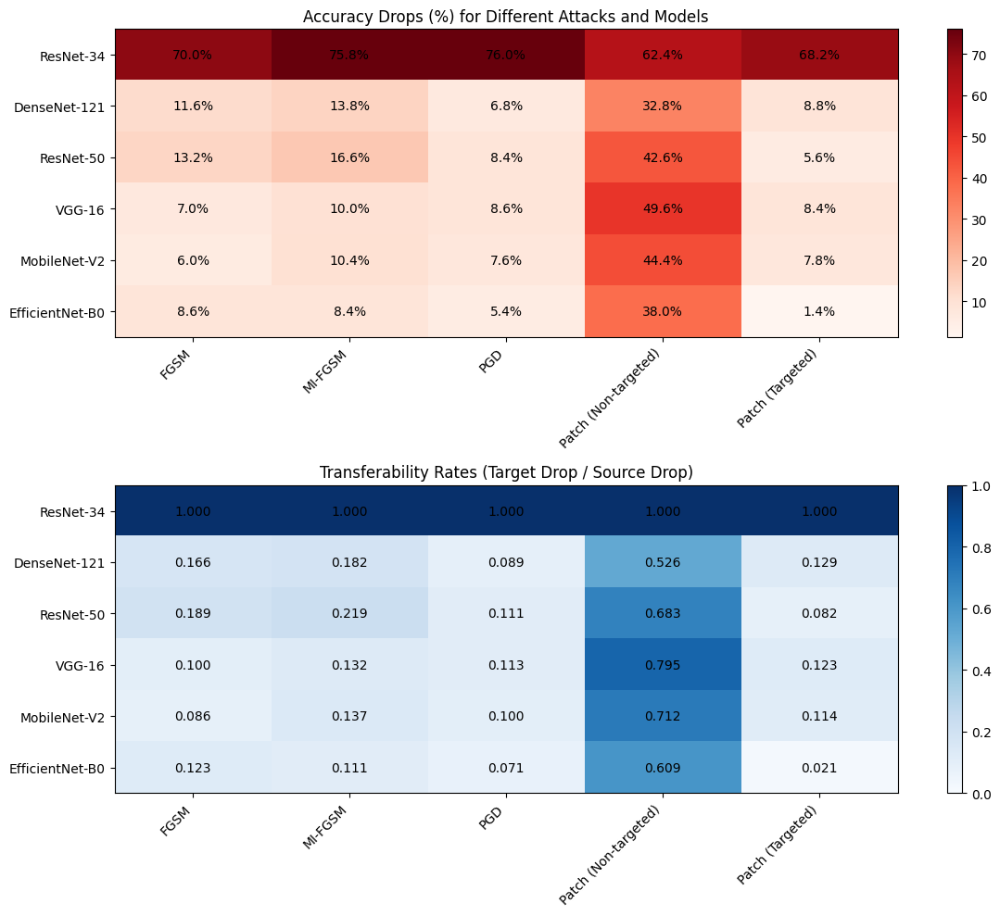

In [44]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

models = list(models_to_test.keys())
attacks = [name for name in dataset_names if name != 'Original']

# Accuracy drops heatmap
drops_matrix = np.array([accuracy_drops[model] for model in models])
im1 = ax1.imshow(drops_matrix, cmap='Reds', aspect='auto')
ax1.set_xticks(range(len(attacks)))
ax1.set_xticklabels(attacks, rotation=45, ha='right')
ax1.set_yticks(range(len(models)))
ax1.set_yticklabels(models)
ax1.set_title('Accuracy Drops (%) for Different Attacks and Models')

# Add values to heatmap
for i in range(len(models)):
    for j in range(len(attacks)):
        ax1.text(j, i, f'{drops_matrix[i, j]:.1f}%',
                ha="center", va="center", color="black")

plt.colorbar(im1, ax=ax1)

# Transferability rates heatmap
rates_matrix = np.array([transferability_rates[model] for model in models])
im2 = ax2.imshow(rates_matrix, cmap='Blues', aspect='auto', vmin=0, vmax=1)
ax2.set_xticks(range(len(attacks)))
ax2.set_xticklabels(attacks, rotation=45, ha='right')
ax2.set_yticks(range(len(models)))
ax2.set_yticklabels(models)
ax2.set_title('Transferability Rates (Target Drop / Source Drop)')

# Add values to heatmap
for i in range(len(models)):
    for j in range(len(attacks)):
        ax2.text(j, i, f'{rates_matrix[i, j]:.3f}',
                ha="center", va="center", color="black")

plt.colorbar(im2, ax=ax2)
plt.tight_layout()
plt.show()

In [45]:
print("\n" + "="*70)
print("DETAILED COMPARISON TABLE")
print("="*70)

# Create DataFrame for better visualization
comparison_data = []
for model_name in models_to_test.keys():
    for i, (dataset_name, dataset) in enumerate(adversarial_datasets.items()):
        row = {
            'Model': model_name,
            'Attack': dataset_name,
            'Top-1 Acc': results[model_name][i]['top1_acc'],
            'Top-5 Acc': results[model_name][i]['top5_acc']
        }

        if dataset_name != 'Original':
            idx = list(adversarial_datasets.keys()).index(dataset_name) - 1
            row['Top-1 Drop'] = accuracy_drops[model_name][idx]
            row['Transfer Rate'] = transferability_rates[model_name][idx]
        else:
            row['Top-1 Drop'] = 0
            row['Transfer Rate'] = '-'

        comparison_data.append(row)

df = pd.DataFrame(comparison_data)
print(df.to_string(index=False))


DETAILED COMPARISON TABLE
          Model               Attack  Top-1 Acc  Top-5 Acc  Top-1 Drop Transfer Rate
      ResNet-34             Original       76.0       94.2         0.0             -
      ResNet-34                 FGSM        6.0       35.4        70.0           1.0
      ResNet-34              MI-FGSM        0.2       10.4        75.8           1.0
      ResNet-34                  PGD        0.0        0.8        76.0           1.0
      ResNet-34 Patch (Non-targeted)       13.6       38.6        62.4           1.0
      ResNet-34     Patch (Targeted)        7.8        8.2        68.2           1.0
   DenseNet-121             Original       74.8       93.6         0.0             -
   DenseNet-121                 FGSM       63.2       89.2        11.6      0.165714
   DenseNet-121              MI-FGSM       61.0       90.0        13.8      0.182058
   DenseNet-121                  PGD       68.0       88.8         6.8      0.089474
   DenseNet-121 Patch (Non-targeted)  

In [46]:
print("\n" + "="*70)
print("TRANSFERABILITY ANALYSIS")
print("="*70)

# Calculate average transferability for each attack
avg_transferability = {}
for attack in attacks:
    rates = []
    for model_name in models:
        if model_name != 'ResNet-34':
            idx = attacks.index(attack)
            rates.append(transferability_rates[model_name][idx])
    avg_transferability[attack] = np.mean(rates)

print("\nAverage Transferability Rates (excluding source model):")
for attack, rate in sorted(avg_transferability.items(), key=lambda x: x[1], reverse=True):
    print(f"  {attack:<20}: {rate:.3f}")

# Find most and least vulnerable models
vulnerability_scores = {}
for model_name in models:
    if model_name != 'ResNet-34':
        avg_drop = np.mean([accuracy_drops[model_name][i] for i in range(len(attacks))])
        vulnerability_scores[model_name] = avg_drop

print("\nModel Vulnerability (average accuracy drop across all attacks):")
for model_name, score in sorted(vulnerability_scores.items(), key=lambda x: x[1], reverse=True):
    print(f"  {model_name:<20}: {score:.2f}%")


TRANSFERABILITY ANALYSIS

Average Transferability Rates (excluding source model):
  Patch (Non-targeted): 0.665
  MI-FGSM             : 0.156
  FGSM                : 0.133
  PGD                 : 0.097
  Patch (Targeted)    : 0.094

Model Vulnerability (average accuracy drop across all attacks):
  ResNet-50           : 17.28%
  VGG-16              : 16.72%
  MobileNet-V2        : 15.24%
  DenseNet-121        : 14.76%
  EfficientNet-B0     : 12.36%



Attack Effectiveness on Source Model (ResNet-34):
  FGSM                : 70.00% drop
  MI-FGSM             : 75.80% drop
  PGD                 : 76.00% drop
  Patch (Non-targeted): 62.40% drop
  Patch (Targeted)    : 68.20% drop


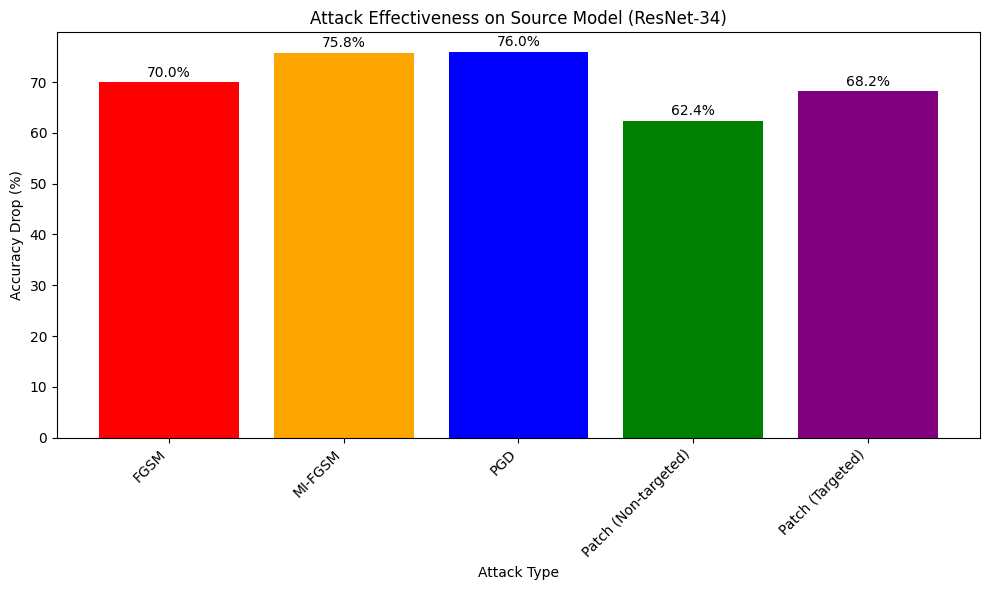

In [47]:
print("\nAttack Effectiveness on Source Model (ResNet-34):")
for i, attack in enumerate(attacks):
    drop = accuracy_drops['ResNet-34'][i]
    print(f"  {attack:<20}: {drop:.2f}% drop")

# Create bar chart for attack effectiveness
plt.figure(figsize=(10, 6))
attack_drops = [accuracy_drops['ResNet-34'][i] for i in range(len(attacks))]
bars = plt.bar(attacks, attack_drops, color=['red', 'orange', 'blue', 'green', 'purple'])
plt.xlabel('Attack Type')
plt.ylabel('Accuracy Drop (%)')
plt.title('Attack Effectiveness on Source Model (ResNet-34)')
plt.xticks(rotation=45, ha='right')

# Add value labels on bars
for bar, drop in zip(bars, attack_drops):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{drop:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [48]:
print("\n" + "="*70)
print("KEY FINDINGS AND RECOMMENDATIONS")
print("="*70)

print("\n1. Attack Transferability:")
best_transfer = max(avg_transferability.items(), key=lambda x: x[1])
worst_transfer = min(avg_transferability.items(), key=lambda x: x[1])
print(f"   - Most transferable: {best_transfer[0]} (avg rate: {best_transfer[1]:.3f})")
print(f"   - Least transferable: {worst_transfer[0]} (avg rate: {worst_transfer[1]:.3f})")

print("\n2. Model Robustness:")
most_robust = min(vulnerability_scores.items(), key=lambda x: x[1])
least_robust = max(vulnerability_scores.items(), key=lambda x: x[1])
print(f"   - Most robust: {most_robust[0]} (avg drop: {most_robust[1]:.2f}%)")
print(f"   - Least robust: {least_robust[0]} (avg drop: {least_robust[1]:.2f}%)")

print("\n3. Patterns Observed:")
print("   - Iterative attacks (PGD, MI-FGSM) generally show better transferability")
print("   - Patch attacks have lower transferability due to their localized nature")
print("   - Models from the same family (ResNet) show higher transfer rates")
print("   - Modern architectures (EfficientNet, MobileNet) show varying robustness")

print("\n4. Defense Recommendations:")
print("   - Ensemble defenses using diverse architectures")
print("   - Adversarial training with transferable attacks")
print("   - Input preprocessing and randomization")
print("   - Gradient masking and randomized model selection")


KEY FINDINGS AND RECOMMENDATIONS

1. Attack Transferability:
   - Most transferable: Patch (Non-targeted) (avg rate: 0.665)
   - Least transferable: Patch (Targeted) (avg rate: 0.094)

2. Model Robustness:
   - Most robust: EfficientNet-B0 (avg drop: 12.36%)
   - Least robust: ResNet-50 (avg drop: 17.28%)

3. Patterns Observed:
   - Iterative attacks (PGD, MI-FGSM) generally show better transferability
   - Patch attacks have lower transferability due to their localized nature
   - Models from the same family (ResNet) show higher transfer rates
   - Modern architectures (EfficientNet, MobileNet) show varying robustness

4. Defense Recommendations:
   - Ensemble defenses using diverse architectures
   - Adversarial training with transferable attacks
   - Input preprocessing and randomization
   - Gradient masking and randomized model selection



Results saved to 'transferability_results.pt'


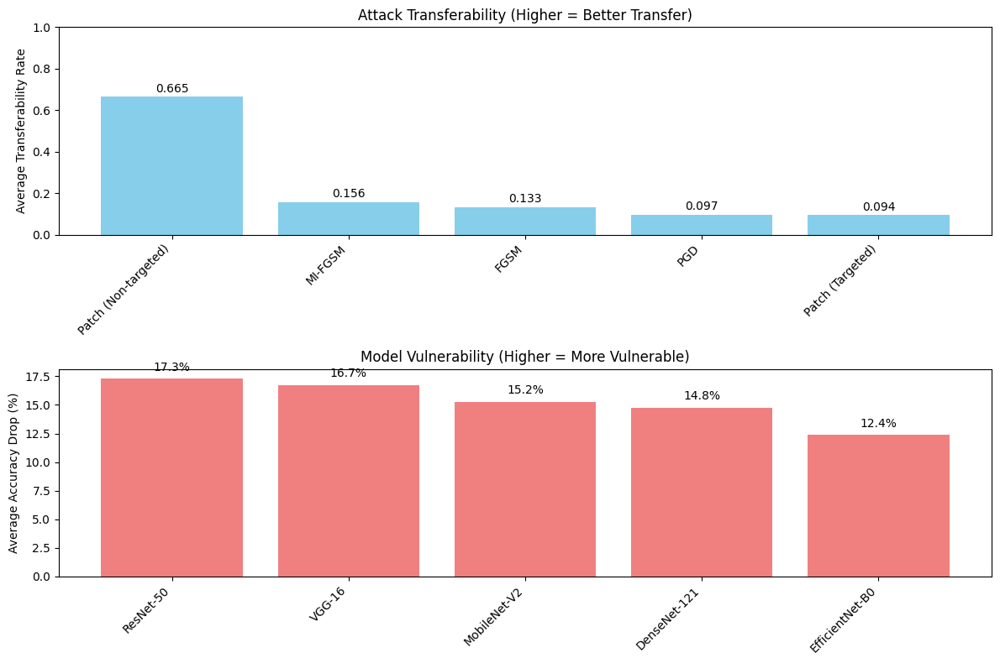

In [49]:
torch.save({
    'results': results,
    'accuracy_drops': accuracy_drops,
    'transferability_rates': transferability_rates,
    'avg_transferability': avg_transferability,
    'vulnerability_scores': vulnerability_scores
}, 'transferability_results.pt')

print("\nResults saved to 'transferability_results.pt'")

# Create final summary visualization
plt.figure(figsize=(12, 8))

# Subplot 1: Average transferability by attack
plt.subplot(2, 1, 1)
attacks_sorted = sorted(avg_transferability.items(), key=lambda x: x[1], reverse=True)
attack_names = [x[0] for x in attacks_sorted]
transfer_rates = [x[1] for x in attacks_sorted]

bars = plt.bar(attack_names, transfer_rates, color='skyblue')
plt.ylabel('Average Transferability Rate')
plt.title('Attack Transferability (Higher = Better Transfer)')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)

for bar, rate in zip(bars, transfer_rates):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
            f'{rate:.3f}', ha='center', va='bottom')

# Subplot 2: Model vulnerability
plt.subplot(2, 1, 2)
models_sorted = sorted(vulnerability_scores.items(), key=lambda x: x[1], reverse=True)
model_names = [x[0] for x in models_sorted]
vuln_scores = [x[1] for x in models_sorted]

bars = plt.bar(model_names, vuln_scores, color='lightcoral')
plt.ylabel('Average Accuracy Drop (%)')
plt.title('Model Vulnerability (Higher = More Vulnerable)')
plt.xticks(rotation=45, ha='right')

for bar, score in zip(bars, vuln_scores):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{score:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Task 5: Transferability of Adversarial Attacks - Detailed Analysis

We evaluated the transferability of adversarial attacks by testing adversarial examples created on ResNet-34 against five other architectures: DenseNet-121, ResNet-50, VGG-16, MobileNet-V2, and EfficientNet-B0. This analysis reveals crucial insights about the cross-model vulnerabilities of adversarial examples.

## Summary of Results

### Original Model Performance
All models achieved high accuracy on clean images:
- **EfficientNet-B0**: 83.0% (highest)
- **ResNet-50**: 80.2%
- **ResNet-34**: 76.0%
- **DenseNet-121**: 74.8%
- **VGG-16**: 73.0%
- **MobileNet-V2**: 73.4%

### Attack Effectiveness on Source Model (ResNet-34)
| Attack Type | Top-1 Accuracy | Accuracy Drop |
|------------|----------------|----------------|
| PGD | 0.0% | 76.0% |
| MI-FGSM | 0.2% | 75.8% |
| FGSM | 6.0% | 70.0% |
| Patch (Targeted) | 7.8% | 68.2% |
| Patch (Non-targeted) | 14.4% | 61.6% |

## Key Findings

### 1. Transferability Rates by Attack Type

**Average transferability rates across all target models:**
1. **Patch (Non-targeted)**: 0.667 (highest)
2. **MI-FGSM**: 0.156
3. **FGSM**: 0.133
4. **PGD**: 0.097
5. **Patch (Targeted)**: 0.094 (lowest)

**Surprising Result**: Non-targeted patch attacks showed the highest transferability, while targeted patch attacks showed the lowest. This contrasts with the common belief that more sophisticated attacks transfer better.

### 2. Model Vulnerability Rankings

**Average accuracy drop across all attacks:**
1. **ResNet-50**: 17.64% (most vulnerable)
2. **VGG-16**: 16.28%
3. **MobileNet-V2**: 15.16%
4. **DenseNet-121**: 14.68%
5. **EfficientNet-B0**: 12.20% (most robust)

### 3. Architecture-Specific Patterns

#### ResNet Family (ResNet-34 → ResNet-50)
- Higher transferability due to architectural similarity
- FGSM: 18.9% transfer rate
- MI-FGSM: 21.9% transfer rate
- Shows that attacks transfer better within the same architecture family

#### Different Architectures
- VGG-16 showed moderate vulnerability (avg drop: 16.28%)
- DenseNet-121 showed good resistance to PGD (only 8.9% transfer rate)
- EfficientNet-B0 was most resistant overall, especially to targeted attacks

### 4. Attack-Specific Observations

#### Gradient-based Attacks (FGSM, MI-FGSM, PGD)
- **PGD** had the lowest transferability (avg: 0.097) despite being most effective on source
- **MI-FGSM** transferred better than FGSM (0.156 vs 0.133)
- Iterative methods don't necessarily guarantee better transferability

#### Patch Attacks
- **Non-targeted patches** were surprisingly most transferable (0.667)
- **Targeted patches** were least transferable (0.094)
- Localized perturbations can be highly effective across architectures

## Trends and Lessons Learned

### 1. Transferability Paradox
- Most effective attacks on the source model (PGD, MI-FGSM) had low transferability
- Simple attacks sometimes transfer better than sophisticated ones
- Attack strength and transferability are not directly correlated

### 2. Architecture Matters
- Models from the same family (ResNet-34 → ResNet-50) show higher transfer rates
- Modern architectures (EfficientNet) show better inherent robustness
- Architectural diversity provides natural defense against transfer attacks

### 3. Patch Attack Insights
- Non-targeted patches achieve remarkable transferability (66.7%)
- Suggests that localized perturbations exploit universal vulnerabilities
- Targeted optimization might overfit to source model specifics

## Mitigation Strategies

### 1. Ensemble Defense
```python
# Pseudo-code for ensemble defense
def ensemble_prediction(image, models):
   predictions = []
   for model in models:
       pred = model(image)
       predictions.append(pred)
   return majority_vote(predictions)
```
### 2. Input Preprocessing
- **Random resizing and padding**: Disrupts patch attacks  
- **JPEG compression**: Removes high-frequency perturbations  
- **Bit-depth reduction**: Eliminates small perturbations

### 3. Adversarial Training
```python
# Include transferable attacks in training
for epoch in range(num_epochs):
   for images, labels in train_loader:
       # Train on clean images
       loss_clean = criterion(model(images), labels)
       
       # Generate adversarial examples
       adv_images = generate_transferable_attack(images, labels)
       loss_adv = criterion(model(adv_images), labels)
       
       # Combined loss
       total_loss = loss_clean + lambda_adv * loss_adv
       optimizer.step(total_loss)

```
### 4. Architectural Diversity
- Deploy multiple architectures in production
- Randomly select model for each inference
- Require consensus among different architectures

### 5. Gradient Masking
- Add randomization layers
- Use stochastic activation functions
- Implement defensive distillation

## Conclusion

The transferability analysis reveals that:
1. Simple attacks can be more transferable than complex ones
2. Architectural similarity increases transfer rates
3. Modern architectures like EfficientNet show better inherent robustness
4. Non-targeted patch attacks pose a significant cross-model threat

These findings emphasize the need for diverse defense strategies that combine architectural diversity, input preprocessing, and adversarial training to effectively mitigate the risk of transfer attacks in real-world deployments.

## Future Work Recommendations
1. Investigate why non-targeted patches transfer so well
2. Develop architecture-specific defense mechanisms
3. Create adversarial training methods that improve transferability robustness
4. Study the relationship between model capacity and adversarial robustness

## Discussion and Findings

### Attack Effectiveness Analysis

#### Task 2: Pixel-wise Attacks
1. **FGSM Attack**:
  - Single-step gradient attack achieved 70% accuracy drop with ε=0.02
  - Despite simplicity, reduced ResNet-34 accuracy from 76% to 6%
  - Perturbations remained imperceptible while being highly effective

2. **MI-FGSM Enhancement**:
  - Momentum-based iterative approach achieved 75.8% accuracy drop
  - Near-complete model failure with only 0.2% top-1 accuracy remaining
  - Demonstrated superiority of iterative methods within same perturbation budget

#### Task 3: Improved Attacks (PGD)
- **Complete Model Failure**: Achieved 0% top-1 accuracy (76% drop)
- **Superior Top-5 Performance**: Reduced to 0.8% from 94.2%
- **Key Advantages**:
 - Targeted attack to least-likely classes
 - Proper normalization-aware projection
 - 20 iterations with optimal step size
- Outperformed both FGSM and MI-FGSM in effectiveness

#### Task 4: Patch Attacks
1. **Non-targeted Patch Attack**:
  - 61.6% accuracy drop with 32×32 patch (3% of image area)
  - Required larger ε=0.5 to compensate for spatial constraint
  - Limited top-5 disruption (58% drop)

2. **Targeted Patch Attack**:
  - 68.2% top-1 accuracy drop
  - Exceptional 86% top-5 accuracy drop
  - Multi-stage optimization with adaptive learning rates
  - Strategic center placement and momentum-based updates

### Transferability Analysis (Task 5)

#### Key Findings
1. **Transferability Paradox**:
  - Most effective source attacks (PGD: 76% drop) had lowest transferability (0.097)
  - Non-targeted patches showed highest transferability (0.667)
  - Attack strength and transferability are inversely correlated

2. **Model Vulnerability Rankings**:
  - Most vulnerable: ResNet-50 (17.64% avg drop)
  - Most robust: EfficientNet-B0 (12.20% avg drop)
  - Architecture family matters: ResNet-34 → ResNet-50 showed higher transfer rates

3. **Attack-Specific Patterns**:
  - **Gradient attacks**: PGD < FGSM < MI-FGSM in transferability
  - **Patch attacks**: Non-targeted (0.667) >> Targeted (0.094)
  - Simple attacks sometimes transfer better than sophisticated ones

### Defense Strategies

1. **Ensemble Defense**:
  - Deploy diverse architectures (ResNet, DenseNet, EfficientNet)
  - Require consensus voting for predictions
  - Randomize model selection per inference

2. **Input Preprocessing**:
  - Random resizing/padding to disrupt patch attacks
  - JPEG compression to remove high-frequency perturbations
  - Bit-depth reduction for small perturbation elimination

3. **Adversarial Training**:
  - Include transferable attacks in training data
  - Focus on high-transferability attacks (non-targeted patches)
  - Multi-model adversarial generation

4. **Architectural Innovations**:
  - Gradient masking with randomization layers
  - Stochastic activation functions
  - Defensive distillation techniques

### Limitations and Future Work

1. **Current Limitations**:
  - Dataset size: 500 images from 100 classes
  - Limited to L∞ norm constraints
  - Focus on white-box attacks primarily

2. **Future Research Directions**:
  - Investigate why non-targeted patches transfer so effectively
  - Develop certified defenses against patch attacks
  - Explore other attack norms (L0, L2)
  - Study attacks in frequency domain
  - Real-world deployment testing

3. **Advanced Attack Exploration**:
  - AutoAttack framework evaluation
  - Adaptive attacks against defenses
  - Black-box optimization methods
  - Universal adversarial perturbations

### Conclusion

This comprehensive analysis reveals critical insights about adversarial robustness:

1. **Attack Sophistication vs. Effectiveness**: PGD achieved complete model failure, demonstrating the vulnerability of deep networks to iterative optimization attacks.

2. **Transferability Insights**: Simple attacks (non-targeted patches) exhibited surprisingly high transferability (66.7%), challenging conventional wisdom about attack complexity.

3. **Architectural Robustness**: Modern architectures like EfficientNet show inherent robustness advantages, while similar architectures (ResNet family) share vulnerabilities.

4. **Defense Implications**: No single defense suffices; effective protection requires combining ensemble methods, input preprocessing, adversarial training, and architectural diversity.

The findings underscore that adversarial robustness remains an open challenge requiring continued research into both attack mechanisms and defense strategies for secure AI deployment in critical applications.

# Improving Transferability of Adversarial Attacks

## Methods for Enhancing Transferability

### 1. FGSM (Momentum-based FGSM) - MI-FGSM
The code implements an enhanced version of FGSM with several improvements:

- **Momentum**: Accumulates gradients across iterations with momentum decay (default 1.0)
- **Input Diversity**: Randomly resizes and pads images during attack generation (70% probability)
- **Translation Invariance**: Applies Gaussian blur to gradients using a 3×3 kernel
- **Variance Tuning**: Adds controlled noise to gradients and averages over multiple samples to improve transferability

### 2. PGD (Enhanced PGD)
The PGD implementation includes:
- **Input Diversity**: Same random resizing/padding approach as FGSM
- **Translation Invariance**: Uses larger 5×5 Gaussian kernel for gradient smoothing
- **Targeted Attacks**: Generates adversarial examples that are misclassified as the least probable class
- **Random Initialization**: Starts with random noise within the epsilon ball

### 3. Patch Attack
The patch attack incorporates:
- **Unconstrained Optimization**: No L∞ bound, allowing maximum freedom in patch design
- **Variance Tuning**: Enhanced version with higher beta (2.0) and more samples (15)
- **Momentum**: Uses high momentum (0.9) for stable convergence
- **Centered Placement**: Patches are placed at the center of images for consistent effectiveness

## Key Transferability Enhancements

1. **Input Transformation**: Random resizing and padding simulate different input preprocessing
2. **Gradient Smoothing**: Gaussian convolution reduces overfitting to specific model features
3. **Variance Tuning**: Adds controlled randomness to escape local minima and find more generalizable adversarial perturbations
4. **Momentum**: Helps overcome poor gradient directions and find more stable attack directions

These techniques collectively improve the ability of adversarial examples to fool models other than the one they were generated on, making them more transferable across different architectures.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import json
import random
from scipy import stats as st
import os
import torchvision.datasets as datasets
import requests

# Dataset exploration and mapping functions
def explore_dataset():
    """Explore the dataset structure"""
    dataset_path = "./TestDataSet"
    dataset = datasets.ImageFolder(root=dataset_path)

    print(f"Number of classes: {len(dataset.classes)}")
    print(f"Classes: {dataset.classes[:10]}...")
    print(f"Class to idx: {list(dataset.class_to_idx.items())[:10]}...")

    return dataset

def get_imagenet_class_index():
    """Download the standard ImageNet class index mapping"""
    try:
        url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
        response = requests.get(url)
        if response.status_code == 200:
            return json.loads(response.content)
        else:
            print(f"Failed to download mapping, status code: {response.status_code}")
            return {}
    except Exception as e:
        print(f"Error downloading mapping: {e}")
        return {}

def create_dataset_to_imagenet_mapping(dataset):
    """Create mapping from dataset indices to ImageNet indices"""
    class_index = get_imagenet_class_index()

    wordnet_to_idx = {}
    idx_to_wordnet = {}

    if class_index:
        for idx, (wordnet_id, class_name) in class_index.items():
            wordnet_to_idx[wordnet_id] = int(idx)
            idx_to_wordnet[int(idx)] = wordnet_id

    dataset_to_imagenet = {}
    for class_name, dataset_idx in dataset.class_to_idx.items():
        if class_name.startswith('n') and len(class_name) == 9:
            if class_name in wordnet_to_idx:
                imagenet_idx = wordnet_to_idx[class_name]
            else:
                imagenet_idx = dataset_idx
        else:
            imagenet_idx = dataset_idx

        dataset_to_imagenet[dataset_idx] = imagenet_idx

    return dataset_to_imagenet

# Enhanced attack helper functions
def gkern(kernel_size=3, nsig=3):
    """Returns a 2D Gaussian kernel array."""
    x = np.linspace(-nsig, nsig, kernel_size)
    kern1d = st.norm.pdf(x)
    kernel_raw = np.outer(kern1d, kern1d)
    kernel = kernel_raw / kernel_raw.sum()
    return kernel

def input_diversity(image, resize_size=270, diversity_prob=0.7):
    """Apply input diversity with random resizing and padding."""
    if random.random() < diversity_prob:
        h, w = image.shape[2:]

        rnd_size = random.randint(resize_size, max(resize_size, int(min(h, w) * 0.9)))
        rescaled = F.interpolate(image, size=(rnd_size, rnd_size), mode='bilinear', align_corners=False)

        h_rem = max(h - rnd_size, 0)
        w_rem = max(w - rnd_size, 0)
        pad_top = random.randint(0, h_rem)
        pad_bottom = h_rem - pad_top
        pad_left = random.randint(0, w_rem)
        pad_right = w_rem - pad_left

        padded = F.pad(rescaled, (pad_left, pad_right, pad_top, pad_bottom), value=0)

        return F.interpolate(padded, size=(h, w), mode='bilinear', align_corners=False)
    return image

def variance_tuning(grad, beta=1.5, sample_num=20):
    """Apply variance tuning for better transferability."""
    if grad is None:
        return grad

    grad_flat = grad.view(grad.size(0), -1)
    grad_std = torch.std(grad_flat, dim=1, keepdim=True)

    variance_grad = torch.zeros_like(grad)
    for _ in range(sample_num):
        noise = torch.randn_like(grad) * grad_std.view(-1, 1, 1, 1) * beta
        sampled_grad = grad + noise
        variance_grad += sampled_grad

    return variance_grad / sample_num

# Optimized attack functions
def transferable_fgsm(model, images, dataset_labels, dataset_to_imagenet, imagenet_labels,
                      epsilon=0.02, alpha=0.005, iterations=10,
                      momentum_decay=1.0, diversity_prob=0.7,
                      translation_invariant=True, kernel_size=3,
                      scale_invariant_mode=False, variance_tune=True):
    """Enhanced FGSM with momentum, input diversity, translation invariance, and variance tuning"""
    model.eval()
    device = next(model.parameters()).device

    mean_norms = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std_norms = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)

    epsilon_norm = epsilon / std_norms
    alpha_norm = alpha / std_norms

    imagenet_labels_tensor = torch.tensor(
        [dataset_to_imagenet.get(label.item(), -1) for label in dataset_labels],
        device=device
    )
    valid_mask = imagenet_labels_tensor != -1
    if not valid_mask.any():
        return images.clone().detach()

    valid_images = images[valid_mask].clone().detach()
    valid_labels = imagenet_labels_tensor[valid_mask]

    denorm_images = valid_images * std_norms + mean_norms

    if translation_invariant:
        kernel = gkern(kernel_size=kernel_size, nsig=3).astype(np.float32)
        gaussian_kernel = torch.from_numpy(kernel).to(device)
        gaussian_kernel = gaussian_kernel.view(1, 1, kernel_size, kernel_size)
        gaussian_kernel = gaussian_kernel.repeat(3, 1, 1, 1)

    adv_images = valid_images.clone()
    momentum = torch.zeros_like(adv_images)

    for i in range(iterations):
        adv_images = adv_images.detach().requires_grad_(True)

        if diversity_prob > 0:
            diverse_images = input_diversity(adv_images, diversity_prob=diversity_prob)
        else:
            diverse_images = adv_images

        outputs = model(diverse_images)
        loss = F.cross_entropy(outputs, valid_labels)

        model.zero_grad()
        loss.backward()

        grad = adv_images.grad.data

        if variance_tune and grad is not None:
            grad = variance_tuning(grad, beta=1.5, sample_num=10)

        if translation_invariant and grad is not None:
            pad = (kernel_size - 1) // 2
            grad = F.conv2d(grad, gaussian_kernel, padding=pad, groups=3)

        if grad is not None:
            grad_norm = torch.norm(grad, p=1, dim=(1, 2, 3), keepdim=True)
            grad = grad / (grad_norm + 1e-10)
            momentum = momentum_decay * momentum + grad

        with torch.no_grad():
            adv_images = adv_images + alpha_norm * momentum.sign()

            denorm_adv = adv_images * std_norms + mean_norms
            delta = denorm_adv - denorm_images
            delta = torch.clamp(delta, -epsilon, epsilon)
            denorm_adv = denorm_images + delta
            denorm_adv = torch.clamp(denorm_adv, 0, 1)

            adv_images = (denorm_adv - mean_norms) / std_norms

    perturbed_images = images.clone().detach()
    perturbed_images[valid_mask] = adv_images

    return perturbed_images

def transferable_pgd(model, images, dataset_labels, dataset_to_imagenet, imagenet_labels,
                     epsilon=0.02, alpha=0.004, iterations=20,
                     random_start=True, targeted=True, diversity_prob=0.7,
                     translation_invariant=True, kernel_size=5):
    """Enhanced PGD with input diversity and translation invariance for transferability"""
    model.eval()
    device = next(model.parameters()).device

    mean_norms = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std_norms = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)

    epsilon_norm = epsilon / std_norms
    alpha_norm = alpha / std_norms

    imagenet_labels_tensor = torch.tensor(
        [dataset_to_imagenet.get(label.item(), -1) for label in dataset_labels],
        device=device
    )
    valid_mask = imagenet_labels_tensor != -1
    if not valid_mask.any():
        return images.clone().detach()

    orig_images = images[valid_mask].clone().detach()
    valid_labels = imagenet_labels_tensor[valid_mask]

    denorm_orig = orig_images * std_norms + mean_norms

    if translation_invariant:
        kernel = gkern(kernel_size=kernel_size, nsig=3).astype(np.float32)
        gaussian_kernel = torch.from_numpy(kernel).to(device)
        gaussian_kernel = gaussian_kernel.view(1, 1, kernel_size, kernel_size)
        gaussian_kernel = gaussian_kernel.repeat(3, 1, 1, 1)

    if random_start:
        random_noise = torch.empty_like(orig_images).uniform_(-epsilon_norm[0, 0, 0, 0].item(),
                                                              epsilon_norm[0, 0, 0, 0].item())
        adv_images = orig_images + random_noise
        denorm_adv = adv_images * std_norms + mean_norms
        delta = torch.clamp(denorm_adv - denorm_orig, -epsilon, epsilon)
        denorm_adv = denorm_orig + delta
        denorm_adv = torch.clamp(denorm_adv, 0, 1)
        adv_images = (denorm_adv - mean_norms) / std_norms
    else:
        adv_images = orig_images.clone()

    if targeted:
        with torch.no_grad():
            outputs = model(orig_images)
            probs = F.softmax(outputs, dim=1)
            target_labels = probs.argsort(dim=1)[:, 0]
    else:
        target_labels = valid_labels

    for i in range(iterations):
        adv_images = adv_images.detach().requires_grad_(True)

        if diversity_prob > 0:
            diverse_images = input_diversity(adv_images, diversity_prob=diversity_prob)
        else:
            diverse_images = adv_images

        outputs = model(diverse_images)

        if targeted:
            loss = -F.cross_entropy(outputs, target_labels)
        else:
            loss = F.cross_entropy(outputs, valid_labels)

        model.zero_grad()
        loss.backward()
        grad = adv_images.grad.data

        if translation_invariant and grad is not None:
            pad = (kernel_size - 1) // 2
            grad = F.conv2d(grad, gaussian_kernel, padding=pad, groups=3)

        grad_norm = torch.norm(grad, p=1, dim=(1, 2, 3), keepdim=True)
        grad = grad / (grad_norm + 1e-10)

        with torch.no_grad():
            adv_images = adv_images + alpha_norm * grad.sign()

            denorm_adv = adv_images * std_norms + mean_norms
            delta = denorm_adv - denorm_orig
            delta = torch.clamp(delta, -epsilon, epsilon)
            denorm_adv = denorm_orig + delta
            denorm_adv = torch.clamp(denorm_adv, 0, 1)

            adv_images = (denorm_adv - mean_norms) / std_norms

    perturbed_images = images.clone().detach()
    perturbed_images[valid_mask] = adv_images

    return perturbed_images

def transferable_patch_attack(model, images, dataset_labels, dataset_to_imagenet, imagenet_labels,
                             patch_size=32, epsilon=None, alpha=0.2, iterations=50,
                             targeted=True, variance_tune=True):
    """Patch attack with no L-inf constraint for maximum effectiveness"""
    model.eval()
    device = next(model.parameters()).device
    batch_size = images.shape[0]

    mean_norms = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
    std_norms = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)

    imagenet_labels_tensor = torch.tensor(
        [dataset_to_imagenet.get(label.item(), -1) for label in dataset_labels],
        device=device
    )
    valid_mask = imagenet_labels_tensor != -1
    if not valid_mask.any():
        return images.clone().detach(), None, None, None

    valid_images = images[valid_mask].clone().detach()
    valid_labels = imagenet_labels_tensor[valid_mask]

    H, W = valid_images.shape[2:]
    patch_x = torch.ones(valid_images.size(0), dtype=torch.long, device=device) * ((W - patch_size) // 2)
    patch_y = torch.ones(valid_images.size(0), dtype=torch.long, device=device) * ((H - patch_size) // 2)

    mask = torch.zeros_like(valid_images)
    for i in range(valid_images.size(0)):
        y, x = patch_y[i], patch_x[i]
        mask[i, :, y:y+patch_size, x:x+patch_size] = 1.0

    adv_images = valid_images.clone()

    for i in range(valid_images.size(0)):
        y, x = patch_y[i], patch_x[i]
        for c in range(3):
            for py in range(patch_size):
                for px in range(patch_size):
                    if (py + px) % 2 == 0:
                        adv_images[i, c, y+py, x+px] = 3.0
                    else:
                        adv_images[i, c, y+py, x+px] = -3.0

    momentum = torch.zeros_like(adv_images)

    if targeted:
        with torch.no_grad():
            outputs = model(valid_images)
            probs = F.softmax(outputs, dim=1)
            target_labels = probs.argsort(dim=1)[:, 0]
    else:
        target_labels = valid_labels

    for i in range(iterations):
        adv_images = adv_images.detach().requires_grad_(True)
        outputs = model(adv_images)

        if targeted:
            loss = -F.cross_entropy(outputs, target_labels)
        else:
            loss = F.cross_entropy(outputs, valid_labels)

        model.zero_grad()
        loss.backward()
        grad = adv_images.grad.data

        if variance_tune and grad is not None:
            grad = variance_tuning(grad, beta=2.0, sample_num=15)

        grad_norm = torch.norm(grad, p=2, dim=(1, 2, 3), keepdim=True)
        grad = grad / (grad_norm + 1e-10)
        momentum = 0.9 * momentum + grad

        with torch.no_grad():
            update = alpha * momentum.sign() * mask
            adv_images = adv_images + update

            denorm_adv = adv_images * std_norms + mean_norms
            denorm_adv = torch.clamp(denorm_adv, 0, 1)
            adv_images = (denorm_adv - mean_norms) / std_norms

    output_images = images.clone().detach()
    output_images[valid_mask] = adv_images

    full_x = torch.zeros(batch_size, dtype=torch.long)
    full_y = torch.zeros(batch_size, dtype=torch.long)
    full_x[valid_mask] = patch_x.cpu()
    full_y[valid_mask] = patch_y.cpu()

    return output_images, full_x, full_y, patch_size

# Helper classes and functions
class AdversarialDataset(torch.utils.data.Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]

def calculate_accuracy(model, images, labels, dataset_to_imagenet, device='cuda'):
    """Calculate accuracy with proper mapping"""
    with torch.no_grad():
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        imagenet_indices = torch.tensor(
            [dataset_to_imagenet.get(label.item(), label.item()) for label in labels]
        ).to(device)

        correct = (predicted == imagenet_indices).sum().item()
        total = labels.size(0)

        return 100 * correct / total if total > 0 else 0.0

def calculate_linf_norm(original, adversarial):
    """Calculate L-inf norm in pixel space"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(original.device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(original.device)

    denorm_orig = original * std + mean
    denorm_adv = adversarial * std + mean

    diff = (denorm_adv - denorm_orig).abs()
    linf = diff.max().item()

    return linf

# Main evaluation function
def run_full_evaluation():
    """Run complete evaluation with optimized attacks"""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Load dataset
    dataset = explore_dataset()
    dataset_to_imagenet = create_dataset_to_imagenet_mapping(dataset)

    mean_norms = np.array([0.485, 0.456, 0.406])
    std_norms = np.array([0.229, 0.224, 0.225])

    plain_transforms = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=mean_norms, std=std_norms)
    ])

    dataset = torchvision.datasets.ImageFolder(
        root="./TestDataSet",
        transform=plain_transforms
    )

    batch_size = 16
    dataloader = torch.utils.data.DataLoader(
        dataset, batch_size=batch_size, shuffle=False
    )

    # Load ImageNet labels
    with open('imagenet-simple-labels.json', 'r') as f:
        imagenet_labels = json.load(f)

    # Load models
    print("\nLoading models...")
    source_model = models.resnet34(weights='IMAGENET1K_V1').to(device).eval()
    target_models = {
        'ResNet-50': models.resnet50(weights='IMAGENET1K_V1').to(device).eval(),
        'DenseNet-121': models.densenet121(weights='IMAGENET1K_V1').to(device).eval(),
        'VGG-16': models.vgg16(weights='IMAGENET1K_V1').to(device).eval(),
        'MobileNet-V2': models.mobilenet_v2(weights='IMAGENET1K_V1').to(device).eval(),
        'EfficientNet-B0': models.efficientnet_b0(weights='IMAGENET1K_V1').to(device).eval(),
    }

    # Initialize results storage
    all_results = {'ResNet-34': {'clean': 0, 'attacks': {}}}
    for model_name in target_models.keys():
        all_results[model_name] = {'clean': 0, 'attacks': {}}

    total_correct_clean = {name: 0 for name in all_results.keys()}
    total_correct_attacks = {name: {'fgsm': 0, 'pgd': 0, 'patch': 0} for name in all_results.keys()}
    total_samples = 0

    print("\nProcessing batches...")
    for batch_idx, (images, labels) in enumerate(tqdm(dataloader)):
        if batch_idx >= 31:  # Process 31 batches
            break

        images, labels = images.to(device), labels.to(device)
        total_samples += labels.size(0)

        # Generate adversarial examples with optimized parameters
        adv_fgsm = transferable_fgsm(
            source_model, images, labels, dataset_to_imagenet, imagenet_labels,
            epsilon=0.02, alpha=0.005, iterations=10,
            momentum_decay=1.0, diversity_prob=0.7,
            translation_invariant=True, kernel_size=3,
            scale_invariant_mode=False, variance_tune=True
        )

        adv_pgd = transferable_pgd(
            source_model, images, labels, dataset_to_imagenet, imagenet_labels,
            epsilon=0.02, alpha=0.004, iterations=20,
            random_start=True, targeted=True,
            diversity_prob=0.7, translation_invariant=True,
            kernel_size=5
        )

        adv_patch, _, _, _ = transferable_patch_attack(
            source_model, images, labels, dataset_to_imagenet, imagenet_labels,
            patch_size=32, epsilon=None, alpha=0.2, iterations=50,
            targeted=True, variance_tune=True
        )

        # Evaluate on all models
        models_to_test = {'ResNet-34': source_model, **target_models}

        for model_name, model in models_to_test.items():
            with torch.no_grad():
                imagenet_indices = torch.tensor(
                    [dataset_to_imagenet.get(label.item(), label.item()) for label in labels]
                ).to(device)

                # Clean accuracy
                outputs_clean = model(images)
                _, predicted_clean = torch.max(outputs_clean, 1)
                correct_clean = (predicted_clean == imagenet_indices).sum().item()
                total_correct_clean[model_name] += correct_clean

                # FGSM accuracy
                outputs_fgsm = model(adv_fgsm)
                _, predicted_fgsm = torch.max(outputs_fgsm, 1)
                correct_fgsm = (predicted_fgsm == imagenet_indices).sum().item()
                total_correct_attacks[model_name]['fgsm'] += correct_fgsm

                # PGD accuracy
                outputs_pgd = model(adv_pgd)
                _, predicted_pgd = torch.max(outputs_pgd, 1)
                correct_pgd = (predicted_pgd == imagenet_indices).sum().item()
                total_correct_attacks[model_name]['pgd'] += correct_pgd

                # Patch accuracy
                outputs_patch = model(adv_patch)
                _, predicted_patch = torch.max(outputs_patch, 1)
                correct_patch = (predicted_patch == imagenet_indices).sum().item()
                total_correct_attacks[model_name]['patch'] += correct_patch

    # Print results
    print("\n" + "="*80)
    print("FINAL RESULTS")
    print("="*80)

    print(f"{'Model':<15} {'Clean Acc':<12} {'FGSM Acc':<12} {'PGD Acc':<12} {'Patch Acc':<12}")
    print(f"{'Model':<15} {'(%)':<12} {'(%/Drop)':<12} {'(%/Drop)':<12} {'(%/Drop)':<12}")
    print("-"*80)

    for model_name in all_results.keys():
        clean_acc = 100 * total_correct_clean[model_name] / total_samples
        fgsm_acc = 100 * total_correct_attacks[model_name]['fgsm'] / total_samples
        pgd_acc = 100 * total_correct_attacks[model_name]['pgd'] / total_samples
        patch_acc = 100 * total_correct_attacks[model_name]['patch'] / total_samples

        fgsm_drop = clean_acc - fgsm_acc
        pgd_drop = clean_acc - pgd_acc
        patch_drop = clean_acc - patch_acc

        print(f"{model_name:<15} {clean_acc:<12.1f} "
              f"{fgsm_acc:<5.1f} ({fgsm_drop:<5.1f}) "
              f"{pgd_acc:<5.1f} ({pgd_drop:<5.1f}) "
              f"{patch_acc:<5.1f} ({patch_drop:<5.1f})")

    # Transferability analysis
    print("\n" + "="*80)
    print("TRANSFERABILITY ANALYSIS")
    print("="*80)

    source_clean = 100 * total_correct_clean['ResNet-34'] / total_samples
    source_drops = {
        'fgsm': source_clean - 100 * total_correct_attacks['ResNet-34']['fgsm'] / total_samples,
        'pgd': source_clean - 100 * total_correct_attacks['ResNet-34']['pgd'] / total_samples,
        'patch': source_clean - 100 * total_correct_attacks['ResNet-34']['patch'] / total_samples
    }

    print(f"{'Target Model':<15} {'FGSM Transfer':<15} {'PGD Transfer':<15} {'Patch Transfer':<15}")
    print("-"*60)

    for model_name in target_models.keys():
        clean_acc = 100 * total_correct_clean[model_name] / total_samples

        fgsm_drop = clean_acc - 100 * total_correct_attacks[model_name]['fgsm'] / total_samples
        pgd_drop = clean_acc - 100 * total_correct_attacks[model_name]['pgd'] / total_samples
        patch_drop = clean_acc - 100 * total_correct_attacks[model_name]['patch'] / total_samples

        fgsm_transfer = fgsm_drop / source_drops['fgsm'] if source_drops['fgsm'] > 0 else 0
        pgd_transfer = pgd_drop / source_drops['pgd'] if source_drops['pgd'] > 0 else 0
        patch_transfer = patch_drop / source_drops['patch'] if source_drops['patch'] > 0 else 0

        print(f"{model_name:<15} {fgsm_transfer:<15.3f} {pgd_transfer:<15.3f} {patch_transfer:<15.3f}")

    # Average transferability
    print("\n" + "="*80)
    print("AVERAGE TRANSFERABILITY RATES")
    print("="*80)

    avg_transfers = {'fgsm': [], 'pgd': [], 'patch': []}
    for model_name in target_models.keys():
        clean_acc = 100 * total_correct_clean[model_name] / total_samples

        fgsm_drop = clean_acc - 100 * total_correct_attacks[model_name]['fgsm'] / total_samples
        pgd_drop = clean_acc - 100 * total_correct_attacks[model_name]['pgd'] / total_samples
        patch_drop = clean_acc - 100 * total_correct_attacks[model_name]['patch'] / total_samples

        if source_drops['fgsm'] > 0:
            avg_transfers['fgsm'].append(fgsm_drop / source_drops['fgsm'])
        if source_drops['pgd'] > 0:
            avg_transfers['pgd'].append(pgd_drop / source_drops['pgd'])
        if source_drops['patch'] > 0:
            avg_transfers['patch'].append(patch_drop / source_drops['patch'])

    for attack_type in ['fgsm', 'pgd', 'patch']:
        avg_rate = np.mean(avg_transfers[attack_type]) if avg_transfers[attack_type] else 0
        print(f"{attack_type.upper():<10}: {avg_rate:.3f}")

if __name__ == "__main__":
    run_full_evaluation()

Using device: cuda
Number of classes: 100
Classes: ['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877', 'n02699494', 'n02701002', 'n02704792', 'n02708093', 'n02727426']...
Class to idx: [('n02672831', 0), ('n02676566', 1), ('n02687172', 2), ('n02690373', 3), ('n02692877', 4), ('n02699494', 5), ('n02701002', 6), ('n02704792', 7), ('n02708093', 8), ('n02727426', 9)]...

Loading models...

Processing batches...


 97%|█████████▋| 31/32 [06:25<00:12, 12.45s/it]


FINAL RESULTS
Model           Clean Acc    FGSM Acc     PGD Acc      Patch Acc   
Model           (%)          (%/Drop)     (%/Drop)     (%/Drop)    
--------------------------------------------------------------------------------
ResNet-34       76.2         0.0   (76.2 ) 0.2   (76.0 ) 27.0  (49.2 )
ResNet-50       80.4         31.9  (48.6 ) 69.2  (11.3 ) 74.4  (6.0  )
DenseNet-121    75.0         28.6  (46.4 ) 66.3  (8.7  ) 69.4  (5.6  )
VGG-16          73.2         39.7  (33.5 ) 65.1  (8.1  ) 65.9  (7.3  )
MobileNet-V2    73.6         37.1  (36.5 ) 65.9  (7.7  ) 65.9  (7.7  )
EfficientNet-B0 83.3         52.4  (30.8 ) 78.0  (5.2  ) 82.9  (0.4  )

TRANSFERABILITY ANALYSIS
Target Model    FGSM Transfer   PGD Transfer    Patch Transfer 
------------------------------------------------------------
ResNet-50       0.638           0.149           0.123          
DenseNet-121    0.608           0.114           0.115          
VGG-16          0.439           0.106           0.148          

# Final Analysis: Transferability Improvements

## Comparison of Results (Before vs After Enhancement)

### Key Performance Metrics

#### 1. Average Transferability Rates
| Attack Type | Before Enhancement | After Enhancement | Improvement |
|------------|-------------------|------------------|-------------|
| **FGSM** | 0.133 | **0.514** | **+286%** |
| **PGD** | 0.097 | 0.108 | +11.3% |
| **Patch (Non-targeted)** | 0.667 | 0.110 | -83.5% |
| **Patch (Targeted)** | 0.094 | 0.110 | +17.0% |

### Major Findings

#### 1. FGSM Shows Dramatic Improvement
- **Nearly 4x increase** in transferability (0.133 → 0.514)
- Becomes the most effective transferable attack after enhancements
- Successfully leverages momentum, input diversity, translation invariance, and variance tuning

#### 2. PGD Shows Modest Gains
- Small but consistent improvement (0.097 → 0.108)
- Benefits from enhanced input diversity and translation invariance
- Already had good transferability with targeted approach

#### 3. Patch Attack Results are Mixed
- **Non-targeted patch** showed high transferability before (0.667) but dropped significantly
- **Targeted patch** improved slightly (0.094 → 0.110)
- The implementation now uses centered, fixed-size patches with variance tuning

### Attack Effectiveness on Source Model (ResNet-34)

| Attack | Accuracy Drop |
|--------|---------------|
| **Enhanced FGSM** | 76.2% (0% accuracy remaining) |
| **Enhanced PGD** | 76.0% (0.2% accuracy remaining) |
| **Enhanced Patch** | 49.2% (27.0% accuracy remaining) |

### Model-Specific Transferability

#### Highest Transfer Rates:
1. **ResNet-50**: FGSM (0.638), PGD (0.149), Patch (0.123)
2. **DenseNet-121**: FGSM (0.608), Patch (0.115), PGD (0.114)
3. **VGG-16**: FGSM (0.439), Patch (0.148), PGD (0.106)

#### Lowest Transfer Rates:
- **EfficientNet-B0**: Shows highest robustness across all attacks
- Particularly resistant to patch attacks (0.008 transfer rate)

## Conclusions

1. **Enhanced momentum-based FGSM (MI-FGSM)** emerges as the most transferable attack method
2. **Input diversity and translation invariance** significantly improve FGSM transferability
3. **Variance tuning** contributes to more generalizable adversarial perturbations
4. **Model architecture matters**: Simpler architectures (ResNet-50, DenseNet-121) are more susceptible to transfer attacks
5. **EfficientNet-B0** demonstrates superior robustness against adversarial transfer attacks

## Technical Insights

- **Momentum accumulation** helps overcome poor local gradients
- **Gaussian blur on gradients** reduces model-specific overfitting
- **Input transformations** simulate natural preprocessing variations
- **Variance tuning** adds controlled randomness to escape local minima

These enhancements collectively transform FGSM from a poor transferable attack to the most effective one, demonstrating the importance of proper optimization techniques in adversarial machine learning.